In [63]:
import pandas as pd
import numpy as np
import random
import re
from sklearn.base import TransformerMixin
import jellyfish as jf
from multiprocessing import Pool
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel
import unicodedata
import tensorflow as tf
from scipy.sparse import csr_matrix
import pickle
from datetime import datetime
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
import nltk
import seaborn as sns
from wordcloud import WordCloud
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.feature_selection import SelectKBest, f_classif
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials, space_eval
from sklearn.model_selection import (train_test_split, RepeatedKFold, RepeatedStratifiedKFold,
                                     cross_validate, cross_val_score, KFold)
from sklearn.naive_bayes import MultinomialNB, BernoulliNB, GaussianNB
from sklearn.metrics import (accuracy_score, confusion_matrix,make_scorer,recall_score)
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
import plotly.figure_factory as ff
from sklearn.ensemble import GradientBoostingClassifier
from PIL import Image
from tensorflow import keras
from tensorflow.keras.layers import Embedding, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.callbacks import TensorBoard
from gensim.models import KeyedVectors
from sklearn.feature_selection import mutual_info_classif
from sklearn.ensemble import AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.metrics import Accuracy, Precision, Recall, F1Score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [2]:
!pip install jellyfish

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 8.8 MB/s eta 0:00:00


In [4]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [74]:
"""

def get_cv_scores_report_classification(estimator, X, y, n_splits):
    cv_scores = cross_validate(
                    estimator = estimator,
                    X         = X,
                    y         = y,
                    scoring   = 'accuracy',
                    cv        = RepeatedStratifiedKFold(n_splits=n_splits, n_repeats=5, random_state=333),
                )

    accuracy_scores = cv_scores['test_score']
    mean_accuracy = accuracy_scores.mean()
    std_accuracy = accuracy_scores.std()

    print(f"Accuracy: {mean_accuracy:.4f} (+/- {2*std_accuracy:.4f})")
"""
def get_cv_scores_report_multiclass(estimator, X, y, n_splits):
    cv_scores = cross_validate(
        estimator=estimator,
        X=X,
        y=y,
        scoring=['accuracy', 'precision_macro', 'recall_macro', 'f1_macro'],
        cv=RepeatedStratifiedKFold(n_splits=n_splits, n_repeats=5, random_state=333),
    )

    accuracy_scores = cv_scores['test_accuracy']
    precision_scores = cv_scores['test_precision_macro']
    recall_scores = cv_scores['test_recall_macro']
    f1_scores = cv_scores['test_f1_macro']

    results_dict = {
        'Accuracy': accuracy_scores,
        'Precision': precision_scores,
        'Recall': recall_scores,
        'F1-Score': f1_scores
    }

    results_df = pd.DataFrame(results_dict)

    mean_accuracy = accuracy_scores.mean()
    std_accuracy = accuracy_scores.std()

    mean_precision = precision_scores.mean()
    std_precision = precision_scores.std()

    mean_recall = recall_scores.mean()
    std_recall = recall_scores.std()

    mean_f1 = f1_scores.mean()
    std_f1 = f1_scores.std()

    summary_dict = {
        'Metric': ['Accuracy', 'Precision', 'Recall', 'F1-Score'],
        'Mean': [mean_accuracy, mean_precision, mean_recall, mean_f1],
        'Std': [std_accuracy, std_precision, std_recall, std_f1]
    }

    summary_df = pd.DataFrame(summary_dict)

    return summary_df



def get_cv_scores_report_multiclass_tf(model, X, y):
    probs = model.predict(X)
    clases_mas_probables = []
    for pred in probs:
        clase_mas_probable = np.argmax(pred)
        clases_mas_probables.append(clase_mas_probable)
    y_pred = np.array(clases_mas_probables)
    """
    accuracy_metric = Accuracy()
    precision_metric = Precision()
    recall_metric = Recall()


    accuracy_metric.update_state(y, y_pred)
    accuracy_scores = accuracy_metric.result().numpy()
    precision_metric.update_state(y, y_pred)
    precision_scores = precision_metric.result().numpy()
    recall_metric.update_state(y, y_pred)
    recall_scores = recall_metric.result().numpy()


    f1score_scores = 2 * (precision_scores * recall_scores) / (precision_scores + recall_scores)
    """
    accuracy_scores = accuracy_score(y, y_pred)
    precision_scores = precision_score(y, y_pred, average='macro')
    recall_scores = recall_score(y, y_pred, average='macro')
    f1score_scores = f1_score(y, y_pred, average='macro')

    results_dict = {
        'Accuracy': accuracy_scores,
        'Precision': precision_scores,
        'Recall': recall_scores,
        'F1-Score': f1score_scores
    }

    results_df = pd.DataFrame(list(results_dict.items()), columns=['Metric', 'Value'])


    return results_df



def convert_to_snake_case(text):
    text = re.sub('/', '_', text)
    text = re.sub(r'([a-z0-9])([A-Z])', r'\1_\2', text)
    return text.lower()

def diff_text(texto,lista):
    lista=list(filter(lambda x:x!=texto,lista))
    diff=[jf.levenshtein_distance(x,str(texto)) for x in lista]

    if len(diff)>0:
        similitud=lista[diff.index(min(diff))]

    else:
        similitud=""
    return [texto,similitud,min(diff)]


def tfidf_similarity(texto1, texto2, tfidf_vectorizer, tfidf_matrix):
    vector1 = tfidf_vectorizer.transform([texto1])
    vector2 = tfidf_vectorizer.transform([texto2])
    cosine_sim = linear_kernel(vector1, vector2)
    return cosine_sim[0][0]

def diff_text2(texto, lista):
    tfidf_similarities = [(x, tfidf_similarity(x, texto, tfidf_vectorizer, tfidf_matrix)) for x in lista]
    tfidf_similarities.sort(key=lambda x: x[1], reverse=True)

    tfidf_similarities = tfidf_similarities[:15]

    return [texto, tfidf_similarities]

def clean_text(text, pattern="[^a-zA-Z0-9]"):
    if isinstance(text, str):
        cleaned_text = unicodedata.normalize('NFD', text).encode('ascii', 'ignore')
        cleaned_text = re.sub(pattern, " ", cleaned_text.decode("ascii"), flags=re.UNICODE)
        cleaned_text = u' '.join(cleaned_text.lower().lstrip().strip().split())
    else:
        cleaned_text = text
    return cleaned_text
def calculate_cosine_distances(tfidf_matrix):
    tfidf_matrix = tfidf_matrix.toarray()
    tfidf_matrix_normalized = tf.linalg.l2_normalize(tfidf_matrix, axis=1)
    cosine_similarities = tf.linalg.matmul(tfidf_matrix_normalized, tf.transpose(tfidf_matrix_normalized))
    return cosine_similarities

def unitarias(dfunit,col):
    result=pd.DataFrame(dfunit[col].value_counts(1))
    if result.shape[0]>0:
        if (result.iloc[0,0]>.91) :
            print(f"{col} -- VARIABLE UNITARIA")
def es_cadena(value):
    return isinstance(value, str)
def categoricas(df,col):
    result=pd.DataFrame(df[col].value_counts(1))
    if result.shape[0]>0:
        if (result.iloc[0,0]>.91) :
            print(f"{col} -- VARIABLE UNITARIA")
        result.iloc[:,0]=result.iloc[:,0].map(lambda x:str(round(x*100,2))+"%")
        result.reset_index(inplace=True)
        result.columns=[col+"_valores","%_aparicion"]
    return result
def procesar_cat(cadena):
    match = re.search(r'\[(.*?)\]', cadena)
    if match:
        contenido = match.group(1)
        elementos = [clean_text(elemento).strip() for elemento in contenido.split('&')]
    else:
        elementos = [cadena.strip()]
    return elementos
def convertir_a_fecha(fecha):
    patron_formato_1 = r'\d{4}-\d{2}-\d{2}$'
    patron_formato_2 = r'\d{4}$'
    patron_formato_3 = r'\d{4}-\d{2}$'
    patron_formato_4 = r'\d{4}-\d{2}-\d{2}'
    patron_formato_5 = r'\d{4}\*$'

    if re.match(patron_formato_1, fecha):
        return datetime.strptime(fecha, "%Y-%m-%d")
    elif re.match(patron_formato_2, fecha):
        return datetime.strptime(fecha, "%Y")
    elif re.match(patron_formato_3, fecha):
        return datetime.strptime(fecha, "%Y-%m")
    elif not re.match(patron_formato_1, fecha) and  re.match(patron_formato_4, fecha):
        return datetime.strptime(fecha[0:4], "%Y")
    elif re.match(patron_formato_5, fecha):
        return datetime.strptime(fecha[:-1], "%Y")
    else:
        return datetime(1, 1, 1)
def contiene_elemento(lista, elemento):
    return elemento in lista
def limpiar_lista(lista):
    if lista is None:
        return ['no information']
    if len(lista) > 1:
        lista = [elemento for elemento in lista if elemento != 'no information']
    return lista
stop_words = set(stopwords.words('english'))

def eliminar_stop_words(texto):
    palabras = nltk.word_tokenize(texto)
    palabras_filtradas = [palabra for palabra in palabras if palabra.lower() not in stop_words]
    return ' '.join(palabras_filtradas)
def top_graf_barras(df, column):
    top_cat = df.loc[df[column] != 'no information',column].value_counts().head(15)

    prop = (top_cat / len(df.loc[df[column] != 'no information',column])) * 100

    ax = sns.barplot(x=prop.index, y=prop.values, palette="pastel")

    plt.xlabel(column)
    plt.ylabel('Porcentaje')
    plt.title('Top 15 de ' + column)

    plt.xticks(rotation=80)
    plt.show()

def top_graf_barras_apil(df,column1, column2):
    filt = df.loc[(df[column1] != 'no information') & (df[column2] != 'no information')]
    top_categorias =filt[column1 ].value_counts().head(15).index.tolist()

    df_filtrado = filt[filt[column1].isin(top_categorias)]

    cross = pd.crosstab(df_filtrado[column1], df_filtrado[column2], normalize='index')
    cross = cross.reindex(top_categorias)

    ax = cross.plot(kind='bar', stacked=True, figsize=(9, 6))

    plt.xlabel(column1)
    plt.ylabel('Proporción')
    plt.title('Gráfico de Barras apiladas para ' + column1  +' y ' + column2)
    ax.legend(title='Target', loc='upper left', bbox_to_anchor=(1, 1))


    plt.show()

def matriz_confusion(model, test_x,test_y, RNN = False, normalize =None):
    y_pred = None
    if not RNN:
        y_pred = model.predict(test_x)
    else:
        probs = model.predict(test_x)
        clases_mas_probables = []
        for pred in probs:
            clase_mas_probable = np.argmax(pred)
            clases_mas_probables.append(clase_mas_probable)
        y_pred = np.array(clases_mas_probables)


    class_names =test_y.unique()
    print(y_pred)
    cm = confusion_matrix(test_y, y_pred, labels = test_y.unique(), normalize = normalize)

    plt.figure(figsize=(10, 10))
    if normalize is None:
      sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', linewidths=.5, cbar=False, xticklabels=class_names, yticklabels=class_names)
    else:
      sns.heatmap(cm, annot=True, fmt='0.2f', cmap='Blues', linewidths=.5, cbar=False, xticklabels=class_names, yticklabels=class_names)

    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Matriz de Confusión')
    plt.show()

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:

ruta = '/content/drive/MyDrive/cursos_ciencia_de_Datos/diplomado_ciencia_de_datos/modulo2/proyecto/'

# Dataset

El conjunto de datos contiene reseñas de libros de amazon, fue obtenido en  https://www.kaggle.com/datasets/mohamedbakhet/amazon-books-reviews, Este conjunto de datos contiene 2 archivos, como se ve en la siguiente figura

![imagen_SRB.png](attachment:f16ddb67-fe99-41ed-a5ae-e112e5efe2d8.png))


El primer archivo **archivo de reseñas** contiene  3 millones  de comentarios de usuarios en 212404 libros únicos. El conjunto de datos es parte de la revisión de Amazon, el onjunto de datos contiene reseñas de productos y metadatos de Amazon,las reseñas se obtuvieron entre mayo de 1996 y julio de 2014. Y este archivo tiene estos atributos

| Feature                | Description                                            |
|------------------------|--------------------------------------------------------|
| id                     | El id del libro                                       |
| Title                  | El titulo del libro                                             |
| Price                  | el precio del libro                                     |
| User_id                | id del usario que califico al libro                    |
| profileName            | nombre del usuario que califico el libro                   |
| review/helpfulness     | calificacion de utilidad de la reseña            |
| review/score           | Calificación de 0 a 5 para el libro                       |
| review/time            | Momento de la reseña                             |
| review/summary         | El resumen de una reseña de texto                           |
| review/text            | El texto completo de una reseña                              |


El segundo archivo, el archivo Detalles de libros , contiene información detallada sobre 212404 libros únicos. El archivo se crea utilizando
la API de Google Books para obtener información detallada sobre los libros que calificó en el primer archivo. Este archivo contiene estos atributos

| Característica    | Descripción                                           |
|-------------------|-------------------------------------------------------|
| Title             | Título del libro                                      |
| Descripción       | Descripción del libro                                |
| authors           | Nombre de los autores del libro                       |
| image             | URL de la portada del libro                           |
| previewLink       | Enlace para acceder a este libro en Google Books      |
| publisher         | Nombre del editor del libro                           |
| publishedDate     | Fecha de publicación del libro                        |
| infoLink          | Enlace para obtener más información sobre el libro en Google Books |
| categories        | Géneros de libros                                     |
| ratingsCount      | Calificación promedio del libro                       |


empecemos revisando Books_rating

In [ ]:

df1 = pd.read_csv('Books_rating.csv')


In [ ]:
df1

,Id,Title,Price,User_id,profileName,review/helpfulness,review/score,review/time,review/summary,review/text
0,1882931173,Its Only Art If Its Well Hung!,NaN,AVCGYZL8FQQTD,"Jim of Oz ""jim-of-oz""",7/7,4.0,940636800,Nice collection of Julie Strain images,This is only for Julie Strain fans. It's a col...
1,0826414346,Dr. Seuss: American Icon,NaN,A30TK6U7DNS82R,Kevin Killian,10/10,5.0,1095724800,Really Enjoyed It,I don't care much for Dr. Seuss but after read...
2,0826414346,Dr. Seuss: American Icon,NaN,A3UH4UZ4RSVO82,John Granger,10/11,5.0,1078790400,Essential for every personal and Public Library,"If people become the books they read and if ""t..."
3,0826414346,Dr. Seuss: American Icon,NaN,A2MVUWT453QH61,"Roy E. Perry ""amateur philosopher""",7/7,4.0,1090713600,Phlip Nel gives silly Seuss a serious treatment,"Theodore Seuss Geisel (1904-1991), aka &quot;D..."
4,0826414346,Dr. Seuss: American Icon,NaN,A22X4XUPKF66MR,"D. H. Richards ""ninthwavestore""",3/3,4.0,1107993600,Good academic overview,Philip Nel - Dr. Seuss: American IconThis is b...
...,...,...,...,...,...,...,...,...,...,...
2999995,B000NSLVCU,The Idea of History,NaN,NaN,NaN,14/19,4.0,937612800,Difficult,"This is an extremely difficult book to digest,..."
2999996,B000NSLVCU,The Idea of History,NaN,A1SMUB9ASL5L9Y,jafrank,1/1,4.0,1331683200,Quite good and ahead of its time occasionally,This is pretty interesting. Collingwood seems ...
2999997,B000NSLVCU,The Idea of History,NaN,A2AQMEKZKK5EE4,"L. L. Poulos ""Muslim Mom""",0/0,4.0,1180224000,Easier reads of those not well versed in histo...,"This is a good book but very esoteric. ""What i..."
2999998,B000NSLVCU,The Idea of History,NaN,A18SQGYBKS852K,"Julia A. Klein ""knitting rat""",1/11,5.0,1163030400,"Yes, it is cheaper than the University Bookstore","My daughter, a freshman at Indiana University,..."


nos interesa tener historia por usuario de interacciones con libros, entre más reseñas haya hecho es mejor, pero un umbral razonable es 3, si tiene 3 reseñas o mas es un usuario que consideraremos para entrenar nuestros modelo, los demás los omitiremos en el entrenamiento pero los incluiremos en las validaciones

In [ ]:
sub = df1['User_id'].value_counts()

revisemos cuantos usarios eliminaremos

In [ ]:
print('porcentaje de usuarios a eliminar',np.mean(sub <=2))
print('total de usuarios a eliminar',np.sum(sub <=2))

porcentaje de usuarios a eliminar 0.8312004693886451
total de usuarios a eliminar 838658


resiemos lo mismo pero para los usarios que conservaremos

In [ ]:
print('porcentaje de usuarios a conservar',np.mean(sub > 2))
print('total de usuarios a conservar',np.sum(sub > 2))

porcentaje de usuarios a conservar 0.16879953061135491
total de usuarios a conservar 170314


ahora veamos lo mismo pero a nivel registro de la tabla book_rating, en este punto tambien debemos de considerar los usuarios null, aquellos registros donde no venga el id_usuario se deben de eliminar

In [ ]:
print('porcentaje de registros a eliminar',sub[sub <=2].sum()/3000000)
print('total de registros a eliminar',sub[sub<=2].sum())
print('porcentaje de registros nulos a eliminar',df1['User_id'].isnull().mean())
print('total de registros nulos a eliminar', df1['User_id'].isnull().sum() )
print('porcentaje de registros a conservar',sub[sub  > 2].sum()/3000000)
print('total de registros a conservar',sub[sub  > 2].sum())

porcentaje de registros a eliminar 0.32786666666666664
total de registros a eliminar 983600
porcentaje de registros nulos a eliminar 0.18726233333333334
total de registros nulos a eliminar 561787
porcentaje de registros a conservar 0.484871
total de registros a conservar 1454613


nos quedamos con poco mas del 48% de los datos, cerca del 32 se eliminaran por no tener suficiente historia y cerca del 19% se eliminara por no tener informacion del usario, vamos a dividir el archivo Books_rating.csv en 2 partes, aquellos con usuarios con menos de 3  seseñas y aquellos con usuarios con más de 3 reseñas, los null se eliman definitivamente

In [ ]:
#df3 = pd.read_csv('Books_rating_cons3.csv')

In [ ]:
sub2 = sub[sub <=2].reset_index()
df2 = df1.loc[df1['User_id'].isin(sub2['User_id'])]
df2

NameError: name 'sub' is not defined

In [ ]:
df2.to_csv('Books_rating_del.csv', index=False)

In [ ]:
sub3 = sub[sub >2].reset_index()
df3 = df1.loc[df1['User_id'].isin(sub3['User_id'])]
df3

,Id,Title,Price,User_id,profileName,review/helpfulness,review/score,review/time,review/summary,review/text
0,1882931173,Its Only Art If Its Well Hung!,NaN,AVCGYZL8FQQTD,"Jim of Oz ""jim-of-oz""",7/7,4.0,940636800,Nice collection of Julie Strain images,This is only for Julie Strain fans. It's a col...
1,0826414346,Dr. Seuss: American Icon,NaN,A30TK6U7DNS82R,Kevin Killian,10/10,5.0,1095724800,Really Enjoyed It,I don't care much for Dr. Seuss but after read...
2,0826414346,Dr. Seuss: American Icon,NaN,A3UH4UZ4RSVO82,John Granger,10/11,5.0,1078790400,Essential for every personal and Public Library,"If people become the books they read and if ""t..."
3,0826414346,Dr. Seuss: American Icon,NaN,A2MVUWT453QH61,"Roy E. Perry ""amateur philosopher""",7/7,4.0,1090713600,Phlip Nel gives silly Seuss a serious treatment,"Theodore Seuss Geisel (1904-1991), aka &quot;D..."
4,0826414346,Dr. Seuss: American Icon,NaN,A22X4XUPKF66MR,"D. H. Richards ""ninthwavestore""",3/3,4.0,1107993600,Good academic overview,Philip Nel - Dr. Seuss: American IconThis is b...
...,...,...,...,...,...,...,...,...,...,...
2999983,B000NSGW7E,Ghost Story,NaN,ASLHDTUUMOH7F,"Gregory E. Foster ""operabruin""",3/7,5.0,1184284800,BENCHMARK TERROR of the highest sort!!!,"1979 it was, I believe, when I became first ac..."
2999988,0255364520,An End to Welfare Rights: The Rediscovery of I...,18.95,A25JH6CO4DVINS,Junglies,0/0,4.0,1045526400,Heaven helps those who help themselves.,Another book on welfare reform. Dr. Green invo...
2999990,B000NSLVCU,The Idea of History,NaN,AI1QNMVF2E3TN,"Robin George ""Master of Arts""",28/29,5.0,1057017600,R. G. Collingwood's Most Famous Book,Highly Recommended.This book is one of the bes...
2999994,B000NSLVCU,The Idea of History,NaN,AOFGOUMXLMVZS,"S. Grotzke ""scquest""",3/3,4.0,1342483200,Thoughtful Critic of History,History is not a scientific process of cutting...


In [ ]:
df3.to_csv('Books_rating_cons.csv', index=False)

ahora revisemos el archivo books_data

In [ ]:
df4 = pd.read_csv('books_data.csv')

In [ ]:
df4

,Title,description,authors,image,previewLink,publisher,publishedDate,infoLink,categories,ratingsCount
0,Its Only Art If Its Well Hung!,NaN,['Julie Strain'],http://books.google.com/books/content?id=DykPA...,http://books.google.nl/books?id=DykPAAAACAAJ&d...,NaN,1996,http://books.google.nl/books?id=DykPAAAACAAJ&d...,['Comics & Graphic Novels'],NaN
1,Dr. Seuss: American Icon,Philip Nel takes a fascinating look into the k...,['Philip Nel'],http://books.google.com/books/content?id=IjvHQ...,http://books.google.nl/books?id=IjvHQsCn_pgC&p...,A&C Black,2005-01-01,http://books.google.nl/books?id=IjvHQsCn_pgC&d...,['Biography & Autobiography'],NaN
2,Wonderful Worship in Smaller Churches,This resource includes twelve principles in un...,['David R. Ray'],http://books.google.com/books/content?id=2tsDA...,http://books.google.nl/books?id=2tsDAAAACAAJ&d...,NaN,2000,http://books.google.nl/books?id=2tsDAAAACAAJ&d...,['Religion'],NaN
3,Whispers of the Wicked Saints,Julia Thomas finds her life spinning out of co...,['Veronica Haddon'],http://books.google.com/books/content?id=aRSIg...,http://books.google.nl/books?id=aRSIgJlq6JwC&d...,iUniverse,2005-02,http://books.google.nl/books?id=aRSIgJlq6JwC&d...,['Fiction'],NaN
4,"Nation Dance: Religion, Identity and Cultural ...",NaN,['Edward Long'],NaN,http://books.google.nl/books?id=399SPgAACAAJ&d...,NaN,2003-03-01,http://books.google.nl/books?id=399SPgAACAAJ&d...,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
212399,The Orphan Of Ellis Island (Time Travel Advent...,"During a school trip to Ellis Island, Dominick...",['Elvira Woodruff'],http://books.google.com/books/content?id=J7M-N...,http://books.google.com/books?id=J7M-NwAACAAJ&...,Scholastic Paperbacks,2000-06-01,http://books.google.com/books?id=J7M-NwAACAAJ&...,['Juvenile Fiction'],2.0
212400,Red Boots for Christmas,Everyone in the village of Friedensdorf is hap...,NaN,http://books.google.com/books/content?id=3n8k6...,http://books.google.com/books?id=3n8k6wl4BbYC&...,NaN,1995,http://books.google.com/books?id=3n8k6wl4BbYC&...,['Juvenile Fiction'],NaN
212401,Mamaw,"Give your Mamaw a useful, beautiful and though...",['Wild Wild Cabbage'],NaN,http://books.google.com/books?id=zytVswEACAAJ&...,NaN,2018-01-17,http://books.google.com/books?id=zytVswEACAAJ&...,NaN,NaN
212402,The Autograph Man,Alex-Li Tandem sells autographs. His business ...,['Zadie Smith'],http://books.google.com/books/content?id=JM6YV...,http://books.google.com/books?id=JM6YVPx_clMC&...,Vintage,2003-08-12,https://play.google.com/store/books/details?id...,['Fiction'],19.0


por el momento vamos a dejar los 2 dataframes separados

# Calidad de datos

## etiquetado de variables

primero vamos a renombrar las columnas, pasandolas snake_case, es decir pasar a minisculas y utilizando _ como separador de palabras

In [ ]:
df3.columns = df3.columns.map(convert_to_snake_case)
df4.columns = df4.columns.map(convert_to_snake_case)

In [ ]:
df3.columns

Index(['id', 'title', 'price', 'user_id', 'profile_name', 'review_helpfulness',
       'review_score', 'review_time', 'review_summary', 'review_text'],
      dtype='object')

In [ ]:
df4.columns

Index(['title', 'description', 'authors', 'image', 'preview_link', 'publisher',
       'published_date', 'info_link', 'categories', 'ratings_count'],
      dtype='object')

ahora vamos colocar un identificador al principio de cada columna, v_ para variable categoricas, t_ para variables de texto, c_ para variables numericas y d_para variables de fecha

In [ ]:
c_feats=['price','review_helpfulness','review_score']
t_feats = ['title','profile_name','review_summary','review_text']
d_feats = ['review_time']

c_feats_new=["c_"+x for x in c_feats]
d_feats_new=["d_"+x for x in d_feats]
t_feats_new=["t_"+x for x in t_feats]

df3.rename(columns=dict(zip(c_feats,c_feats_new)),inplace=True)
df3.rename(columns=dict(zip(t_feats,t_feats_new)),inplace=True)
df3.rename(columns=dict(zip(d_feats,d_feats_new)),inplace=True)

v_feats = ['categories']
c_feats=['ratings_count']
t_feats = ['title','description','authors','image','preview_link','publisher','info_link']
d_feats = ['published_date']

v_feats_new=["v_"+x for x in v_feats]
c_feats_new=["c_"+x for x in c_feats]
d_feats_new=["d_"+x for x in d_feats]
t_feats_new=["t_"+x for x in t_feats]



df4.rename(columns=dict(zip(v_feats,v_feats_new)),inplace=True)
df4.rename(columns=dict(zip(c_feats,c_feats_new)),inplace=True)
df4.rename(columns=dict(zip(t_feats,t_feats_new)),inplace=True)
df4.rename(columns=dict(zip(d_feats,d_feats_new)),inplace=True)


df3.rename(columns={'user_id': 'id_user'}, inplace=True)


In [ ]:
df3.columns

Index(['id', 't_title', 'c_price', 'id_user', 't_profile_name',
       'c_review_helpfulness', 'c_review_score', 'd_review_time',
       't_review_summary', 't_review_text'],
      dtype='object')

In [ ]:
df4.columns

Index(['t_title', 't_description', 't_authors', 't_image', 't_preview_link',
       't_publisher', 'd_published_date', 't_info_link', 'v_categories',
       'c_ratings_count'],
      dtype='object')

#### Transform

vamos a meter esto en un transform

In [ ]:
class DataFrameTransformerDF3(TransformerMixin):
    def transform(self, X):
        X.columns = X.columns.map(convert_to_snake_case)
        c_feats = ['price', 'review_helpfulness', 'review_score']
        t_feats = ['title', 'profile_name', 'review_summary', 'review_text']
        d_feats = ['review_time']
        c_feats_new = ["c_" + x for x in c_feats]
        d_feats_new = ["d_" + x for x in d_feats]
        t_feats_new = ["t_" + x for x in t_feats]
        X.rename(columns=dict(zip(c_feats, c_feats_new)), inplace=True)
        X.rename(columns=dict(zip(t_feats, t_feats_new)), inplace=True)
        X.rename(columns=dict(zip(d_feats, d_feats_new)), inplace=True)
        X.rename(columns={'user_id': 'id_user'}, inplace=True)
        return X

class DataFrameTransformerDF4(TransformerMixin):
    def transform(self, X):
        X.columns = X.columns.map(convert_to_snake_case)
        v_feats = ['categories']
        c_feats = ['ratings_count']
        t_feats = ['title', 'description', 'authors', 'image', 'preview_link', 'publisher', 'info_link']
        d_feats = ['published_date']
        v_feats_new = ["v_" + x for x in v_feats]
        c_feats_new = ["c_" + x for x in c_feats]
        d_feats_new = ["d_" + x for x in d_feats]
        t_feats_new = ["t_" + x for x in t_feats]
        X.rename(columns=dict(zip(v_feats, v_feats_new)), inplace=True)
        X.rename(columns=dict(zip(c_feats, c_feats_new)), inplace=True)
        X.rename(columns=dict(zip(t_feats, t_feats_new)), inplace=True)
        X.rename(columns=dict(zip(d_feats, d_feats_new)), inplace=True)
        return X

## Duplicidad

primeror evisemos duplicados por id_user y id (del libro)

In [ ]:
df3.duplicated(subset = ['id_user','id']).sum()

34564

In [ ]:
df3[df3.duplicated(subset=['id_user', 'id'], keep=False)]

,id,t_title,c_price,id_user,t_profile_name,c_review_helpfulness,c_review_score,d_review_time,t_review_summary,t_review_text
38,0517150328,History of Magic and the Occult,NaN,AMKC1EJBUXDS2,Anita Fix,12/13,5.0,989107200,a bibliophiliac wedding of the SURREALIST &amp...,"Kurt Seligmann, Surrealist artist par excellen..."
39,0517150328,History of Magic and the Occult,NaN,AMKC1EJBUXDS2,Anita Fix,2/2,5.0,989107200,a bibliophiliac wedding of the SURREALIST &amp...,"Kurt Seligmann, Surrealist artist par excellen..."
48,B0007DVHU2,Treat yourself to life,NaN,A1RJD10TTI568L,"Pieter Uys ""Toypom""",36/37,5.0,973987200,CLEAR AND INSPIRING EXPLANATION OF SPIRITUAL T...,Dr Baker explains clearly and engagingly how o...
50,B0007DVHU2,Treat yourself to life,NaN,A1RJD10TTI568L,"Pieter Uys ""Toypom""",4/4,5.0,1239321600,Harnessing thought-power,Dr Baker was one of those great 20th century m...
180,B0000630MU,HTML: The Complete Reference,NaN,A332U346E9T5PU,"Mr. M. O'Sullivan ""Mr M O'Sullivan""",4/4,4.0,991267200,Not as good as the 2nd Edition,This is a great book but I didn't think it was...
...,...,...,...,...,...,...,...,...,...,...
1454464,0072228997,Ultimate Game Design: Building Game Worlds,25.2,A116KNTRQNNNYW,Sherry Martin,0/6,5.0,1053734400,Perfect for anyone with a big interest in games,I'm trying to get started in games and have bo...
1454465,0072228997,Ultimate Game Design: Building Game Worlds,25.2,A116KNTRQNNNYW,Sherry Martin,2/6,5.0,1053820800,Best game design book so far...,I have been looking for a game design book tha...
1454466,0072228997,Ultimate Game Design: Building Game Worlds,25.2,A116KNTRQNNNYW,Sherry Martin,2/8,5.0,1053820800,Perfect for anyone with a big interest in games,I'm trying to get started in games and have bo...
1454521,0762417137,Adventures Of Pinocchio,NaN,A36K2N527TXXJN,Dr. Bojan Tunguz,1/1,5.0,1294444800,Boys who do not listen to their elders always ...,Pinocchio is one of the most beloved and recog...


vemos que hay casos donde las calificaciones se duplican (los registros son exactamente iguales ) y casos donde un usuario califica más de 1 vez un libro (basandose en el campo de fecha y las reseñas), para el primer caso se elimina el registro y para el segundo se toma la fecha más alta

In [ ]:
max_time_idx = df3.groupby(['id_user', 'id'])['d_review_time'].idxmax()
df3.loc[max_time_idx]

,id,t_title,c_price,id_user,t_profile_name,c_review_helpfulness,c_review_score,d_review_time,t_review_summary,t_review_text
810410,0785263500,ATTITUDE 101,8.47,A0015610VMNR0JC9XVL1,ivan kaye,0/0,3.0,1358985600,Maxwell has same theme on leadership,101 Series - What every leader needs to know a...
1376796,B0000CJ9GZ,The richest man in Babylon,NaN,A0015610VMNR0JC9XVL1,ivan kaye,0/0,5.0,1358985600,best book to show you how to grow wealth!,best book to show you how to grow wealth! Have...
1282192,B0007DRIT6,The richest man in Babylon,NaN,A0015610VMNR0JC9XVL1,ivan kaye,0/0,5.0,1358985600,best book to show you how to grow wealth!,best book to show you how to grow wealth! Have...
710136,B0007G66WI,The richest man in Babylon,NaN,A0015610VMNR0JC9XVL1,ivan kaye,0/0,5.0,1358985600,best book to show you how to grow wealth!,best book to show you how to grow wealth! Have...
442205,B0007GMLQI,The richest man in Babylon (Babylonian parable...,NaN,A0015610VMNR0JC9XVL1,ivan kaye,0/0,5.0,1358985600,best book to show you how to grow wealth!,best book to show you how to grow wealth! Have...
...,...,...,...,...,...,...,...,...,...,...
660335,0963869531,One More Bridge to Cross: Lowering the Cost of...,9.50,AZZZT14MS21I6,Johan Strm,17/17,5.0,973987200,Mandatory reading!,One More Bridge to Cross is a must read for an...
663418,0963869558,Phantom Soldier: The Enemy's Answer to U.S. Fi...,10.21,AZZZT14MS21I6,Johan Strm,12/12,5.0,1044057600,If you want to win - read this book!,Phantom Soldier is the natural follow-up to Jo...
663825,0963869566,The Tiger's Way: A U.S. Private's Best Chance ...,11.66,AZZZT14MS21I6,Johan Strm,13/15,5.0,1094688000,Future doctrine in making,This is John Poole's best writing yet.The Tige...
664735,0963869574,Tactics of the Crescent Moon: Militant Muslim ...,10.91,AZZZT14MS21I6,Johan Strm,6/8,5.0,1105488000,Another life-saver by John Poole,Tactics of the Crescent Moon is a survival gui...


In [ ]:
df3 = df3.loc[max_time_idx]

ahora revisemos duplicados para el dataset de informacion de los libros

In [ ]:
df4.duplicated(subset = ['t_title']).sum()

0

considerando que no hay nombres de libros duplicados, se revisa que no haya libros con mismo nombre y diferente id, o un mismo id para difeentes libros

In [ ]:
unique_records = df3[['id', 't_title']].drop_duplicates()
unique_records[unique_records.duplicated(subset='id', keep=False)]

,id,t_title


In [ ]:
unique_records = df3[['id', 't_title']].drop_duplicates()
unique_records[unique_records.duplicated(subset='t_title', keep=False)]

,id,t_title
1376796,B0000CJ9GZ,The richest man in Babylon
1282192,B0007DRIT6,The richest man in Babylon
710136,B0007G66WI,The richest man in Babylon
1208456,B000GQG7D2,The Hobbit
1426365,B000H9R1Q0,The Hobbit
...,...,...
251128,B000QFDFHO,John Fitzgerald Kennedy; as We Remember Him
1285437,0744578574,All Together Now
798486,0763626902,All Together Now
55849,0340630426,Helen Steiner Rice: Ambassador of Sunshine


observamos que para un mismo libro hay casos donde hay más de un identificador, el id es solo un identificador por lo que solo dejaremos el primero que se encuentra

In [ ]:
duplicated_titles = unique_records[unique_records.duplicated(subset='t_title', keep=False)]
id_to_first_value_mapping = {}

for index, row in duplicated_titles.iterrows():
    id_value = row['id']
    title = row['t_title']

    if title not in id_to_first_value_mapping:
        id_to_first_value_mapping[title] = id_value

values_to_replace = {id_value: id_to_first_value_mapping[title] for id_value, title in zip(duplicated_titles['id'], duplicated_titles['t_title'])}


In [ ]:
df3['id'] = df3['id'].replace(values_to_replace)

In [ ]:
unique_records = df3[['id', 't_title']].drop_duplicates()
unique_records[unique_records.duplicated(subset='id', keep=False)]

,id,t_title


In [ ]:
unique_records = df3[['id', 't_title']].drop_duplicates()
unique_records[unique_records.duplicated(subset='t_title', keep=False)]

,id,t_title


con este cambio volvemos a validar duplicados por id_user y id

In [ ]:
df3[df3.duplicated(subset=['id_user', 'id'], keep=False)]

,id,t_title,c_price,id_user,t_profile_name,c_review_helpfulness,c_review_score,d_review_time,t_review_summary,t_review_text
1376796,B0000CJ9GZ,The richest man in Babylon,NaN,A0015610VMNR0JC9XVL1,ivan kaye,0/0,5.0,1358985600,best book to show you how to grow wealth!,best book to show you how to grow wealth! Have...
1282192,B0000CJ9GZ,The richest man in Babylon,NaN,A0015610VMNR0JC9XVL1,ivan kaye,0/0,5.0,1358985600,best book to show you how to grow wealth!,best book to show you how to grow wealth! Have...
710136,B0000CJ9GZ,The richest man in Babylon,NaN,A0015610VMNR0JC9XVL1,ivan kaye,0/0,5.0,1358985600,best book to show you how to grow wealth!,best book to show you how to grow wealth! Have...
1208456,B000GQG7D2,The Hobbit,NaN,A00540411RKGTDNU543WS,Keith Smith,1/1,5.0,1360454400,GREAT!,Awesome! After watching the first part in the ...
1426365,B000GQG7D2,The Hobbit,NaN,A00540411RKGTDNU543WS,Keith Smith,1/1,5.0,1360454400,GREAT!,Awesome! After watching the first part in the ...
...,...,...,...,...,...,...,...,...,...,...
363834,B0007DXAW0,Science of survival: Prediction of human behavior,NaN,AZZWH0XJ9B39J,johnny hernandez,1/1,5.0,1355184000,Science of survival a must read!!!!,To heal the wounds of all illnesses this book ...
1235935,B0007DXAW0,Science of survival: Prediction of human behavior,NaN,AZZWH0XJ9B39J,johnny hernandez,1/1,5.0,1355184000,Science of survival a must read!!!!,To heal the wounds of all illnesses this book ...
1003961,B00005UVH9,A Fine Balance,NaN,AZZY9C5IAQ8KG,"G. Tegart ""Busy Mom of 3""",3/5,2.0,1220313600,"Tragedy, Tragedy, Tragedy","This book is so tragegic, it is depressing. On..."
1329820,B00005UVH9,A Fine Balance,NaN,AZZY9C5IAQ8KG,"G. Tegart ""Busy Mom of 3""",3/5,2.0,1220313600,"Tragedy, Tragedy, Tragedy","This book is so tragegic, it is depressing. On..."


In [ ]:
max_time_idx = df3.groupby(['id_user', 'id'])['d_review_time'].idxmax()
df3 = df3.loc[max_time_idx]

In [ ]:
df3[df3.duplicated(subset=['id_user', 'id'], keep=False)]

,id,t_title,c_price,id_user,t_profile_name,c_review_helpfulness,c_review_score,d_review_time,t_review_summary,t_review_text


In [ ]:
df3

,id,t_title,c_price,id_user,t_profile_name,c_review_helpfulness,c_review_score,d_review_time,t_review_summary,t_review_text
810410,0785263500,ATTITUDE 101,8.47,A0015610VMNR0JC9XVL1,ivan kaye,0/0,3.0,1358985600,Maxwell has same theme on leadership,101 Series - What every leader needs to know a...
1376796,B0000CJ9GZ,The richest man in Babylon,NaN,A0015610VMNR0JC9XVL1,ivan kaye,0/0,5.0,1358985600,best book to show you how to grow wealth!,best book to show you how to grow wealth! Have...
442205,B0007GMLQI,The richest man in Babylon (Babylonian parable...,NaN,A0015610VMNR0JC9XVL1,ivan kaye,0/0,5.0,1358985600,best book to show you how to grow wealth!,best book to show you how to grow wealth! Have...
345475,B000GQMVWI,The Richest Man in Babylon,NaN,A0015610VMNR0JC9XVL1,ivan kaye,0/0,5.0,1358985600,best book to show you how to grow wealth!,best book to show you how to grow wealth! Have...
1083300,0786208317,The Woman Who Walked into Doors,NaN,A00362222MRK7M4ZLBX60,Alison Iton,0/0,4.0,1360713600,Good read!,The language (cursing) was a little difficult ...
...,...,...,...,...,...,...,...,...,...,...
660335,0963869531,One More Bridge to Cross: Lowering the Cost of...,9.50,AZZZT14MS21I6,Johan Strm,17/17,5.0,973987200,Mandatory reading!,One More Bridge to Cross is a must read for an...
663418,0963869558,Phantom Soldier: The Enemy's Answer to U.S. Fi...,10.21,AZZZT14MS21I6,Johan Strm,12/12,5.0,1044057600,If you want to win - read this book!,Phantom Soldier is the natural follow-up to Jo...
663825,0963869566,The Tiger's Way: A U.S. Private's Best Chance ...,11.66,AZZZT14MS21I6,Johan Strm,13/15,5.0,1094688000,Future doctrine in making,This is John Poole's best writing yet.The Tige...
664735,0963869574,Tactics of the Crescent Moon: Militant Muslim ...,10.91,AZZZT14MS21I6,Johan Strm,6/8,5.0,1105488000,Another life-saver by John Poole,Tactics of the Crescent Moon is a survival gui...


para el conjunto de libros y el archivo de raiting vamos a hacer una limpieza básica del texto, pasando a minusculas y quitando caracteres especiales, y vamor a volver a realizar un analisis de datos duplicados

In [ ]:
df4["t_title_clean"]=df4["t_title"].map(lambda x:clean_text(x))

In [ ]:
df4.duplicated(subset = ['t_title_clean']).sum()

5559

In [ ]:
df4[df4.duplicated(subset=['t_title_clean'], keep=False)].sort_values(by = 't_title_clean')

,t_title,t_description,t_authors,t_image,t_preview_link,t_publisher,d_published_date,t_info_link,v_categories,c_ratings_count,t_title_clean
186128,10 Steps in Writing the Research Paper,NaN,"['Roberta H. Markman', 'Marie L. Waddell']",http://books.google.com/books/content?id=K1kNA...,http://books.google.com/books?id=K1kNAQAAMAAJ&...,NaN,1971,http://books.google.com/books?id=K1kNAQAAMAAJ&...,['Academic writing'],NaN,10 steps in writing the research paper
117877,10 steps in writing the research paper,NaN,"['Roberta H. Markman', 'Marie L. Waddell']",http://books.google.com/books/content?id=K1kNA...,http://books.google.nl/books?id=K1kNAQAAMAAJ&q...,NaN,1971,http://books.google.nl/books?id=K1kNAQAAMAAJ&d...,['Academic writing'],NaN,10 steps in writing the research paper
15636,100 amazing facts about the Negro: With comple...,"First published in 1934 and revised in 1962, t...",['Joel Augustus Rogers'],http://books.google.com/books/content?id=mrXUr...,http://books.google.nl/books?id=mrXUrQEACAAJ&d...,CreateSpace,2014-11-23,http://books.google.nl/books?id=mrXUrQEACAAJ&d...,['History'],NaN,100 amazing facts about the negro with complet...
60495,100 Amazing Facts About the Negro with Complet...,"First published in 1934 and revised in 1962, t...",['J. A. Rogers'],http://books.google.com/books/content?id=JusKB...,http://books.google.com/books?id=JusKBgAAQBAJ&...,Wesleyan University Press,2014-09-15,https://play.google.com/store/books/details?id...,['Social Science'],1.0,100 amazing facts about the negro with complet...
49740,"1001 Christmas facts and fancies,",NaN,['Alfred Carl Hottes'],http://books.google.com/books/content?id=js4fS...,http://books.google.com/books?id=js4fSAYCeAEC&...,NaN,1954,http://books.google.com/books?id=js4fSAYCeAEC&...,NaN,NaN,1001 christmas facts and fancies
...,...,...,...,...,...,...,...,...,...,...,...
14200,Zero,Tijdens haar onderzoek naar de dood van een ti...,['Marc Elsberg'],http://books.google.com/books/content?id=ThMPA...,http://books.google.nl/books?id=ThMPAwAAQBAJ&p...,Boekerij,2014-09-19,http://books.google.nl/books?id=ThMPAwAAQBAJ&d...,['Fiction'],NaN,zero
99306,Zora Neale Hurston: Critical Perspectives Past...,A collection of reviews and essays discusses e...,['Zora Neale Hurston'],http://books.google.com/books/content?id=d_wOA...,http://books.google.com/books?id=d_wOAQAAMAAJ&...,Amistad Press,1993,http://books.google.com/books?id=d_wOAQAAMAAJ&...,['Biography & Autobiography'],NaN,zora neale hurston critical perspectives past ...
157080,Zora neale Hurston: Critical Perspectives Past...,A collection of reviews and essays discusses e...,['Zora Neale Hurston'],http://books.google.com/books/content?id=d_wOA...,http://books.google.com/books?id=d_wOAQAAMAAJ&...,Amistad Press,1993,http://books.google.com/books?id=d_wOAQAAMAAJ&...,['Biography & Autobiography'],NaN,zora neale hurston critical perspectives past ...
129449,Zoroastrians: Their Religious Beliefs and Prac...,"This book, now re-issued with a new introducti...",['Mary Boyce'],http://books.google.com/books/content?id=S7cIA...,http://books.google.nl/books?id=S7cIAQAAIAAJ&q...,London : Routledge & Kegan Paul,1979,http://books.google.nl/books?id=S7cIAQAAIAAJ&d...,['Religion'],NaN,zoroastrians their religious beliefs and pract...


eliminamos los duplicados

In [ ]:
df4 = df4.drop_duplicates(subset=['t_title_clean'], keep='first')
df4

,t_title,t_description,t_authors,t_image,t_preview_link,t_publisher,d_published_date,t_info_link,v_categories,c_ratings_count,t_title_clean
0,Its Only Art If Its Well Hung!,NaN,['Julie Strain'],http://books.google.com/books/content?id=DykPA...,http://books.google.nl/books?id=DykPAAAACAAJ&d...,NaN,1996,http://books.google.nl/books?id=DykPAAAACAAJ&d...,['Comics & Graphic Novels'],NaN,its only art if its well hung
1,Dr. Seuss: American Icon,Philip Nel takes a fascinating look into the k...,['Philip Nel'],http://books.google.com/books/content?id=IjvHQ...,http://books.google.nl/books?id=IjvHQsCn_pgC&p...,A&C Black,2005-01-01,http://books.google.nl/books?id=IjvHQsCn_pgC&d...,['Biography & Autobiography'],NaN,dr seuss american icon
2,Wonderful Worship in Smaller Churches,This resource includes twelve principles in un...,['David R. Ray'],http://books.google.com/books/content?id=2tsDA...,http://books.google.nl/books?id=2tsDAAAACAAJ&d...,NaN,2000,http://books.google.nl/books?id=2tsDAAAACAAJ&d...,['Religion'],NaN,wonderful worship in smaller churches
3,Whispers of the Wicked Saints,Julia Thomas finds her life spinning out of co...,['Veronica Haddon'],http://books.google.com/books/content?id=aRSIg...,http://books.google.nl/books?id=aRSIgJlq6JwC&d...,iUniverse,2005-02,http://books.google.nl/books?id=aRSIgJlq6JwC&d...,['Fiction'],NaN,whispers of the wicked saints
4,"Nation Dance: Religion, Identity and Cultural ...",NaN,['Edward Long'],NaN,http://books.google.nl/books?id=399SPgAACAAJ&d...,NaN,2003-03-01,http://books.google.nl/books?id=399SPgAACAAJ&d...,NaN,NaN,nation dance religion identity and cultural di...
...,...,...,...,...,...,...,...,...,...,...,...
212399,The Orphan Of Ellis Island (Time Travel Advent...,"During a school trip to Ellis Island, Dominick...",['Elvira Woodruff'],http://books.google.com/books/content?id=J7M-N...,http://books.google.com/books?id=J7M-NwAACAAJ&...,Scholastic Paperbacks,2000-06-01,http://books.google.com/books?id=J7M-NwAACAAJ&...,['Juvenile Fiction'],2.0,the orphan of ellis island time travel adventures
212400,Red Boots for Christmas,Everyone in the village of Friedensdorf is hap...,NaN,http://books.google.com/books/content?id=3n8k6...,http://books.google.com/books?id=3n8k6wl4BbYC&...,NaN,1995,http://books.google.com/books?id=3n8k6wl4BbYC&...,['Juvenile Fiction'],NaN,red boots for christmas
212401,Mamaw,"Give your Mamaw a useful, beautiful and though...",['Wild Wild Cabbage'],NaN,http://books.google.com/books?id=zytVswEACAAJ&...,NaN,2018-01-17,http://books.google.com/books?id=zytVswEACAAJ&...,NaN,NaN,mamaw
212402,The Autograph Man,Alex-Li Tandem sells autographs. His business ...,['Zadie Smith'],http://books.google.com/books/content?id=JM6YV...,http://books.google.com/books?id=JM6YVPx_clMC&...,Vintage,2003-08-12,https://play.google.com/store/books/details?id...,['Fiction'],19.0,the autograph man


In [ ]:
df3["t_title_clean"]=df3["t_title"].map(lambda x:clean_text(x))

In [ ]:
unique_records = df3[['id', 't_title_clean']].drop_duplicates()
unique_records[unique_records.duplicated(subset='t_title_clean', keep=False)]

,id,t_title_clean
1,B0000CJ9GZ,the richest man in babylon
3,B000GQMVWI,the richest man in babylon
8,B000GQG5MA,the hobbit or there and back again
12,B000Q032UY,the hobbit or there and back again
15,B0006AMZ4I,seven pillars of wisdom a triumph
...,...,...
1157323,B00087QG30,on actors and the art of acting amateur series
1157324,B00087SRZ0,on actors and the art of acting amateur series
1157409,B000HKABBQ,ashes to ashes
1159433,B0007EIEBQ,freedom s plow


In [ ]:
duplicated_titles = unique_records[unique_records.duplicated(subset='t_title_clean', keep=False)]
id_to_first_value_mapping = {}

for index, row in duplicated_titles.iterrows():
    id_value = row['id']
    title = row['t_title_clean']

    if title not in id_to_first_value_mapping:
        id_to_first_value_mapping[title] = id_value

values_to_replace = {id_value: id_to_first_value_mapping[title] for id_value, title in zip(duplicated_titles['id'], duplicated_titles['t_title_clean'])}


In [ ]:
df3['id'] = df3['id'].replace(values_to_replace)

In [ ]:
df3[df3.duplicated(subset=['id_user', 'id'], keep=False)]

,id,t_title,c_price,id_user,t_profile_name,c_review_helpfulness,c_review_score,d_review_time,t_review_summary,t_review_text,t_title_clean
1,B0000CJ9GZ,The richest man in Babylon,NaN,A0015610VMNR0JC9XVL1,ivan kaye,0/0,5.0,1358985600,best book to show you how to grow wealth!,best book to show you how to grow wealth! Have...,the richest man in babylon
3,B0000CJ9GZ,The Richest Man in Babylon,NaN,A0015610VMNR0JC9XVL1,ivan kaye,0/0,5.0,1358985600,best book to show you how to grow wealth!,best book to show you how to grow wealth! Have...,the richest man in babylon
8,B000GQG5MA,"The Hobbit; Or, There and Back Again",NaN,A00540411RKGTDNU543WS,Keith Smith,1/1,5.0,1360454400,GREAT!,Awesome! After watching the first part in the ...,the hobbit or there and back again
12,B000GQG5MA,The Hobbit or There and Back Again,NaN,A00540411RKGTDNU543WS,Keith Smith,1/1,5.0,1360454400,GREAT!,Awesome! After watching the first part in the ...,the hobbit or there and back again
15,B0006AMZ4I,Seven pillars of wisdom: A triumph,NaN,A008059932M4DUB2IWDB8,Bob James,1/1,5.0,1351900800,T.E.Lawrence Seven Pillars of Wisdom.,"T.E. Lawrence was a very reserved person, who ...",seven pillars of wisdom a triumph
...,...,...,...,...,...,...,...,...,...,...,...
1160418,B0007DS1L0,The cost of discipleship,NaN,AZZAX6DNC2VBP,Jared Hammonds,0/0,4.0,1335830400,Please translate the greek parts. Otherwise an...,Ok i love this book and i love Dietrich bonhoe...,the cost of discipleship
1160491,0330426478,Crazy for You,NaN,AZZVZL4QEHEHO,"Isobel ""isobel3""",1/1,4.0,1090627200,Crusie tries a little too hard sometimes,This book was adorable and will suck you in fr...,crazy for you
1160502,0330426478,Crazy For You,18.5,AZZVZL4QEHEHO,"Isobel ""isobel3""",1/1,4.0,1090627200,Crusie tries a little too hard sometimes,This book was adorable and will suck you in fr...,crazy for you
1160514,B0007DXAW0,Science of survival: Prediction of human behavior,NaN,AZZWH0XJ9B39J,johnny hernandez,1/1,5.0,1355184000,Science of survival a must read!!!!,To heal the wounds of all illnesses this book ...,science of survival prediction of human behavior


In [ ]:
max_time_idx = df3.groupby(['id_user', 'id'])['d_review_time'].idxmax()
df3 = df3.loc[max_time_idx]

In [ ]:
df3

,id,t_title,c_price,id_user,t_profile_name,c_review_helpfulness,c_review_score,d_review_time,t_review_summary,t_review_text,t_title_clean
0,0785263500,ATTITUDE 101,8.47,A0015610VMNR0JC9XVL1,ivan kaye,0/0,3.0,1358985600,Maxwell has same theme on leadership,101 Series - What every leader needs to know a...,attitude 101
1,B0000CJ9GZ,The richest man in Babylon,NaN,A0015610VMNR0JC9XVL1,ivan kaye,0/0,5.0,1358985600,best book to show you how to grow wealth!,best book to show you how to grow wealth! Have...,the richest man in babylon
2,B0007GMLQI,The richest man in Babylon (Babylonian parable...,NaN,A0015610VMNR0JC9XVL1,ivan kaye,0/0,5.0,1358985600,best book to show you how to grow wealth!,best book to show you how to grow wealth! Have...,the richest man in babylon babylonian parables...
4,0786208317,The Woman Who Walked into Doors,NaN,A00362222MRK7M4ZLBX60,Alison Iton,0/0,4.0,1360713600,Good read!,The language (cursing) was a little difficult ...,the woman who walked into doors
5,B00005QTGX,Soul Survivor: How My Faith Survived the Church,NaN,A00362222MRK7M4ZLBX60,Alison Iton,0/0,5.0,1360713600,Excellent read! Really inspirational!,Brought back to the fore some persons with who...,soul survivor how my faith survived the church
...,...,...,...,...,...,...,...,...,...,...,...
1160523,0963869531,One More Bridge to Cross: Lowering the Cost of...,9.50,AZZZT14MS21I6,Johan Strm,17/17,5.0,973987200,Mandatory reading!,One More Bridge to Cross is a must read for an...,one more bridge to cross lowering the cost of war
1160524,0963869558,Phantom Soldier: The Enemy's Answer to U.S. Fi...,10.21,AZZZT14MS21I6,Johan Strm,12/12,5.0,1044057600,If you want to win - read this book!,Phantom Soldier is the natural follow-up to Jo...,phantom soldier the enemy s answer to u s fire...
1160525,0963869566,The Tiger's Way: A U.S. Private's Best Chance ...,11.66,AZZZT14MS21I6,Johan Strm,13/15,5.0,1094688000,Future doctrine in making,This is John Poole's best writing yet.The Tige...,the tiger s way a u s private s best chance fo...
1160526,0963869574,Tactics of the Crescent Moon: Militant Muslim ...,10.91,AZZZT14MS21I6,Johan Strm,6/8,5.0,1105488000,Another life-saver by John Poole,Tactics of the Crescent Moon is a survival gui...,tactics of the crescent moon militant muslim c...


sabemos que pueden haber titulos que se refieran al mismo libro pero que cambien por 1 o 2 palabras, vamos a analizar aquellos casos donde las palabras tienen una distancia de palabra corta

In [ ]:


libros = df4['t_title_clean'].str.lower().unique().tolist()
libros = [libro for libro in libros if isinstance(libro, str)]
tfidf_vectorizer = TfidfVectorizer()
tfidf_matrix = tfidf_vectorizer.fit_transform(libros)
tfidf_matrix = csr_matrix(tfidf_matrix)

batch_size = 1000

results = []
num_documents = len(libros)

for i in range(0, num_documents, batch_size):
    print(i)
    start = i
    end = min(i + batch_size, num_documents)
    batch_tfidf_matrix = tfidf_matrix[start:end]
    batch_cosine_similarities = calculate_cosine_distances(batch_tfidf_matrix)

    for j in range(end - start):
        text_index = start + j
        cos_similarities = batch_cosine_similarities[j, :]
        top_indices = np.argsort(-cos_similarities)[:5]
        tfidf_similarities = [(libros[k], cos_similarities[k]) for k in top_indices]
        results.append([libros[text_index], tfidf_similarities])

df_comp = pd.DataFrame(results, columns=['texto', 'tfidf_similarities'])

In [ ]:

with open("resultados.pkl", 'rb') as archivo:
    df_comp = pickle.load(archivo)

In [ ]:
df_comp

,texto,tfidf_similarities
0,its only art if its well hung,"[(its only art if its well hung, tf.Tensor(1.0..."
1,dr seuss american icon,"[(dr seuss american icon, tf.Tensor(1.0, shape..."
2,wonderful worship in smaller churches,"[(wonderful worship in smaller churches, tf.Te..."
3,whispers of the wicked saints,"[(whispers of the wicked saints, tf.Tensor(1.0..."
4,nation dance religion identity and cultural di...,[(nation dance religion identity and cultural ...
...,...,...
206839,the orphan of ellis island time travel adventures,"[(swinger of birches with book, tf.Tensor(0.99..."
206840,red boots for christmas,[(ski tours in the sierra nevada east of the s...
206841,mamaw,"[(the ultimate guide to freshwater fishing, tf..."
206842,the autograph man,[(nursery knits 25 easy knit designs for cloth...


In [ ]:

nuevos_datos = {'columna_principal': [], 'columna_similar': [], 'distancia': []}

for _, row in df_comp.iterrows():
    principal = row['texto']
    sim_data = row['tfidf_similarities']

    for similar, distancia in sim_data[1:]:  # Excluye la primera entrada que es la misma que 'principal'
        if distancia > 0.8:
            nuevos_datos['columna_principal'].append(principal)
            nuevos_datos['columna_similar'].append(similar)
            nuevos_datos['distancia'].append(distancia)

nuevo_df = pd.DataFrame(nuevos_datos)


In [ ]:
nuevo_df

,columna_principal,columna_similar,distancia
0,the sunday telegraph 3rd book of nonograms,sunday telegraph book of nonograms,"tf.Tensor(0.9266020602165491, shape=(), dtype=..."
1,voices of a summer day,voices in summer,"tf.Tensor(0.8125243293915514, shape=(), dtype=..."
2,get ready for standardized tests math grade 3,get ready for standardized tests math grade 3,"tf.Tensor(1.0, shape=(), dtype=float64)"
3,voices in summer,voices of a summer day,"tf.Tensor(0.8125243293915514, shape=(), dtype=..."
4,howard zinn on history,howard zinn on war,"tf.Tensor(0.9084455112184545, shape=(), dtype=..."
...,...,...,...
2688,spanish made simple self teaching encyclopedia,onions onions onions globe spanish vidalia wal...,"tf.Tensor(0.8585105397136232, shape=(), dtype=..."
2689,just imagine stan lee s batman,mommy why did jesus have to die,"tf.Tensor(0.8014055421476778, shape=(), dtype=..."
2690,french made simple self teaching encyclopedia,rakaposhi,"tf.Tensor(0.8585105397136232, shape=(), dtype=..."
2691,succulent and xerophytic plants of madagascar ...,foreignisms a dictionary of foreign expression...,"tf.Tensor(0.9999999999999999, shape=(), dtype=..."


ahora con este subconjundo de palabras vamos a aplicar la distancia levenshtein, no se hizo desde un principio así porque la catha computacional es muy elevada

In [ ]:

nuevo_df['distancia_levenshtein'] = nuevo_df.apply(lambda row: jf.levenshtein_distance(row['columna_principal'], row['columna_similar']), axis=1)


In [ ]:
nuevo_df[nuevo_df['distancia_levenshtein'] < 10]

,columna_principal,columna_similar,distancia,distancia_levenshtein
0,the sunday telegraph 3rd book of nonograms,sunday telegraph book of nonograms,"tf.Tensor(0.9266020602165491, shape=(), dtype=...",8
1,voices of a summer day,voices in summer,"tf.Tensor(0.8125243293915514, shape=(), dtype=...",8
2,get ready for standardized tests math grade 3,get ready for standardized tests math grade 3,"tf.Tensor(1.0, shape=(), dtype=float64)",0
3,voices in summer,voices of a summer day,"tf.Tensor(0.8125243293915514, shape=(), dtype=...",8
4,howard zinn on history,howard zinn on war,"tf.Tensor(0.9084455112184545, shape=(), dtype=...",6
6,get ready for standardized tests math grade 4,get ready for standardized tests math grade 3,"tf.Tensor(1.0, shape=(), dtype=float64)",1
7,howard zinn on war,howard zinn on history,"tf.Tensor(0.9084455112184545, shape=(), dtype=...",6
9,sunday telegraph book of nonograms,the sunday telegraph 3rd book of nonograms,"tf.Tensor(0.9266020602165491, shape=(), dtype=...",8
2262,air to air,hard times,"tf.Tensor(0.8032144069577606, shape=(), dtype=...",8


los textos que se refieren al mismo libro son:


* the sunday telegraph 3rd book of nonograms: sunday telegraph book of nonograms
* get ready for standardized tests math grade 4: get ready for standardized tests math grade

In [ ]:
replace_value = {'the sunday telegraph 3rd book of nonograms':'sunday telegraph book of nonograms',
                 'get ready for standardized tests math grade 4': 'get ready for standardized tests math grade',
                 'get ready for standardized tests math grade 3': 'get ready for standardized tests math grade'}

In [ ]:
df4['t_title_clean'] = df4['t_title_clean'].replace(replace_value)
df3['t_title_clean'] = df3['t_title_clean'].replace(replace_value)

In [ ]:
df4[df4.duplicated(subset=['t_title_clean'], keep=False)]

,t_title,t_description,t_authors,t_image,t_preview_link,t_publisher,d_published_date,t_info_link,v_categories,c_ratings_count,t_title_clean
74,The Sunday Telegraph 3rd Book of Nonograms,NaN,"['Non Ishida', 'James Dalgety']",http://books.google.com/books/content?id=IH30G...,http://books.google.nl/books?id=IH30GgAACAAJ&d...,Picador,1994-08-01,http://books.google.nl/books?id=IH30GgAACAAJ&d...,['Games'],NaN,sunday telegraph book of nonograms
914,Sunday Telegraph Book of Nonograms,NaN,"['Non Ishida', 'James Dalgety']",http://books.google.com/books/content?id=hB9XH...,http://books.google.nl/books?id=hB9XHQAACAAJ&d...,Pan Books Limited,1995-05-01,http://books.google.nl/books?id=hB9XHQAACAAJ&d...,['Games'],NaN,sunday telegraph book of nonograms


In [ ]:
df4 = df4.drop_duplicates(subset=['t_title_clean'], keep='first')
df4

,t_title,t_description,t_authors,t_image,t_preview_link,t_publisher,d_published_date,t_info_link,v_categories,c_ratings_count,t_title_clean
0,Its Only Art If Its Well Hung!,NaN,['Julie Strain'],http://books.google.com/books/content?id=DykPA...,http://books.google.nl/books?id=DykPAAAACAAJ&d...,NaN,1996,http://books.google.nl/books?id=DykPAAAACAAJ&d...,['Comics & Graphic Novels'],NaN,its only art if its well hung
1,Dr. Seuss: American Icon,Philip Nel takes a fascinating look into the k...,['Philip Nel'],http://books.google.com/books/content?id=IjvHQ...,http://books.google.nl/books?id=IjvHQsCn_pgC&p...,A&C Black,2005-01-01,http://books.google.nl/books?id=IjvHQsCn_pgC&d...,['Biography & Autobiography'],NaN,dr seuss american icon
2,Wonderful Worship in Smaller Churches,This resource includes twelve principles in un...,['David R. Ray'],http://books.google.com/books/content?id=2tsDA...,http://books.google.nl/books?id=2tsDAAAACAAJ&d...,NaN,2000,http://books.google.nl/books?id=2tsDAAAACAAJ&d...,['Religion'],NaN,wonderful worship in smaller churches
3,Whispers of the Wicked Saints,Julia Thomas finds her life spinning out of co...,['Veronica Haddon'],http://books.google.com/books/content?id=aRSIg...,http://books.google.nl/books?id=aRSIgJlq6JwC&d...,iUniverse,2005-02,http://books.google.nl/books?id=aRSIgJlq6JwC&d...,['Fiction'],NaN,whispers of the wicked saints
4,"Nation Dance: Religion, Identity and Cultural ...",NaN,['Edward Long'],NaN,http://books.google.nl/books?id=399SPgAACAAJ&d...,NaN,2003-03-01,http://books.google.nl/books?id=399SPgAACAAJ&d...,NaN,NaN,nation dance religion identity and cultural di...
...,...,...,...,...,...,...,...,...,...,...,...
212399,The Orphan Of Ellis Island (Time Travel Advent...,"During a school trip to Ellis Island, Dominick...",['Elvira Woodruff'],http://books.google.com/books/content?id=J7M-N...,http://books.google.com/books?id=J7M-NwAACAAJ&...,Scholastic Paperbacks,2000-06-01,http://books.google.com/books?id=J7M-NwAACAAJ&...,['Juvenile Fiction'],2.0,the orphan of ellis island time travel adventures
212400,Red Boots for Christmas,Everyone in the village of Friedensdorf is hap...,NaN,http://books.google.com/books/content?id=3n8k6...,http://books.google.com/books?id=3n8k6wl4BbYC&...,NaN,1995,http://books.google.com/books?id=3n8k6wl4BbYC&...,['Juvenile Fiction'],NaN,red boots for christmas
212401,Mamaw,"Give your Mamaw a useful, beautiful and though...",['Wild Wild Cabbage'],NaN,http://books.google.com/books?id=zytVswEACAAJ&...,NaN,2018-01-17,http://books.google.com/books?id=zytVswEACAAJ&...,NaN,NaN,mamaw
212402,The Autograph Man,Alex-Li Tandem sells autographs. His business ...,['Zadie Smith'],http://books.google.com/books/content?id=JM6YV...,http://books.google.com/books?id=JM6YVPx_clMC&...,Vintage,2003-08-12,https://play.google.com/store/books/details?id...,['Fiction'],19.0,the autograph man


In [ ]:
unique_records = df3[['id', 't_title_clean']].drop_duplicates()
unique_records[unique_records.duplicated(subset='t_title_clean', keep=False)]

,id,t_title_clean


## Completitud

primero para el df de rating

In [ ]:
df3.isnull().sum(axis=0)

id                           0
t_title                    120
c_price                 900615
id_user                      0
t_profile_name              40
c_review_helpfulness         0
c_review_score               0
d_review_time                0
t_review_summary           133
t_review_text                1
t_title_clean              120
dtype: int64

In [ ]:
df3.isnull().mean(axis=0)

id                      0.000000e+00
t_title                 1.137263e-04
c_price                 8.535300e-01
id_user                 0.000000e+00
t_profile_name          3.790876e-05
c_review_helpfulness    0.000000e+00
c_review_score          0.000000e+00
d_review_time           0.000000e+00
t_review_summary        1.260466e-04
t_review_text           9.477191e-07
t_title_clean           1.137263e-04
dtype: float64

la columna de c_price tiene más del 80% de datos nulos, esta columna se elimina

In [ ]:
df3 = df3.drop('c_price', axis = 1)

se revisa t_title a más detalle

In [ ]:
df3[df3['t_title'].isnull()]

,id,t_title,id_user,t_profile_name,c_review_helpfulness,c_review_score,d_review_time,t_review_summary,t_review_text,t_title_clean
3923,0912411201,NaN,A10IR81Q810M9G,"David A. Rozansky ""Publisher, Flying Pen Press""",2/3,5.0,1188172800,The Book Marketing Bible,"I am the publisher of Flying Pen Press, a new ...",NaN
22206,0912411201,NaN,A12YMDJ8V8AYHV,Joel Comm,3/4,5.0,1180915200,Kremer is the the go-to guy for marketing books!,John Kremer's book on marketing books is the b...,NaN
30231,0912411201,NaN,A13YQ07AKODUSZ,Glenn Gamble,1/1,5.0,1351036800,Great Resource,I am so glad that I didn't review this book th...,NaN
42565,0912411201,NaN,A14XUCN5OC998O,"Dusty ""Author The Easiest Way--EVER!! series ...",1/1,5.0,1224979200,The best book marketing book--EVER!!,"Where to begin...Oh, there's a good place. Tha...",NaN
54259,0912411201,NaN,A16MU58XTQ7PAL,"Amber T. Kingston ""Amber""",1/1,5.0,1193356800,Tons of great ideas!,1001 Ways to Market your Book is a book every ...,NaN
...,...,...,...,...,...,...,...,...,...,...
1002541,0912411201,NaN,ASYCTAU8RQCID,"Mainak Dhar ""Cubicle dweller by day, writer b...",3/3,4.0,1178150400,"Like all marketing, some of it does add most o...",There's an old saying (perhaps it was Lord Lev...,NaN
1016233,0912411201,NaN,AUMA56QQ0F83A,george sand,2/3,2.0,1323129600,Disappointing,After reading the first Lash Book about Eleano...,NaN
1018119,0912411201,NaN,AUUAO4R33MU8H,Barbara Fifield,1/1,3.0,1316649600,Great ideas for marketing,"Kremer's book, ""1001 Ways To Market Your Book,...",NaN
1025026,0912411201,NaN,AVR7XAXTFT3K9,"Joan Price ""Joan Price, author""",1/1,5.0,1228694400,700 pages of marketing/promotion tips for authors,Although this 700-page book has only 80 pages ...,NaN


In [ ]:
df3[df3['t_title'].isnull()].id.value_counts()

id
0912411201    120
Name: count, dtype: int64

sin el titulo del libro no podemos acceder a los del libro, se considera que estos datos son importantes y por eso se tiene que eliminar los registros donde no haya titulo de libro, se eliminarian registros para 1 libro

In [ ]:
df3 = df3.loc[~df3['t_title'].isnull()]

se revisa más a detalle t_profile_name

In [ ]:
df3.loc[df3['t_profile_name'].isnull()]


,id,t_title,id_user,t_profile_name,c_review_helpfulness,c_review_score,d_review_time,t_review_summary,t_review_text,t_title_clean
137775,B0000CJKWT,The ancient Maya.,A1H0UX1ZN02WJ,NaN,0/0,4.0,1359331200,Very thorough and helpful,Overall we found this book provided a useful a...,the ancient maya
137776,B0006DEC46,Fat supplements (University of Wisconsin--Exte...,A1H0UX1ZN02WJ,NaN,0/0,4.0,1359331200,Very thorough and helpful,Overall we found this book provided a useful a...,fat supplements university of wisconsin extens...
257269,0679642250,The Adventures and Memoirs of Sherlock Holmes ...,A1W52B3XP3O2WJ,NaN,0/0,4.0,1348185600,the adventures of sherlock holmes,Perfect reading for busy times. A selection of...,the adventures and memoirs of sherlock holmes ...
257270,B000B8V9FG,The Adventures of Sherlock Holmes,A1W52B3XP3O2WJ,NaN,0/0,4.0,1348185600,the adventures of sherlock holmes,Perfect reading for busy times. A selection of...,the adventures of sherlock holmes
257271,B000PMAOFE,Adventures of Sherlock Holmes,A1W52B3XP3O2WJ,NaN,0/0,4.0,1348185600,the adventures of sherlock holmes,Perfect reading for busy times. A selection of...,adventures of sherlock holmes
257272,B000PRXGLS,The Adventures of Sherlock Holmes: Sherlock Ho...,A1W52B3XP3O2WJ,NaN,0/0,4.0,1348185600,the adventures of sherlock holmes,Perfect reading for busy times. A selection of...,the adventures of sherlock holmes sherlock hol...
333246,0007140029,Into the Wild (Warriors),A26H19NRS8KD6O,NaN,0/0,5.0,1340928000,Triple A Book!!!,"Ok,well Eric Hunter,you have quite an imaginat...",into the wild warriors
333247,0786258918,The Pearl,A26H19NRS8KD6O,NaN,0/1,5.0,1340841600,America&#8230;greed is destruction! Don't be i...,This is a life learning lesson that Kino displ...,the pearl
363938,0316734357,The A-List: A Novel,A2AR5YNS7JX4G3,NaN,1/1,3.0,1213920000,"Put a sock in it, lady!: The messiest novel sh...","Usually, I enjoy the A-list, but she's way, WA...",the a list a novel
363939,0740727451,Swell Style: A Girl's Guide to Turning Heads (...,A2AR5YNS7JX4G3,NaN,0/0,5.0,1213488000,The best!,This is definitely the best guide book I've ev...,swell style a girl s guide to turning heads sw...


In [ ]:
df3[df3['id_user'].isin(df3[df3['t_profile_name'].isnull()].id_user.value_counts().reset_index().id_user)]

,id,t_title,id_user,t_profile_name,c_review_helpfulness,c_review_score,d_review_time,t_review_summary,t_review_text,t_title_clean
137775,B0000CJKWT,The ancient Maya.,A1H0UX1ZN02WJ,NaN,0/0,4.0,1359331200,Very thorough and helpful,Overall we found this book provided a useful a...,the ancient maya
137776,B0006DEC46,Fat supplements (University of Wisconsin--Exte...,A1H0UX1ZN02WJ,NaN,0/0,4.0,1359331200,Very thorough and helpful,Overall we found this book provided a useful a...,fat supplements university of wisconsin extens...
257269,0679642250,The Adventures and Memoirs of Sherlock Holmes ...,A1W52B3XP3O2WJ,NaN,0/0,4.0,1348185600,the adventures of sherlock holmes,Perfect reading for busy times. A selection of...,the adventures and memoirs of sherlock holmes ...
257270,B000B8V9FG,The Adventures of Sherlock Holmes,A1W52B3XP3O2WJ,NaN,0/0,4.0,1348185600,the adventures of sherlock holmes,Perfect reading for busy times. A selection of...,the adventures of sherlock holmes
257271,B000PMAOFE,Adventures of Sherlock Holmes,A1W52B3XP3O2WJ,NaN,0/0,4.0,1348185600,the adventures of sherlock holmes,Perfect reading for busy times. A selection of...,adventures of sherlock holmes
257272,B000PRXGLS,The Adventures of Sherlock Holmes: Sherlock Ho...,A1W52B3XP3O2WJ,NaN,0/0,4.0,1348185600,the adventures of sherlock holmes,Perfect reading for busy times. A selection of...,the adventures of sherlock holmes sherlock hol...
333246,0007140029,Into the Wild (Warriors),A26H19NRS8KD6O,NaN,0/0,5.0,1340928000,Triple A Book!!!,"Ok,well Eric Hunter,you have quite an imaginat...",into the wild warriors
333247,0786258918,The Pearl,A26H19NRS8KD6O,NaN,0/1,5.0,1340841600,America&#8230;greed is destruction! Don't be i...,This is a life learning lesson that Kino displ...,the pearl
363938,0316734357,The A-List: A Novel,A2AR5YNS7JX4G3,NaN,1/1,3.0,1213920000,"Put a sock in it, lady!: The messiest novel sh...","Usually, I enjoy the A-list, but she's way, WA...",the a list a novel
363939,0740727451,Swell Style: A Girl's Guide to Turning Heads (...,A2AR5YNS7JX4G3,NaN,0/0,5.0,1213488000,The best!,This is definitely the best guide book I've ev...,swell style a girl s guide to turning heads sw...


ese dato se considera que no es de gran importancia a si que se sutituye por 'sin informacion'

In [ ]:
df3.loc[df3['t_profile_name'].isnull(),'t_profile_name'] = 'sin informacion'

se revisa más a detalle t_review_summary y t_review_text

In [ ]:
df3.loc[(df3['t_review_summary'].isnull()) | (df3['t_review_text'].isnull())]

,id,t_title,id_user,t_profile_name,c_review_helpfulness,c_review_score,d_review_time,t_review_summary,t_review_text,t_title_clean
56453,1932173102,My Brother's Voice: How a Young Hungarian Boy ...,A16W7NOB1RTILF,Nicky,1/1,5.0,1330732800,NaN,This author has shown me the personal human el...,my brother s voice how a young hungarian boy s...
56455,B0007J5AF4,Endurance: Shackleton's incredible voyage,A16W7NOB1RTILF,Nicky,0/0,5.0,1330128000,NaN,This is one of the best books I have ever read...,endurance shackleton s incredible voyage
77714,0340283947,Alice in Wonderland,A19NKI169AJ30W,Paola Sanchez,0/0,3.0,1332979200,NaN,Its a good book but is just so long that you g...,alice in wonderland
77715,0517124203,Alice's Adventures in Wonderland,A19NKI169AJ30W,Paola Sanchez,0/0,3.0,1332979200,NaN,Its a good book but is just so long that you g...,alice s adventures in wonderland
77716,068983375X,Alice's Adventures in Wonderland (Aladdin Clas...,A19NKI169AJ30W,Paola Sanchez,0/0,3.0,1332979200,NaN,Its a good book but is just so long that you g...,alice s adventures in wonderland aladdin classics
...,...,...,...,...,...,...,...,...,...,...
1025453,B000PRXGLS,The Adventures of Sherlock Holmes: Sherlock Ho...,AVTDOQYMWF9NC,Kerry Sampel,1/4,1.0,1343692800,NaN,what!!!!!!&iquest;&iquest;&iquest;&iquest;&iqu...,the adventures of sherlock holmes sherlock hol...
1036994,0521094976,Romeo and Juliet: The Cambridge Dover Wilson S...,AXGQW58SEDWA0,destiny hibbard,0/0,5.0,1362268800,NaN,i love this book its so romantic how they have...,romeo and juliet the cambridge dover wilson sh...
1036995,0774032286,Romeo and Juliet,AXGQW58SEDWA0,destiny hibbard,0/0,5.0,1362268800,NaN,i love this book its so romantic how they have...,romeo and juliet
1050602,0030354307,Marvelous Inventions of Alvin Fernald,AZA5KI0FAD29V,magic,0/0,5.0,1334880000,NaN,I was consumed from the the beginning. To be h...,marvelous inventions of alvin fernald


eliminamos esos registros

In [ ]:
df3 = df3.loc[~((df3['t_review_summary'].isnull()) | (df3['t_review_text'].isnull()))]

Ahora para el catalogo de libros

In [ ]:
df4.isnull().sum(axis=0)

t_title                  1
t_description        66199
t_authors            30570
t_image              50658
t_preview_link       23086
t_publisher          73430
d_published_date     24523
t_info_link          23086
v_categories         39870
c_ratings_count     159046
t_title_clean            1
dtype: int64

In [ ]:
df4.isnull().mean(axis=0)

t_title             0.000005
t_description       0.320045
t_authors           0.147793
t_image             0.244910
t_preview_link      0.111611
t_publisher         0.355004
d_published_date    0.118559
t_info_link         0.111611
v_categories        0.192755
c_ratings_count     0.768921
t_title_clean       0.000005
dtype: float64

los registros donde el titulo es nulo no nos sirven

In [ ]:
df4 = df4[~df4['t_title'].isnull()]

la columna c_ratings_count tiene más del 75% de nulos, es mejor eliminar la columna

In [ ]:
df4 = df4.drop('c_ratings_count', axis = 1)

revisamos los registros donde más de la mitad sean datos nulos

In [ ]:
df4[df4.isnull().mean(axis=1) > 0.5]

,t_title,t_description,t_authors,t_image,t_preview_link,t_publisher,d_published_date,t_info_link,v_categories,t_title_clean
151,Daughter of the Reef,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,daughter of the reef
152,The Scarlet Letter A Romance,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,the scarlet letter a romance
156,"""Eagle forgotten.""",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,eagle forgotten
158,The Great Memory Book,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,the great memory book
161,Selections from Don Quixote: A Dual-Language B...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,selections from don quixote a dual language bo...
...,...,...,...,...,...,...,...,...,...,...
206826,The sword of the Lord and Gideon: A catalogue ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,the sword of the lord and gideon a catalogue o...
206829,Dear Friends: American Photographs of Men Toge...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,dear friends american photographs of men toget...
206833,The Genesis Protocol,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,the genesis protocol
206834,"Essential Guide to Hawaii, the Big Island",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,essential guide to hawaii the big island


eliminamos estos casos

In [ ]:
df4 = df4[~(df4.isnull().mean(axis=1) > 0.5)]

t_description, t_authors y v_categories  son datos que consideramos importantes, eliminamos los casos donde todos estos datos falten

In [ ]:
df4 = df4[~((df4['t_description'].isnull())&(df4['t_authors'].isnull())&(df4['v_categories'].isnull()))]

revisamos a más detalle t_description

In [ ]:
df4[df4['t_description'].isnull()]

,t_title,t_description,t_authors,t_image,t_preview_link,t_publisher,d_published_date,t_info_link,v_categories,t_title_clean
0,Its Only Art If Its Well Hung!,NaN,['Julie Strain'],http://books.google.com/books/content?id=DykPA...,http://books.google.nl/books?id=DykPAAAACAAJ&d...,NaN,1996,http://books.google.nl/books?id=DykPAAAACAAJ&d...,['Comics & Graphic Novels'],its only art if its well hung
4,"Nation Dance: Religion, Identity and Cultural ...",NaN,['Edward Long'],NaN,http://books.google.nl/books?id=399SPgAACAAJ&d...,NaN,2003-03-01,http://books.google.nl/books?id=399SPgAACAAJ&d...,NaN,nation dance religion identity and cultural di...
6,The Overbury affair (Avon),NaN,['Miriam Allen De Ford'],NaN,http://books.google.nl/books?id=mHLTngEACAAJ&d...,NaN,1960,http://books.google.nl/books?id=mHLTngEACAAJ&d...,NaN,the overbury affair avon
7,A Walk in the Woods: a Play in Two Acts,NaN,['Lee Blessing'],NaN,http://books.google.nl/books?id=6HDOwAEACAAJ&d...,NaN,1988,http://books.google.nl/books?id=6HDOwAEACAAJ&d...,NaN,a walk in the woods a play in two acts
25,Homer or Moses?: Early Christian Interpretatio...,NaN,['Arthur J. Droge'],http://books.google.com/books/content?id=R0A4H...,http://books.google.nl/books?id=R0A4HXqmb_8C&p...,Mohr Siebeck,1989,http://books.google.nl/books?id=R0A4HXqmb_8C&d...,['Religion'],homer or moses early christian interpretations...
...,...,...,...,...,...,...,...,...,...,...
206775,"Guns of Burgoyne,",NaN,['Bruce Lancaster'],NaN,http://books.google.com/books?id=MmeCzgEACAAJ&...,NaN,1977,http://books.google.com/books?id=MmeCzgEACAAJ&...,NaN,guns of burgoyne
206788,Milk and Meat: 24 Sermons,NaN,['Michael Solomon Alexander (bp. of Jerusalem.)'],http://books.google.com/books/content?id=3jMBA...,http://books.google.com/books?id=3jMBAAAAQAAJ&...,NaN,1841,https://play.google.com/store/books/details?id...,NaN,milk and meat 24 sermons
206801,Ataturk The Rebirth of A Nation,NaN,['Patrick Balfour Baron Kinross'],http://books.google.com/books/content?id=4XAJA...,http://books.google.com/books?id=4XAJAQAAIAAJ&...,NaN,1964,http://books.google.com/books?id=4XAJAQAAIAAJ&...,['Turkey'],ataturk the rebirth of a nation
206807,"Confetti Man, The",NaN,['Bonnie Jones Reynolds'],NaN,http://books.google.com/books?id=E9jpAAAACAAJ&...,Ballantine Books,1976-06-12,http://books.google.com/books?id=E9jpAAAACAAJ&...,NaN,confetti man the


ese dato lo dejamos como, 'sin informacion'

In [ ]:
df4.loc[df4['t_description'].isnull(),'t_description'] = 'no information'

revisemos los casos de autores

In [ ]:
df4[df4['t_authors'].isnull()]

,t_title,t_description,t_authors,t_image,t_preview_link,t_publisher,d_published_date,t_info_link,v_categories,t_title_clean
92,Behind the Moon,"In the fishing village where he lives, David s...",NaN,http://books.google.com/books/content?id=_AEhA...,http://books.google.nl/books?id=_AEhAAAAMAAJ&p...,NaN,1895,https://play.google.com/store/books/details?id...,['Adventure stories'],behind the moon
95,Woburn: Forgotten Tales & Untold Stories,no information,NaN,NaN,http://books.google.nl/books?id=XujMAAAACAAJ&d...,NaN,2004-01-01,http://books.google.nl/books?id=XujMAAAACAAJ&d...,['Woburn (Mass.)'],woburn forgotten tales untold stories
99,Prep for PRAXIS: PRAXIS II Exam 2003 (Arco Mas...,no information,NaN,http://books.google.com/books/content?id=In5YA...,http://books.google.nl/books?id=In5YAAAAYAAJ&q...,NaN,2001-10,http://books.google.nl/books?id=In5YAAAAYAAJ&d...,"[""Children's libraries""]",prep for praxis praxis ii exam 2003 arco maste...
126,Book of KidsSongs 2: A Holler-Along Handbook F...,no information,NaN,http://books.google.com/books/content?id=zdTiA...,http://books.google.nl/books?id=zdTiAAAAMAAJ&q...,NaN,1998,http://books.google.nl/books?id=zdTiAAAAMAAJ&d...,['Audiocassettes for children'],book of kidssongs 2 a holler along handbook fo...
141,Gorilla,Little Gorilla's family and friends try to hel...,NaN,http://books.google.com/books/content?id=5KD4r...,http://books.google.nl/books?id=5KD4r_CYSjoC&p...,Houghton Mifflin Harcourt,1986-03,http://books.google.nl/books?id=5KD4r_CYSjoC&d...,['Juvenile Fiction'],gorilla
...,...,...,...,...,...,...,...,...,...,...
206440,Webster's seventh of March speech and the sece...,no information,NaN,http://books.google.com/books/content?id=6McRA...,http://books.google.com/books?id=6McRAAAAYAAJ&...,NaN,1926,https://play.google.com/store/books/details?id...,['America'],webster s seventh of march speech and the sece...
206614,French (Made simple self-teaching encyclopedia),LIFE Magazine is the treasured photographic ma...,NaN,http://books.google.com/books/content?id=s1IEA...,http://books.google.com/books?id=s1IEAAAAMBAJ&...,NaN,1969-02-07,http://books.google.com/books?id=s1IEAAAAMBAJ&...,NaN,french made simple self teaching encyclopedia
206658,Genesis: From One Fan to Another,no information,NaN,NaN,http://books.google.com/books?id=0lsvNQAACAAJ&...,NaN,1984-01-01,http://books.google.com/books?id=0lsvNQAACAAJ&...,['Rock musicians'],genesis from one fan to another
206810,Anticipation of the Civil War in Mormon though...,no information,NaN,http://books.google.com/books/content?id=EnzpA...,http://books.google.com/books?id=EnzpAAAAMAAJ&...,NaN,1983,http://books.google.com/books?id=EnzpAAAAMAAJ&...,['Religion'],anticipation of the civil war in mormon though...


In [ ]:
df4.loc[df4['t_authors'].isnull(),'t_authors'] = 'no information'

tanto la columna t_image como t_info_link, no las vamos a ocupar , las eliminamos

In [ ]:
df4 = df4.drop(['t_info_link','t_image','t_preview_link'], axis = 1)

In [ ]:
df4[df4['t_publisher'].isnull()]

,t_title,t_description,t_authors,t_publisher,d_published_date,v_categories,t_title_clean
0,Its Only Art If Its Well Hung!,no information,['Julie Strain'],NaN,1996,['Comics & Graphic Novels'],its only art if its well hung
2,Wonderful Worship in Smaller Churches,This resource includes twelve principles in un...,['David R. Ray'],NaN,2000,['Religion'],wonderful worship in smaller churches
4,"Nation Dance: Religion, Identity and Cultural ...",no information,['Edward Long'],NaN,2003-03-01,NaN,nation dance religion identity and cultural di...
6,The Overbury affair (Avon),no information,['Miriam Allen De Ford'],NaN,1960,NaN,the overbury affair avon
7,A Walk in the Woods: a Play in Two Acts,no information,['Lee Blessing'],NaN,1988,NaN,a walk in the woods a play in two acts
...,...,...,...,...,...,...,...
206830,"Flame in the wind,",This souvenir program discusses the historical...,"['Katherine Stenholm', 'Bob Jones University. ...",NaN,1971*,['Flame in the wind (Motion picture)'],flame in the wind
206831,Petit Connoisseur: Art,Introduces toddlers to the world of art with i...,['Karen Salmansohn'],NaN,2003,['Juvenile Nonfiction'],petit connoisseur art
206836,The Magic of the Soul: Applying Spiritual Powe...,"""The Magic of the Soul, Applying Spiritual Pow...",['Patrick J. Harbula'],NaN,2002-09-01,"['Body, Mind & Spirit']",the magic of the soul applying spiritual power...
206839,Red Boots for Christmas,Everyone in the village of Friedensdorf is hap...,no information,NaN,1995,['Juvenile Fiction'],red boots for christmas


In [ ]:
df4.loc[df4['t_publisher'].isnull(),'t_publisher'] = 'no information'

In [ ]:
df4[df4['d_published_date'].isnull()]

,t_title,t_description,t_authors,t_publisher,d_published_date,v_categories,t_title_clean
101,The Scarletti Curse (Candleglow),no information,['Christine Feehan'],no information,NaN,NaN,the scarletti curse candleglow
175,Voices of a Summer Day,no information,['Shaw'],no information,NaN,NaN,voices of a summer day
238,Last Words of Saints and Sinners,This collection of 700 quotes includes the las...,['Herbert Lockyer'],Kregel Publications,NaN,['Religion'],last words of saints and sinners
327,"10,000 Leagues Over The Sea",no information,['William Albert Robinson'],no information,NaN,NaN,10 000 leagues over the sea
468,"Writing African Women: Gender, Popular Culture...",Cover ; About the Author ; Title Page ; Copyri...,['Stephanie Newell'],no information,NaN,['Authorship'],writing african women gender popular culture a...
...,...,...,...,...,...,...,...
204629,The Winter's Tale (Arden Shakespeare Second),no information,['William Shakespeare'],Bloomsbury Arden Shakespeare,NaN,NaN,the winter s tale arden shakespeare second
205251,The Touring Musician: A Small Business Approac...,The Touring Musician helps performers at all l...,['Hal Galper'],Alfred Music,NaN,['Music'],the touring musician a small business approach...
205274,John Deere Two-Cylinder Collectibles: Collecto...,no information,['Greg Stephen'],no information,NaN,NaN,john deere two cylinder collectibles collector...
206087,The Social Health of the Nation: How America I...,Calling for a fundamental change in the focus ...,['Miringoff'],M.E. Sharpe,NaN,NaN,the social health of the nation how america is...


In [ ]:
df4.loc[df4['d_published_date'].isnull(),'d_published_date'] = 'no information'

In [ ]:
df4[df4['v_categories'].isnull()]

,t_title,t_description,t_authors,t_publisher,d_published_date,v_categories,t_title_clean
4,"Nation Dance: Religion, Identity and Cultural ...",no information,['Edward Long'],no information,2003-03-01,NaN,nation dance religion identity and cultural di...
6,The Overbury affair (Avon),no information,['Miriam Allen De Ford'],no information,1960,NaN,the overbury affair avon
7,A Walk in the Woods: a Play in Two Acts,no information,['Lee Blessing'],no information,1988,NaN,a walk in the woods a play in two acts
27,"Thomas Jefferson, (American statesmen)",no information,['John T. Morse'],no information,1888,NaN,thomas jefferson american statesmen
29,Dealing With Disappointment: Helping Kids Cope...,Why Dragons So Angry? Despite our best efforts...,['John Adrian'],no information,2020-09-25,NaN,dealing with disappointment helping kids cope ...
...,...,...,...,...,...,...,...
206788,Milk and Meat: 24 Sermons,no information,['Michael Solomon Alexander (bp. of Jerusalem.)'],no information,1841,NaN,milk and meat 24 sermons
206796,Jacques Helleu & Chanel,This beautifully designed and lavishly illustr...,['Jacques Helleu'],ABRAMS,2006-03-21,NaN,jacques helleu chanel
206807,"Confetti Man, The",no information,['Bonnie Jones Reynolds'],Ballantine Books,1976-06-12,NaN,confetti man the
206840,Mamaw,"Give your Mamaw a useful, beautiful and though...",['Wild Wild Cabbage'],no information,2018-01-17,NaN,mamaw


In [ ]:
df4.loc[df4['v_categories'].isnull(),'v_categories'] = 'no information'

## Presición/Orden

### Variables unitarias

In [ ]:
for col in df3.columns:
    unitarias(df3,col)

In [ ]:
for col in df4.columns:
    unitarias(df4,col)

### Variables numericas

**c_review_score**

In [ ]:
df3['c_review_score'].value_counts(1)

c_review_score
5.0    0.564966
4.0    0.231800
3.0    0.103972
2.0    0.050256
1.0    0.049006
Name: proportion, dtype: float64

revisando la variable c_review_score se ve bien

**c_review_helpfulness**

revisamos la variable c_review_helpfulness

In [ ]:
df3['c_review_helpfulness'].value_counts()

c_review_helpfulness
0/0        279692
1/1        116178
2/2         59879
0/1         41461
3/3         36750
            ...  
63/121          1
211/230         1
12/91           1
223/244         1
27/84           1
Name: count, Length: 8010, dtype: int64

la variable de se compone de: $\frac{n_u}{n_c}$ donde $n_u$ es la
 cantidad de usuarios que les fue util la reseña y $n_u$ es la cantidad de usuarios que calificaron la reseña, dado que no es lo mismo 1/1 que 100/100 (ambos tendrían un c_review_helpfulness de 1 pero al segundo lo calificaron 100 veces), se agrega la variable c_n_cal_review que contiene las veces que se califico la reseña

In [ ]:
df3[['numerador', 'denominador']] = df3['c_review_helpfulness'].str.split('/', expand=True)
df3['numerador'] = df3['numerador'].astype(int)
df3['denominador'] = df3['denominador'].astype(int)
df3['c_review_helpfulness'] = df3.apply(lambda row: 0 if row['denominador'] == 0 else row['numerador'] / row['denominador'], axis=1)
df3['c_n_cal_review'] = df3['denominador']
df3 = df3.drop(['numerador', 'denominador'], axis = 1)

In [ ]:
df3

,id,t_title,id_user,t_profile_name,c_review_helpfulness,c_review_score,d_review_time,t_review_summary,t_review_text,t_title_clean,c_n_cal_review
0,0785263500,ATTITUDE 101,A0015610VMNR0JC9XVL1,ivan kaye,0.000000,3.0,1358985600,Maxwell has same theme on leadership,101 Series - What every leader needs to know a...,attitude 101,0
1,B0000CJ9GZ,The richest man in Babylon,A0015610VMNR0JC9XVL1,ivan kaye,0.000000,5.0,1358985600,best book to show you how to grow wealth!,best book to show you how to grow wealth! Have...,the richest man in babylon,0
2,B0007GMLQI,The richest man in Babylon (Babylonian parable...,A0015610VMNR0JC9XVL1,ivan kaye,0.000000,5.0,1358985600,best book to show you how to grow wealth!,best book to show you how to grow wealth! Have...,the richest man in babylon babylonian parables...,0
3,0786208317,The Woman Who Walked into Doors,A00362222MRK7M4ZLBX60,Alison Iton,0.000000,4.0,1360713600,Good read!,The language (cursing) was a little difficult ...,the woman who walked into doors,0
4,B00005QTGX,Soul Survivor: How My Faith Survived the Church,A00362222MRK7M4ZLBX60,Alison Iton,0.000000,5.0,1360713600,Excellent read! Really inspirational!,Brought back to the fore some persons with who...,soul survivor how my faith survived the church,0
...,...,...,...,...,...,...,...,...,...,...,...
1054906,0963869531,One More Bridge to Cross: Lowering the Cost of...,AZZZT14MS21I6,Johan Strm,1.000000,5.0,973987200,Mandatory reading!,One More Bridge to Cross is a must read for an...,one more bridge to cross lowering the cost of war,17
1054907,0963869558,Phantom Soldier: The Enemy's Answer to U.S. Fi...,AZZZT14MS21I6,Johan Strm,1.000000,5.0,1044057600,If you want to win - read this book!,Phantom Soldier is the natural follow-up to Jo...,phantom soldier the enemy s answer to u s fire...,12
1054908,0963869566,The Tiger's Way: A U.S. Private's Best Chance ...,AZZZT14MS21I6,Johan Strm,0.866667,5.0,1094688000,Future doctrine in making,This is John Poole's best writing yet.The Tige...,the tiger s way a u s private s best chance fo...,15
1054909,0963869574,Tactics of the Crescent Moon: Militant Muslim ...,AZZZT14MS21I6,Johan Strm,0.750000,5.0,1105488000,Another life-saver by John Poole,Tactics of the Crescent Moon is a survival gui...,tactics of the crescent moon militant muslim c...,8


In [ ]:
df3['c_review_helpfulness'].describe()

count    1.054911e+06
mean     5.326511e-01
std      4.280120e-01
min      0.000000e+00
25%      0.000000e+00
50%      6.666667e-01
75%      1.000000e+00
max      3.000000e+00
Name: c_review_helpfulness, dtype: float64

In [ ]:
df3['c_n_cal_review'].describe()

count    1.054911e+06
mean     7.358582e+00
std      2.182997e+01
min      0.000000e+00
25%      0.000000e+00
50%      2.000000e+00
75%      7.000000e+00
max      3.616000e+03
Name: c_n_cal_review, dtype: float64

### Variables categoricas

**v_categories**

In [ ]:
df4.loc[~df4['v_categories'].apply(es_cadena)]

,Unnamed: 0,t_title,t_description,t_authors,t_publisher,d_published_date,v_categories,t_title_clean


vamos a convertir v_categories a una lista con las categorias en su contenido, y para cada categorica aplicamos una limpieza basica

In [ ]:
df4['v_categories'] = df4['v_categories'].apply(procesar_cat)

### Variables de fecha

In [ ]:
df4['d_published_date'].value_counts()

d_published_date
2000          4228
1999          3944
2002          3847
2004          3834
2003          3735
              ... 
1973-06-30       1
1974-10-15       1
1997-11-24       1
1995-10-25       1
1977-08-12       1
Name: count, Length: 11537, dtype: int64

se pueden visualizar dos formatos, uno de YYYY-MM-DD y otro mostrando solo la fecha, verifiquemos si solo existen estos 2

In [ ]:
patron_formato_1 = r'\d{4}-\d{2}-\d{2}$'
patron_formato_2 = r'\d{4}$'


df4['Formato'] = df4['d_published_date'].apply(lambda x: 'Formato 1: YYYY-MM-D' if re.match(patron_formato_1, x)
                                      else 'Formato 2: YYYY' if re.match(patron_formato_2, x)
                                      else 'Formato desconocido')

In [ ]:
df4['Formato'].value_counts()

Formato
Formato 2: YYYY         87447
Formato 1: YYYY-MM-D    82618
Formato desconocido     12059
Name: count, dtype: int64

In [ ]:
df4[df4['Formato'] == 'Formato desconocido'].d_published_date.value_counts()

d_published_date
no information          1033
2005-01                  137
2005-03                  102
2003-01                   89
2005-09                   86
                        ... 
1961-10                    1
1976-10                    1
2022-05-12T00:00:00Z       1
2020-04-05T01:07:55Z       1
1961-01                    1
Name: count, Length: 800, dtype: int64

tambien hay casos, YYYY-DD, volvemos a correr considerando estos casos

In [ ]:
patron_formato_1 = r'\d{4}-\d{2}-\d{2}$'
patron_formato_2 = r'\d{4}$'
patron_formato_3 = r'\d{4}-\d{2}$'


df4['Formato'] = df4['d_published_date'].apply(lambda x: 'Formato 1: YYYY-MM-DD' if re.match(patron_formato_1, x)
                                      else 'Formato 2: YYYY' if re.match(patron_formato_2, x)
                                      else 'Formato 3: YYYY-DD' if re.match(patron_formato_3, x)
                                      else 'Formato desconocido')

In [ ]:
df4['Formato'].value_counts()

Formato
Formato 2: YYYY          87447
Formato 1: YYYY-MM-DD    82618
Formato 3: YYYY-DD       10729
Formato desconocido       1330
Name: count, dtype: int64

In [ ]:
df4[df4['Formato'] == 'Formato desconocido'].d_published_date.value_counts()

d_published_date
no information               1033
19??                           40
199?                           13
196?                           10
2005*                          10
                             ... 
2012-03-01T00:00:00+01:00       1
2021-11-05T00:00:00Z            1
2021-10-01T00:00:00-04:00       1
2021-01-25T23:30:02Z            1
2014*                           1
Name: count, Length: 131, dtype: int64

encontramos casos donde se especifican los minutos, estos los vamos omitir luego

In [ ]:
patron_formato_1 = r'\d{4}-\d{2}-\d{2}$'
patron_formato_2 = r'\d{4}$'
patron_formato_3 = r'\d{4}-\d{2}$'
patron_formato_4 = r'\d{4}-\d{2}-\d{2}'


df4['Formato'] = df4['d_published_date'].apply(lambda x: 'Formato 1: YYYY-MM-DD' if re.match(patron_formato_1, x)
                                      else 'Formato 2: YYYY' if re.match(patron_formato_2, x)
                                      else 'Formato 3: YYYY-DD' if re.match(patron_formato_3, x)
                                      else 'Formato 4: YYYY-MM-DD hh:mm:ss' if not re.match(patron_formato_1, x) and  re.match(patron_formato_4, x)
                                      else 'Formato desconocido')

In [ ]:
df4['Formato'].value_counts()

Formato
Formato 2: YYYY                   87447
Formato 1: YYYY-MM-DD             82618
Formato 3: YYYY-DD                10729
Formato desconocido                1286
Formato 4: YYYY-MM-DD hh:mm:ss       44
Name: count, dtype: int64

In [ ]:
df4[df4['Formato'] == 'Formato desconocido'].d_published_date.value_counts()

d_published_date
no information    1033
19??                40
199?                13
2005*               10
197?                10
                  ... 
1945*                1
1952*                1
1946*                1
2006*                1
2014*                1
Name: count, Length: 88, dtype: int64

vemos el formato YYYY*

In [ ]:
patron_formato_1 = r'\d{4}-\d{2}-\d{2}$'
patron_formato_2 = r'\d{4}$'
patron_formato_3 = r'\d{4}-\d{2}$'
patron_formato_4 = r'\d{4}-\d{2}-\d{2}'
patron_formato_5 = r'\d{4}\*$'

df4['Formato'] = df4['d_published_date'].apply(lambda x: 'Formato 1: YYYY-MM-DD' if re.match(patron_formato_1, x)
                                      else 'Formato 2: YYYY' if re.match(patron_formato_2, x)
                                      else 'Formato 3: YYYY-DD' if re.match(patron_formato_3, x)
                                      else 'Formato 4: YYYY-MM-DD hh:mm:ss' if not re.match(patron_formato_1, x) and  re.match(patron_formato_4, x)
                                    else 'Formato 5: YYYY*' if re.match(patron_formato_5, x)
                                      else 'Formato desconocido')

In [ ]:
df4['Formato'].value_counts()

Formato
Formato 2: YYYY                   87447
Formato 1: YYYY-MM-DD             82618
Formato 3: YYYY-DD                10729
Formato desconocido                1155
Formato 5: YYYY*                    131
Formato 4: YYYY-MM-DD hh:mm:ss       44
Name: count, dtype: int64

In [ ]:
df4[df4['Formato'] == 'Formato desconocido'].d_published_date.value_counts()

d_published_date
no information    1033
19??                40
199?                13
196?                10
197?                10
101-01-01            9
200?                 6
198?                 6
195?                 5
193?                 4
192?                 3
190?                 3
187?                 2
188?                 2
189?                 2
18??                 2
194?                 2
20??                 2
191?                 1
Name: count, dtype: int64

aquellos registros con solo un ? se sustituira el  ? con un 0, ya que consideramos que el ? se refiere a que no saben el año exacto, esta bken si no saben el año exacto con que sepan la decada exacta esta bien

In [ ]:
df4.loc[df4['Formato'] == 'Formato desconocido', 'd_published_date']= df4.loc[df4['Formato'] == 'Formato desconocido', 'd_published_date'].apply(lambda registro: registro.replace('?', '0') if registro.count('?') == 1 else registro)


In [ ]:
patron_formato_1 = r'\d{4}-\d{2}-\d{2}$'
patron_formato_2 = r'\d{4}$'
patron_formato_3 = r'\d{4}-\d{2}$'
patron_formato_4 = r'\d{4}-\d{2}-\d{2}'
patron_formato_5 = r'\d{4}\*$'

df4['Formato'] = df4['d_published_date'].apply(lambda x: 'Formato 1: YYYY-MM-DD' if re.match(patron_formato_1, x)
                                      else 'Formato 2: YYYY' if re.match(patron_formato_2, x)
                                      else 'Formato 3: YYYY-DD' if re.match(patron_formato_3, x)
                                      else 'Formato 4: YYYY-MM-DD hh:mm:ss' if not re.match(patron_formato_1, x) and  re.match(patron_formato_4, x)
                                    else 'Formato 5: YYYY*' if re.match(patron_formato_5, x)
                                      else 'Formato desconocido')

In [ ]:
df4[df4['Formato'] == 'Formato desconocido'].d_published_date.value_counts()

d_published_date
no information    1033
19??                40
101-01-01            9
18??                 2
20??                 2
Name: count, dtype: int64

estos se pasan a 'no information'

In [ ]:
df4.loc[df4['Formato'] == 'Formato desconocido', 'd_published_date']  = 'no information'

ahora se pasan a formato fecha, los 'no information' se pasan a año 0

In [ ]:

df4['d_published_date'] = df4['d_published_date'].apply(convertir_a_fecha)

In [ ]:
df4 = df4.drop('Formato', axis = 1)

In [ ]:
df4

,t_title,t_description,t_authors,t_publisher,d_published_date,v_categories,t_title_clean
0,Its Only Art If Its Well Hung!,no information,['Julie Strain'],no information,1996-01-01 00:00:00,"[comics, graphic novels]",its only art if its well hung
1,Dr. Seuss: American Icon,Philip Nel takes a fascinating look into the k...,['Philip Nel'],A&C Black,2005-01-01 00:00:00,"[biography, autobiography]",dr seuss american icon
2,Wonderful Worship in Smaller Churches,This resource includes twelve principles in un...,['David R. Ray'],no information,2000-01-01 00:00:00,[religion],wonderful worship in smaller churches
3,Whispers of the Wicked Saints,Julia Thomas finds her life spinning out of co...,['Veronica Haddon'],iUniverse,2005-02-01 00:00:00,[fiction],whispers of the wicked saints
4,"Nation Dance: Religion, Identity and Cultural ...",no information,['Edward Long'],no information,2003-03-01 00:00:00,[no information],nation dance religion identity and cultural di...
...,...,...,...,...,...,...,...
182119,The Orphan Of Ellis Island (Time Travel Advent...,"During a school trip to Ellis Island, Dominick...",['Elvira Woodruff'],Scholastic Paperbacks,2000-06-01 00:00:00,[juvenile fiction],the orphan of ellis island time travel adventures
182120,Red Boots for Christmas,Everyone in the village of Friedensdorf is hap...,no information,no information,1995-01-01 00:00:00,[juvenile fiction],red boots for christmas
182121,Mamaw,"Give your Mamaw a useful, beautiful and though...",['Wild Wild Cabbage'],no information,2018-01-17 00:00:00,[no information],mamaw
182122,The Autograph Man,Alex-Li Tandem sells autographs. His business ...,['Zadie Smith'],Vintage,2003-08-12 00:00:00,[fiction],the autograph man


para d_review_time del dataset de raitins solo convertimos de segundos a datetime

In [ ]:
df3['d_review_time'] = df3['d_review_time'].apply(lambda x: datetime.utcfromtimestamp(x))

In [ ]:
df3['d_review_time'].describe()

count                          1054911
mean     2006-10-24 19:42:34.881307648
min                1969-12-31 23:59:59
25%                2003-04-25 00:00:00
50%                2006-08-08 00:00:00
75%                2010-08-24 00:00:00
max                2013-03-04 00:00:00
Name: d_review_time, dtype: object

In [ ]:
df3

,id,t_title,id_user,t_profile_name,c_review_helpfulness,c_review_score,d_review_time,t_review_summary,t_review_text,t_title_clean,c_n_cal_review
0,0785263500,ATTITUDE 101,A0015610VMNR0JC9XVL1,ivan kaye,0.000000,3.0,2013-01-24,Maxwell has same theme on leadership,101 Series - What every leader needs to know a...,attitude 101,0
1,B0000CJ9GZ,The richest man in Babylon,A0015610VMNR0JC9XVL1,ivan kaye,0.000000,5.0,2013-01-24,best book to show you how to grow wealth!,best book to show you how to grow wealth! Have...,the richest man in babylon,0
2,B0007GMLQI,The richest man in Babylon (Babylonian parable...,A0015610VMNR0JC9XVL1,ivan kaye,0.000000,5.0,2013-01-24,best book to show you how to grow wealth!,best book to show you how to grow wealth! Have...,the richest man in babylon babylonian parables...,0
3,0786208317,The Woman Who Walked into Doors,A00362222MRK7M4ZLBX60,Alison Iton,0.000000,4.0,2013-02-13,Good read!,The language (cursing) was a little difficult ...,the woman who walked into doors,0
4,B00005QTGX,Soul Survivor: How My Faith Survived the Church,A00362222MRK7M4ZLBX60,Alison Iton,0.000000,5.0,2013-02-13,Excellent read! Really inspirational!,Brought back to the fore some persons with who...,soul survivor how my faith survived the church,0
...,...,...,...,...,...,...,...,...,...,...,...
1054906,0963869531,One More Bridge to Cross: Lowering the Cost of...,AZZZT14MS21I6,Johan Strm,1.000000,5.0,2000-11-12,Mandatory reading!,One More Bridge to Cross is a must read for an...,one more bridge to cross lowering the cost of war,17
1054907,0963869558,Phantom Soldier: The Enemy's Answer to U.S. Fi...,AZZZT14MS21I6,Johan Strm,1.000000,5.0,2003-02-01,If you want to win - read this book!,Phantom Soldier is the natural follow-up to Jo...,phantom soldier the enemy s answer to u s fire...,12
1054908,0963869566,The Tiger's Way: A U.S. Private's Best Chance ...,AZZZT14MS21I6,Johan Strm,0.866667,5.0,2004-09-09,Future doctrine in making,This is John Poole's best writing yet.The Tige...,the tiger s way a u s private s best chance fo...,15
1054909,0963869574,Tactics of the Crescent Moon: Militant Muslim ...,AZZZT14MS21I6,Johan Strm,0.750000,5.0,2005-01-12,Another life-saver by John Poole,Tactics of the Crescent Moon is a survival gui...,tactics of the crescent moon militant muslim c...,8


## variables de texto

a todas las variables de texto vamos aplicar una limpieza basica

In [ ]:
df3['t_profile_name'] = df3['t_profile_name'].apply(clean_text)
df3['t_review_summary'] = df3['t_review_summary'].apply(clean_text)
df3['t_review_text'] = df3['t_review_text'].apply(clean_text)

In [ ]:
df3

,id,t_title,id_user,t_profile_name,c_review_helpfulness,c_review_score,d_review_time,t_review_summary,t_review_text,t_title_clean,c_n_cal_review
0,0785263500,ATTITUDE 101,A0015610VMNR0JC9XVL1,ivan kaye,0.000000,3.0,2013-01-24,maxwell has same theme on leadership,101 series what every leader needs to know abo...,attitude 101,0
1,B0000CJ9GZ,The richest man in Babylon,A0015610VMNR0JC9XVL1,ivan kaye,0.000000,5.0,2013-01-24,best book to show you how to grow wealth,best book to show you how to grow wealth have ...,the richest man in babylon,0
2,B0007GMLQI,The richest man in Babylon (Babylonian parable...,A0015610VMNR0JC9XVL1,ivan kaye,0.000000,5.0,2013-01-24,best book to show you how to grow wealth,best book to show you how to grow wealth have ...,the richest man in babylon babylonian parables...,0
3,0786208317,The Woman Who Walked into Doors,A00362222MRK7M4ZLBX60,alison iton,0.000000,4.0,2013-02-13,good read,the language cursing was a little difficult to...,the woman who walked into doors,0
4,B00005QTGX,Soul Survivor: How My Faith Survived the Church,A00362222MRK7M4ZLBX60,alison iton,0.000000,5.0,2013-02-13,excellent read really inspirational,brought back to the fore some persons with who...,soul survivor how my faith survived the church,0
...,...,...,...,...,...,...,...,...,...,...,...
1054906,0963869531,One More Bridge to Cross: Lowering the Cost of...,AZZZT14MS21I6,johan strm,1.000000,5.0,2000-11-12,mandatory reading,one more bridge to cross is a must read for an...,one more bridge to cross lowering the cost of war,17
1054907,0963869558,Phantom Soldier: The Enemy's Answer to U.S. Fi...,AZZZT14MS21I6,johan strm,1.000000,5.0,2003-02-01,if you want to win read this book,phantom soldier is the natural follow up to jo...,phantom soldier the enemy s answer to u s fire...,12
1054908,0963869566,The Tiger's Way: A U.S. Private's Best Chance ...,AZZZT14MS21I6,johan strm,0.866667,5.0,2004-09-09,future doctrine in making,this is john poole s best writing yet the tige...,the tiger s way a u s private s best chance fo...,15
1054909,0963869574,Tactics of the Crescent Moon: Militant Muslim ...,AZZZT14MS21I6,johan strm,0.750000,5.0,2005-01-12,another life saver by john poole,tactics of the crescent moon is a survival gui...,tactics of the crescent moon militant muslim c...,8


In [ ]:
df4['t_description'] = df4['t_description'].apply(clean_text)
df4['t_publisher'] = df4['t_publisher'].apply(clean_text)

para t_authors se aplicara lo mismo que en v_categories

In [ ]:
df4['t_authors'] = df4['t_authors'].apply(procesar_cat)

In [ ]:
df4

,t_title,t_description,t_authors,t_publisher,d_published_date,v_categories,t_title_clean
0,Its Only Art If Its Well Hung!,no information,[julie strain],no information,1996-01-01 00:00:00,"[comics, graphic novels]",its only art if its well hung
1,Dr. Seuss: American Icon,philip nel takes a fascinating look into the k...,[philip nel],a c black,2005-01-01 00:00:00,"[biography, autobiography]",dr seuss american icon
2,Wonderful Worship in Smaller Churches,this resource includes twelve principles in un...,[david r ray],no information,2000-01-01 00:00:00,[religion],wonderful worship in smaller churches
3,Whispers of the Wicked Saints,julia thomas finds her life spinning out of co...,[veronica haddon],iuniverse,2005-02-01 00:00:00,[fiction],whispers of the wicked saints
4,"Nation Dance: Religion, Identity and Cultural ...",no information,[edward long],no information,2003-03-01 00:00:00,[no information],nation dance religion identity and cultural di...
...,...,...,...,...,...,...,...
182119,The Orphan Of Ellis Island (Time Travel Advent...,during a school trip to ellis island dominick ...,[elvira woodruff],scholastic paperbacks,2000-06-01 00:00:00,[juvenile fiction],the orphan of ellis island time travel adventures
182120,Red Boots for Christmas,everyone in the village of friedensdorf is hap...,[no information],no information,1995-01-01 00:00:00,[juvenile fiction],red boots for christmas
182121,Mamaw,give your mamaw a useful beautiful and thought...,[wild wild cabbage],no information,2018-01-17 00:00:00,[no information],mamaw
182122,The Autograph Man,alex li tandem sells autographs his business i...,[zadie smith],vintage,2003-08-12 00:00:00,[fiction],the autograph man


## Consistencia

### Variables numericas

**c_review_helpfulness**

In [ ]:
df3['c_review_helpfulness'].describe()

count    1.054911e+06
mean     5.326511e-01
std      4.280120e-01
min      0.000000e+00
25%      0.000000e+00
50%      6.666667e-01
75%      1.000000e+00
max      3.000000e+00
Name: c_review_helpfulness, dtype: float64

la variable c_review_helpfulness es una proporcion, y es producto de una division, no deben de existir valores mayores a 1, es posible que el denominador y numerador estaban invertidos al momento de calcularse, revisemos a más detalle

In [ ]:
df3[df3['c_review_helpfulness'] > 1]

,id,t_title,id_user,t_profile_name,c_review_helpfulness,c_review_score,d_review_time,t_review_summary,t_review_text,t_title_clean,c_n_cal_review
72997,0743507770,How to Practice : The Way to a Meaningful Life,A18ZOHJ7ZERQ8,miz ellen all the letters of my real name,2.0,5.0,2009-03-08,a better title is how to live,people of many backgrounds and faiths admire t...,how to practice the way to a meaningful life,1
73726,B000GVI7JY,Cold Mountain,A192Y4FFG95HZI,s annand,3.0,2.0,2004-05-01,a bit muddled,the author states that he is copying homer s o...,cold mountain,1
73727,B000HZ9A2W,Cold Mountain A Novel,A192Y4FFG95HZI,s annand,3.0,2.0,2004-05-01,a bit muddled,the author states that he is copying homer s o...,cold mountain a novel,1
683759,B000FGGLCK,Automatic Wealth: The Six Steps to Financial I...,A3GJYJFNNEFO0C,mollie marti founder of best life design,2.0,5.0,2007-09-18,strategic wealth creation guide for mid lifers,masterson knows wealth creation having done it...,automatic wealth the six steps to financial in...,1
698521,0375728198,Bend in the Road,A3IIE48J2TCHOW,angela m hooper angela m hooper,2.0,5.0,2008-11-05,a bend in the road,this is a tear jerker miles ryan deputy sherif...,bend in the road,1
698525,B00005QTHK,A Bend in the Road,A3IIE48J2TCHOW,angela m hooper angela m hooper,2.0,5.0,2008-11-05,a bend in the road,this is a tear jerker miles ryan deputy sherif...,a bend in the road,1


recordemos que c_review_helpfulness se calculo de una división donde c_n_cal_review era el denominador, al ser c_n_cal_review en todos los coasos, y suponendo que por equivocacion el numerador se invirtio con el denominador entonces podemos colocar el valor de c_review_helpfulness en c_n_cal_review y calcular c_review_helpfulness = 1/c_review_helpfulness

In [ ]:
idx = df3.loc[df3['c_review_helpfulness'] > 1,'c_n_cal_review'].index
df3.loc[df3['c_review_helpfulness'] > 1,'c_n_cal_review'] = df3.loc[df3['c_review_helpfulness'] > 1,'c_review_helpfulness']
df3.loc[df3['c_review_helpfulness'] > 1,'c_review_helpfulness'] = 1/df3.loc[df3['c_review_helpfulness'] > 1,'c_review_helpfulness']
df3.loc[idx]

,id,t_title,id_user,t_profile_name,c_review_helpfulness,c_review_score,d_review_time,t_review_summary,t_review_text,t_title_clean,c_n_cal_review
72997,0743507770,How to Practice : The Way to a Meaningful Life,A18ZOHJ7ZERQ8,miz ellen all the letters of my real name,0.500000,5.0,2009-03-08,a better title is how to live,people of many backgrounds and faiths admire t...,how to practice the way to a meaningful life,2
73726,B000GVI7JY,Cold Mountain,A192Y4FFG95HZI,s annand,0.333333,2.0,2004-05-01,a bit muddled,the author states that he is copying homer s o...,cold mountain,3
73727,B000HZ9A2W,Cold Mountain A Novel,A192Y4FFG95HZI,s annand,0.333333,2.0,2004-05-01,a bit muddled,the author states that he is copying homer s o...,cold mountain a novel,3
683759,B000FGGLCK,Automatic Wealth: The Six Steps to Financial I...,A3GJYJFNNEFO0C,mollie marti founder of best life design,0.500000,5.0,2007-09-18,strategic wealth creation guide for mid lifers,masterson knows wealth creation having done it...,automatic wealth the six steps to financial in...,2
698521,0375728198,Bend in the Road,A3IIE48J2TCHOW,angela m hooper angela m hooper,0.500000,5.0,2008-11-05,a bend in the road,this is a tear jerker miles ryan deputy sherif...,bend in the road,2
698525,B00005QTHK,A Bend in the Road,A3IIE48J2TCHOW,angela m hooper angela m hooper,0.500000,5.0,2008-11-05,a bend in the road,this is a tear jerker miles ryan deputy sherif...,a bend in the road,2


**c_review_score**

In [ ]:
df3['c_review_score'].describe()

count    1.054911e+06
mean     4.213464e+00
std      1.124923e+00
min      1.000000e+00
25%      4.000000e+00
50%      5.000000e+00
75%      5.000000e+00
max      5.000000e+00
Name: c_review_score, dtype: float64

los datos se ven correctos

**c_n_cal_review**

In [ ]:
df3['c_n_cal_review'].describe()

count    1.054911e+06
mean     7.358589e+00
std      2.182997e+01
min      0.000000e+00
25%      0.000000e+00
50%      2.000000e+00
75%      7.000000e+00
max      3.616000e+03
Name: c_n_cal_review, dtype: float64

lod datos se ven bien

### Variables de fecha

**d_review_time**

In [ ]:
df3['d_review_time'].describe()

count                          1054911
mean     2006-10-24 19:42:34.881307648
min                1969-12-31 23:59:59
25%                2003-04-25 00:00:00
50%                2006-08-08 00:00:00
75%                2010-08-24 00:00:00
max                2013-03-04 00:00:00
Name: d_review_time, dtype: object

el valor minimo se ve sospechoso, vamos a hacer un histograma

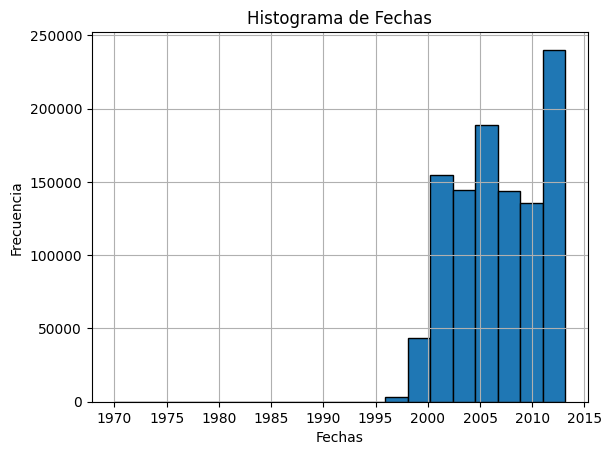

In [ ]:
plt.hist(df3['d_review_time'], bins=20, edgecolor='k')
plt.title('Histograma de Fechas')
plt.xlabel('Fechas')
plt.ylabel('Frecuencia')
plt.grid(True)

plt.show()

vemos que la mayoria de registros corresponden de 1995 a 2015, esto corresponde con la definicion del dataset donde explican que las calificaciones fueron hechas entre 1996 y 2014, revisemos los que son menores a 1996

In [ ]:
df3[df3['d_review_time'].dt.year < 1996]

,id,t_title,id_user,t_profile_name,c_review_helpfulness,c_review_score,d_review_time,t_review_summary,t_review_text,t_title_clean,c_n_cal_review
856105,B000G167FA,Silver Pennies,AAFZZHA2I598B,byron c benson,1.0,5.0,1969-12-31 23:59:59,an incomparable children s classic,this book of children s poems has been enjoyed...,silver pennies,4
884661,0786280670,"Julie and Julia: 365 Days, 524 Recipes, 1 Tiny...",AE3SEXFJCQLJQ,denise keppel,0.7,1.0,1969-12-31 23:59:59,meanspirited woman,the writing was okayish but these details from...,julie and julia 365 days 524 recipes 1 tiny ap...,10
953154,0786280670,"Julie and Julia: 365 Days, 524 Recipes, 1 Tiny...",AMB2Z4FMDBWQY,vidfan specfellow,0.7,2.0,1969-12-31 23:59:59,narcissistic hipsters should cook not write,after seeing the movie i knew what i was in fo...,julie and julia 365 days 524 recipes 1 tiny ap...,10
1032838,B000G167FA,Silver Pennies,AWVWX5F3YEJKZ,shadowhawk,1.0,5.0,1969-12-31 23:59:59,found again,this book was given to me over 30 years ago by...,silver pennies,18
1053963,B000G167FA,Silver Pennies,AZUNT3QP2CWTL,ellen c falkenberry ellenf,1.0,5.0,1969-12-31 23:59:59,have you ever watched the fairies when the rai...,although the new cover looks more like a book ...,silver pennies,5


la fecha posteriormente se va a ocupar, dado que no sabemos cuando se califico el libro vamos a eliminar estos registros

In [ ]:
df3 = df3[~(df3['d_review_time'].dt.year <= 1996)]

In [ ]:
df3['d_review_time'].describe()

count                          1054894
mean     2006-10-24 22:13:35.012693760
min                1997-01-24 00:00:00
25%                2003-04-25 00:00:00
50%                2006-08-08 00:00:00
75%                2010-08-24 00:00:00
max                2013-03-04 00:00:00
Name: d_review_time, dtype: object

**d_published_date**

In [ ]:
pd.to_datetime(df4['d_published_date']).dtype

OutOfBoundsDatetime: Out of bounds nanosecond timestamp: 1-01-01 00:00:00, at position 79

vemos que python tiene problemas con la fecha que colocamos como 1-01-01 para sustituir los casos sin informacion, vamos a sustituir eso por el año 1680

In [ ]:
df4['d_published_date'] = pd.to_datetime(df4['d_published_date'], errors='coerce')
df4['d_published_date'] = df4['d_published_date'].fillna(pd.to_datetime('1680-01-01'))

In [ ]:
df4['d_published_date'].describe()

count                           182124
mean     1994-07-25 23:54:56.857086464
min                1680-01-01 00:00:00
25%                1993-01-01 00:00:00
50%                2002-01-01 00:00:00
75%                2010-01-01 00:00:00
max                2030-12-31 00:00:00
Name: d_published_date, dtype: object

hagamos un histograma

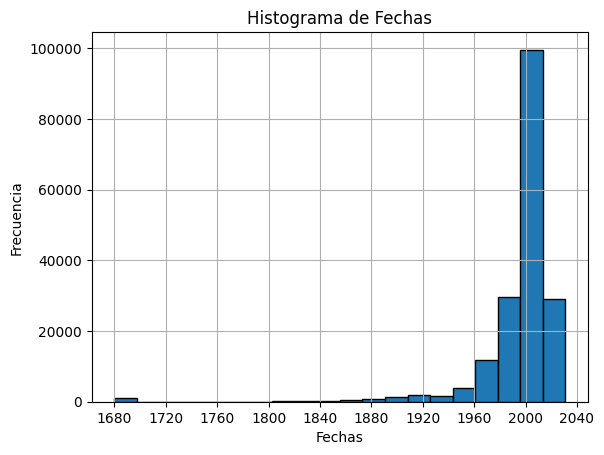

In [ ]:
plt.hist(df4['d_published_date'], bins=20, edgecolor='k')
plt.title('Histograma de Fechas')
plt.xlabel('Fechas')
plt.ylabel('Frecuencia')
plt.grid(True)

plt.show()

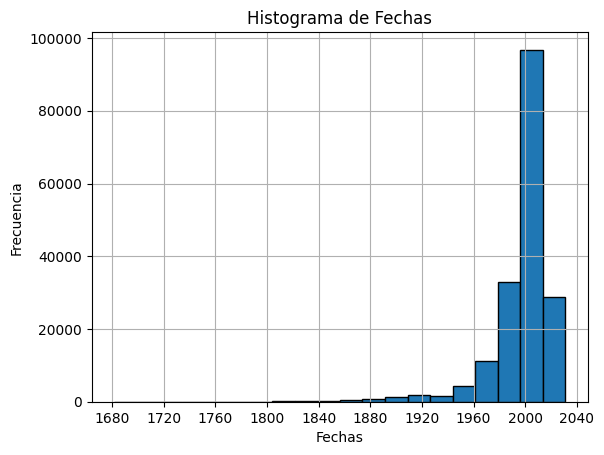

In [ ]:
plt.hist(df4.loc[df4['d_published_date'].dt.year > 1680,'d_published_date'], bins=20, edgecolor='k')
plt.title('Histograma de Fechas')
plt.xlabel('Fechas')
plt.ylabel('Frecuencia')
plt.grid(True)

plt.show()

filtremos por fechas mayores a 1680 que nosotros pusimos a proposito

aún hay fechas atipicas, estas fechas podrían ser correctas ya que el uso de libros no es algo moderno, lo que no es posible es tene r libros que se publicaron despues del año 2014 o despues de la máxima fecha calificacion para ese libro, revisemos el primer caso

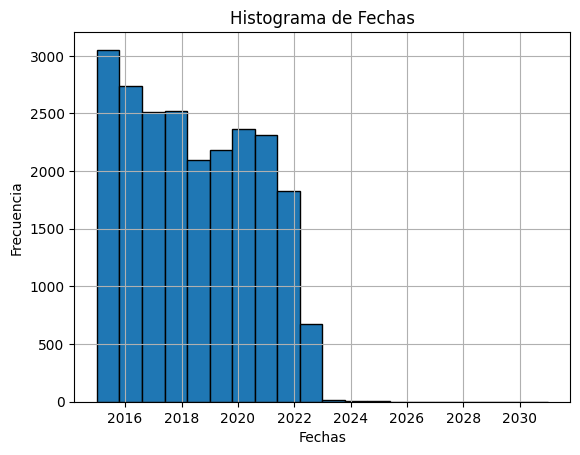

In [ ]:
plt.hist(df4.loc[df4['d_published_date'].dt.year > 2014,'d_published_date'], bins=20, edgecolor='k')
plt.title('Histograma de Fechas')
plt.xlabel('Fechas')
plt.ylabel('Frecuencia')
plt.grid(True)

plt.show()

actualizamos la fecha de estos libros a 1980, que es la fecha de libros si informacion correcta de la fechaa

In [ ]:
df4.loc[df4['d_published_date'].dt.year > 2014,'d_published_date'] =  pd.to_datetime('1680-01-01')

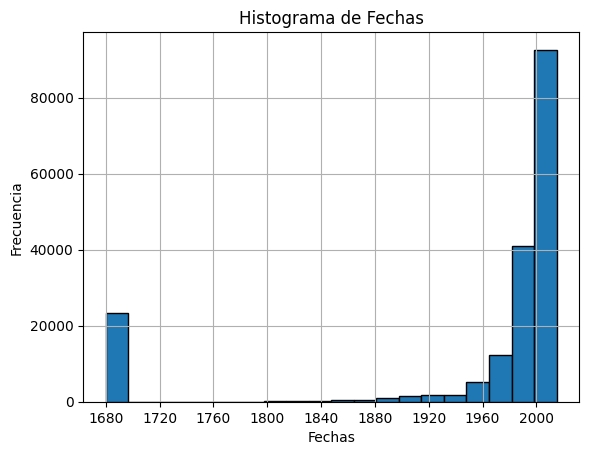

In [ ]:
plt.hist(df4['d_published_date'], bins=20, edgecolor='k')
plt.title('Histograma de Fechas')
plt.xlabel('Fechas')
plt.ylabel('Frecuencia')
plt.grid(True)

plt.show()

revisemo el segundo caso

In [ ]:
max_fechas = df3.groupby('t_title')['d_review_time'].max()
max_fechas = max_fechas.reset_index()
max_fechas

,t_title,d_review_time
0,""" Film technique, "" and, "" Film acting """,2000-02-05
1,""" We'll Always Have Paris"": The Definitive Gui...",2007-12-27
2,"""A Titanic hero"" Thomas Andrews, shipbuilder",2000-09-25
3,"""A Truthful Impression of the Country"": Britis...",2005-08-08
4,"""A careless word-- a needless sinking"": A hist...",1999-04-23
...,...,...
140733,where's chimpy?,2002-12-01
140734,why only words: poems,2005-07-30
140735,wide is the gate,2011-04-10
140736,william the vehicle king,2007-11-18


In [ ]:
union  = max_fechas.merge(df4[['t_title','d_published_date']], on = 't_title')

In [ ]:
union = union[union['d_review_time'] < union['d_published_date']]
union

,t_title,d_review_time,d_published_date
0,""" Film technique, "" and, "" Film acting """,2000-02-05,2008-11-01
16,"""Call me mister.""",2003-03-12,2012-01-01
41,"""I Liked Your Profile"": Experiences in Gay Onl...",2007-09-18,2010-04-01
43,"""I dream of the day..."": Letters from Caleb Mi...",2006-12-11,2014-08-15
45,"""In the Days of Serfdom"" and Other Stories (Pi...",2002-12-18,2014-10-24
...,...,...,...
121827,the Greengage Summer,2010-09-25,2011-08-11
121834,the Techniques of Brazilian Jiu-jitsu,2004-05-14,2007-05-15
121836,the bedroom assignment (tango),2007-05-08,2009-08-04
121845,the god that failed,2012-03-13,2013-03-01


estos casos tambien se pasan a sin informacion

In [ ]:
df4.loc[df4['t_title'].isin(union['t_title']),'d_published_date'] =  pd.to_datetime('1680-01-01')


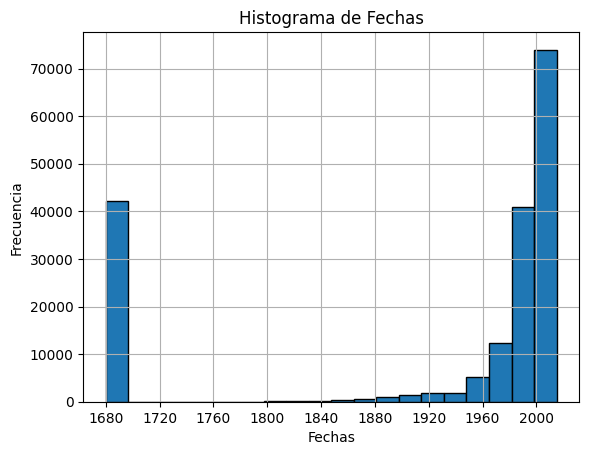

In [ ]:
plt.hist(df4['d_published_date'], bins=20, edgecolor='k')
plt.title('Histograma de Fechas')
plt.xlabel('Fechas')
plt.ylabel('Frecuencia')
plt.grid(True)

plt.show()

ahora dado que tenemos muchos datos sin informacion es mejor normalizar y asignar una categoria de 'sin informacion' para estos casos

In [ ]:
fecha_referencia = pd.to_datetime('1680-01-01')
cat = pd.qcut(df4.loc[df4['d_published_date'] > fecha_referencia, 'd_published_date'], q=5)
df4 = df4.drop('d_published_date', axis  = 1)
df4 = df4.merge(cat, left_index=True, right_index=True, how = 'left')

In [ ]:
df4['d_published_date'] = df4['d_published_date'].cat.add_categories('no information')
df4['d_published_date'] = df4['d_published_date'].fillna('no information')
df4

,t_title,t_description,t_authors,t_publisher,v_categories,t_title_clean,d_published_date
0,Its Only Art If Its Well Hung!,no information,[julie strain],no information,"[comics, graphic novels]",its only art if its well hung,"(1984-01-01, 1996-08-01]"
1,Dr. Seuss: American Icon,philip nel takes a fascinating look into the k...,[philip nel],a c black,"[biography, autobiography]",dr seuss american icon,"(2001-01-01, 2005-01-01]"
2,Wonderful Worship in Smaller Churches,this resource includes twelve principles in un...,[david r ray],no information,[religion],wonderful worship in smaller churches,"(1996-08-01, 2001-01-01]"
3,Whispers of the Wicked Saints,julia thomas finds her life spinning out of co...,[veronica haddon],iuniverse,[fiction],whispers of the wicked saints,"(2005-01-01, 2014-12-31]"
4,"Nation Dance: Religion, Identity and Cultural ...",no information,[edward long],no information,[no information],nation dance religion identity and cultural di...,"(2001-01-01, 2005-01-01]"
...,...,...,...,...,...,...,...
182119,The Orphan Of Ellis Island (Time Travel Advent...,during a school trip to ellis island dominick ...,[elvira woodruff],scholastic paperbacks,[juvenile fiction],the orphan of ellis island time travel adventures,"(1996-08-01, 2001-01-01]"
182120,Red Boots for Christmas,everyone in the village of friedensdorf is hap...,[no information],no information,[juvenile fiction],red boots for christmas,"(1984-01-01, 1996-08-01]"
182121,Mamaw,give your mamaw a useful beautiful and thought...,[wild wild cabbage],no information,[no information],mamaw,no information
182122,The Autograph Man,alex li tandem sells autographs his business i...,[zadie smith],vintage,[fiction],the autograph man,"(2001-01-01, 2005-01-01]"


([0, 1, 2, 3, 4, 5],
 [Text(0, 0, 'no information'),
  Text(1, 0, '(1996-08-01, 2001-01-01]'),
  Text(2, 0, '(2001-01-01, 2005-01-01]'),
  Text(3, 0, '(1681-12-31 23:59:59.999999999, 1984-01-01]'),
  Text(4, 0, '(1984-01-01, 1996-08-01]'),
  Text(5, 0, '(2005-01-01, 2014-12-31]')])

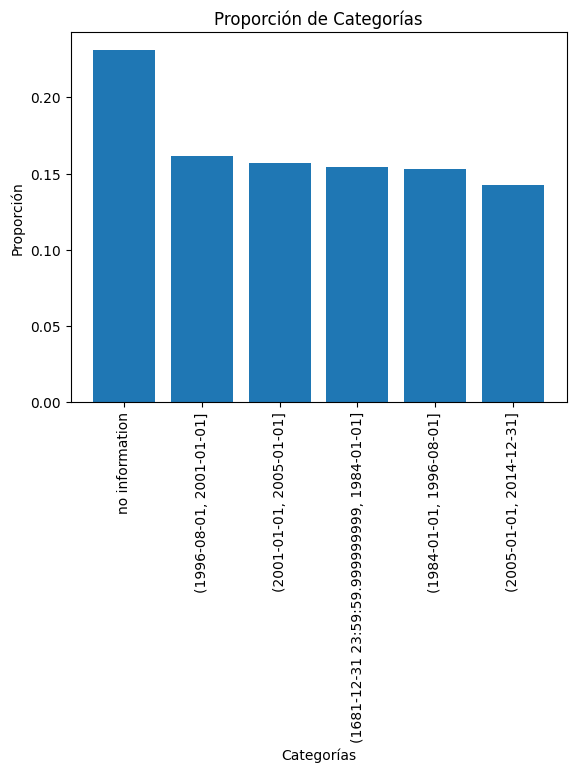

In [ ]:
df4['d_published_date'] = df4['d_published_date'].astype(str)

proporciones = df4['d_published_date'].value_counts(normalize=True)

plt.bar(proporciones.index, proporciones.values)
plt.title('Proporción de Categorías')
plt.xlabel('Categorías')
plt.ylabel('Proporción')
plt.xticks(rotation=90)

In [ ]:
df4['d_published_date'].value_counts()

d_published_date
no information                                 42099
(1996-08-01, 2001-01-01]                       29454
(2001-01-01, 2005-01-01]                       28610
(1681-12-31 23:59:59.999999999, 1984-01-01]    28144
(1984-01-01, 1996-08-01]                       27903
(2005-01-01, 2014-12-31]                       25914
Name: count, dtype: int64

### variables categoricas

**v_categories**

recordemos que cada registro contiene una lista de categorias, obtengamos todas las posibles categorias primero

In [ ]:
dist_cat = df4.explode('v_categories')['v_categories'].unique()
dist_cat

array(['comics', 'graphic novels', 'biography', ...,
       'portsmouth island n c', 'tobacco',
       'flame in the wind motion picture'], dtype=object)

In [ ]:
df4.explode('v_categories')['v_categories'].value_counts(1)

v_categories
fiction                             0.107985
no information                      0.072147
religion                            0.044000
history                             0.043333
juvenile fiction                    0.030843
                                      ...   
cassino italy battle of 1944        0.000005
dramatists irish                    0.000005
denison tex                         0.000005
crayfish                            0.000005
flame in the wind motion picture    0.000005
Name: proportion, Length: 10535, dtype: float64

tenemos 10535 categoricas y hay categorias que solo aparecen una vez, primero vamos a calcular una distancia de palabras a fin de detectar aquellos casos que se refieren a la misma categoria pero cambian una o dos letras

In [ ]:
dist_cat = dist_cat.tolist()

In [ ]:
frecuencia = 100
resultados = []
for i, palabra in enumerate(dist_cat, 1):
    resultado = diff_text(palabra, dist_cat)
    if i % frecuencia == 0:
        print(f"Palabras procesadas hasta ahora: {i}")
    resultados.append(resultado)

Palabras procesadas hasta ahora: 100
Palabras procesadas hasta ahora: 200
Palabras procesadas hasta ahora: 300
Palabras procesadas hasta ahora: 400
Palabras procesadas hasta ahora: 500
Palabras procesadas hasta ahora: 600
Palabras procesadas hasta ahora: 700
Palabras procesadas hasta ahora: 800
Palabras procesadas hasta ahora: 900
Palabras procesadas hasta ahora: 1000
Palabras procesadas hasta ahora: 1100
Palabras procesadas hasta ahora: 1200
Palabras procesadas hasta ahora: 1300
Palabras procesadas hasta ahora: 1400
Palabras procesadas hasta ahora: 1500
Palabras procesadas hasta ahora: 1600
Palabras procesadas hasta ahora: 1700
Palabras procesadas hasta ahora: 1800
Palabras procesadas hasta ahora: 1900
Palabras procesadas hasta ahora: 2000
Palabras procesadas hasta ahora: 2100
Palabras procesadas hasta ahora: 2200
Palabras procesadas hasta ahora: 2300
Palabras procesadas hasta ahora: 2400
Palabras procesadas hasta ahora: 2500
Palabras procesadas hasta ahora: 2600
Palabras procesadas h

In [ ]:
df_resultados = pd.DataFrame(resultados, columns=['Palabra Original', 'Palabra Más Similar', 'Distancia de Levenshtein'])

In [ ]:
simil = df_resultados[df_resultados['Distancia de Levenshtein'] < 2 ]
simil

,Palabra Original,Palabra Más Similar,Distancia de Levenshtein
4,religion,religions,1
5,fiction,diction,1
7,social science,social sciences,1
36,art,arts,1
46,meditations,meditation,1
...,...,...,...
10491,hope,home,1
10494,lunenburg county va,lunenberg county va,1
10495,cookery beer,cookery beef,1
10517,hearing,healing,1


de este dataframe vamos a agregarle la proporcion de datos que tiene cada categoria

In [ ]:
prop = df4.explode('v_categories')['v_categories'].value_counts(1).reset_index()
simil = simil.merge(prop, left_on = 'Palabra Original', right_on = 'v_categories')
simil = simil.drop('v_categories', axis = 1)
simil = simil.rename(columns={'proportion': 'proportion Palabra Original'})
simil = simil.merge(prop, left_on = 'Palabra Más Similar', right_on = 'v_categories')
simil = simil.drop('v_categories', axis = 1)
simil = simil.rename(columns={'proportion': 'proportion Palabra Más Similar'})
simil

,Palabra Original,Palabra Más Similar,Distancia de Levenshtein,proportion Palabra Original,proportion Palabra Más Similar
0,religion,religions,1,0.044000,0.000052
1,fiction,diction,1,0.107985,0.000005
2,social science,social sciences,1,0.017952,0.000071
3,art,arts,1,0.009681,0.000086
4,meditations,meditation,1,0.000086,0.000105
...,...,...,...,...,...
403,charts,charms,1,0.000005,0.000033
404,marines,marinas,1,0.000005,0.000005
405,lunenburg county va,lunenberg county va,1,0.000005,0.000005
406,cookery beer,cookery beef,1,0.000005,0.000005


vamos a conservar la actegoria con más proporcion de los datos

In [ ]:
simil['selected'] = simil.apply(lambda row: row['Palabra Original'] if row['proportion Palabra Original'] > row['proportion Palabra Más Similar'] else row['Palabra Más Similar'], axis=1)
simil

,Palabra Original,Palabra Más Similar,Distancia de Levenshtein,proportion Palabra Original,proportion Palabra Más Similar,selected
0,religion,religions,1,0.044000,0.000052,religion
1,fiction,diction,1,0.107985,0.000005,fiction
2,social science,social sciences,1,0.017952,0.000071,social science
3,art,arts,1,0.009681,0.000086,art
4,meditations,meditation,1,0.000086,0.000105,meditation
...,...,...,...,...,...,...
403,charts,charms,1,0.000005,0.000033,charms
404,marines,marinas,1,0.000005,0.000005,marinas
405,lunenburg county va,lunenberg county va,1,0.000005,0.000005,lunenberg county va
406,cookery beer,cookery beef,1,0.000005,0.000005,cookery beef


la columna selectecd es la que se queda, ahora vamos a sustituir los valores

In [ ]:
frecuencia = 2000
count = 0
for index, row in df4.iterrows():
    count += 1
    for category in row['v_categories']:
        mask = (simil['Palabra Original'] == category) | (simil['Palabra Más Similar'] == category)
        if mask.any():
            selected_value = simil.loc[mask, 'selected'].values[0]
            df4.at[index, 'v_categories'][row['v_categories'].index(category)] = selected_value
    if count % frecuencia == 0:
        print(f"Palabras procesadas hasta ahora: {count}")


Palabras procesadas hasta ahora: 2000
Palabras procesadas hasta ahora: 4000
Palabras procesadas hasta ahora: 6000
Palabras procesadas hasta ahora: 8000
Palabras procesadas hasta ahora: 10000
Palabras procesadas hasta ahora: 12000
Palabras procesadas hasta ahora: 14000
Palabras procesadas hasta ahora: 16000
Palabras procesadas hasta ahora: 18000
Palabras procesadas hasta ahora: 20000
Palabras procesadas hasta ahora: 22000
Palabras procesadas hasta ahora: 24000
Palabras procesadas hasta ahora: 26000
Palabras procesadas hasta ahora: 28000
Palabras procesadas hasta ahora: 30000
Palabras procesadas hasta ahora: 32000
Palabras procesadas hasta ahora: 34000
Palabras procesadas hasta ahora: 36000
Palabras procesadas hasta ahora: 38000
Palabras procesadas hasta ahora: 40000
Palabras procesadas hasta ahora: 42000
Palabras procesadas hasta ahora: 44000
Palabras procesadas hasta ahora: 46000
Palabras procesadas hasta ahora: 48000
Palabras procesadas hasta ahora: 50000
Palabras procesadas hasta aho

In [ ]:
df4.explode('v_categories')['v_categories'].value_counts(1)

v_categories
fiction                             0.107990
no information                      0.072147
religion                            0.044052
history                             0.043333
juvenile fiction                    0.030843
                                      ...   
spanish drama comedy                0.000005
oral communication                  0.000005
artists german                      0.000005
burke county ga                     0.000005
flame in the wind motion picture    0.000005
Name: proportion, Length: 10328, dtype: float64

obtenemos aquellas registros cuya suma acumulada corresponden al 90% de los datos

In [ ]:
tmp = df4.explode('v_categories')['v_categories'].value_counts(1).reset_index()
tmp = tmp[tmp['proportion'].cumsum() < 0.9]
tmp

,v_categories,proportion
0,fiction,0.107990
1,no information,0.072147
2,religion,0.044052
3,history,0.043333
4,juvenile fiction,0.030843
...,...,...
438,catholics,0.000076
439,hinduism,0.000076
440,netherlands,0.000076
441,hymns english,0.000076


estos se van a normalizar manualmente

In [ ]:
categorias_generales = {
    'religion': [
        'religion', 'christianity', 'buddhism', 'islam', 'judaism', 'hinduism', 'bible', 'prayer',
        'christian life', 'spiritual life', 'church history', 'christian fiction', 'theology', 'christianity and other religions','god',
        'literary criticism','spirit','occultism'
    ],
    'history': [
        'history', 'american history', 'world history', 'historical fiction', 'civilization', 'world war 1939 1945',
        'world war 1914 1918', 'american literature', 'americans', 'africa', 'america', 'africa', 'american wit and humor',
        'bibliography national', 'europe', 'union catalogs', 'france', 'great britain', 'ireland', 'germany', 'greece',
        'mexico', 'scotland', 'austria', 'arctic regions', 'egypt', 'china', 'japan', 'india', 'russia', 'spain',
        'france', 'england', 'california', 'canada', 'canada imprints', 'latin america', 'mexico', 'middle east', 'poland',
        'economics','america', 'united states','capitalism','current events', 'alaska', 'chicago ill', 'new york n y', 'asian', 'latin', 'south', 'canadian', 'mexican', 'egyptian', 'persian', 'medieval', 'civilization modern', 'ancient',
        'byzantine empire', 'americans', 'europe', 'revolution', 'united states'
    ],
    'fiction': [
        'fiction', 'science fiction', 'fantasy fiction', 'mystery', 'adventure', 'horror tales','juvenile fiction',
        'detective and mystery stories', 'historical fiction', 'detective and mystery stories american',
        'detective and mystery stories english', 'fantasy fiction american', 'fantasy fiction american',
        'fantasy games', 'science fiction american', 'science fiction english','young adult fiction'
        'western stories', 'english fiction', 'english drama', 'ghosts',  'domestic fiction','adventure'
        'young adult fiction', 'fantasy', 'adventure stories', 'fairy tales',
        'dungeons and dragons game', 'science fiction', 'horror tales', 'mystery', 'true crime', 'detective and mystery stories',
        'detective and mystery stories american', 'detective and mystery stories english', 'historical fiction', 'western stories',
        'romance fiction', 'fantasy fiction', 'science fiction american', 'fantasy games', 'fantasy fiction american', 'science fiction english',
        'science fiction american', 'adventure and adventurers', 'fantasy fiction', 'fiction in english','american fiction','adventure stories','adventure and adventurers'

    ],
    'drama and novels':[ 'romance', 'drama',  'romance fiction', 'novels', 'graphic novels','literary collections','love stories'],
    'art':['english literature', 'english poetry','motion pictures','art', 'photography', 'painting', 'sculpture', 'artists', 'architecture', 'design','performing arts','antiques',
            'collectibles','architecture', 'architecture domestic', 'architects', 'design', 'urban planning','building','paperbacks',
          'arts and crafts', 'crafts','poetry','american poetry','motion picture actors and actresses'
],
    'education': ['business', 'education','disciplines','philosophy','reference','transportation','pets','french language', 'german language',
                  'spanish language', 'japanese language','characters and characteristics in literature','ethics','evolution','academic',
                 'genealogy','sex','language arts', 'language and languages', 'english language', 'foreign language study', 'linguistics', 'languages',
                 'education','teaching', 'school', 'college', 'college students', 'educational','study aids', 'children s libraries', 'college students', 'college readers', 'education', 'teaching', 'school',
        'educational', 'language arts', 'english language', 'foreign language study', 'linguistics', 'languages','study aids','cats','encyclopedias and dictionaries'
    ],
    'entertainment':['entertainment','comics','games','humor', 'true crime','country life','dreams','board books', 'magic','horoscopes',
                    'activities','hobbies', 'DIY', 'handicraft', 'crafting','comic books strips etc','automobiles','actors','dungeons and dragons game'
],
    'science and technology': [
        'science', 'biology', 'chemistry', 'physics', 'astronomy', 'mathematics', 'geology', 'botany', 'zoology',
        'computers', 'computer networks', 'computer industry', 'programming', 'software', 'hardware', 'biology',
        'chemistry', 'physics', 'astronomy', 'mathematics', 'computers','geology','engineering', 'technology','astrology',
        'archaeology','computers', 'computer networks', 'computer industry', 'programming', 'software', 'hardware', 'data science', 'cybersecurity',
    'algebra','aeronautics', 'airplanes', 'technology', 'computer programming', 'information technology','electronic books','aeronautics'
],
    'mental health': ['psychology', 'mental health','therapy','family', 'families','relationships', 'aging','parenting', 'marriage', 'love', 'friendship', 'divorce',
                      'interpersonal relations','adoption','self help', 'fitness', 'body mind', 'psychology', 'mental health', 'motivation',
                     'mental health', 'psychology', 'psychoanalysis', 'consciousness', 'psychoanalysis', 'depression'],
    'sports': ['sports', 'recreation', 'baseball', 'football', 'basketball', 'soccer', 'hockey', 'golf', 'tennis', 'swimming', 'exercise'],
    'music': ['music', 'musical', 'musicians', 'composers', 'music history','popular music'],
    'health': ['health',  'diet', 'medicine', 'nutrition', 'wellness', 'alternative medicine','cancer','medical',  'medicine',],
    'economy and politics': ['business', 'economics', 'management', 'finance', 'marketing', 'advertising', 'entrepreneurship',
                            'finance personal','political science', 'social science', 'government', 'sociology', 'law','presidents','communism'],
    'travels': ['travel', 'exploration', 'geography', 'maps', 'hiking','travel', 'adventure', 'exploration', 'geography', 'maps', 'hiking', 'explorers','nature'],
    'children and young people': ['children', 'juvenile nonfiction', 'children s literature',
                        'young adult nonfiction', 'children s stories','do it yourself'],
    'home and gardening': ['home', 'house', 'gardening', 'gardens', 'home design', 'interior decorating','decoration and ornament',
                          'cooking', 'cookbooks', 'cookery','cooking', 'cookbooks', 'cookery', 'recipes','chess','cooking american','agriculture'],
    'biography':['biography', 'autobiography', 'memoir', 'autobiography'],

    'no information' :['no information','short stories','audiobooks','copyright','women','aesthetics','marriage','adultery','etiquette',
                      'authors', 'authors american', 'authors english',  'books']
    }



vamos a sustituir las categorias por las categorias normalizadas, las que no se encuentren entre las que normalizamos les asignamos 'no information'

In [ ]:
df4['v_old_categories'] =  df4['v_categories']
count = 0
for index, row in df4.iterrows():
    count += 1
    nuevas_categorias = []
    for categoria in row['v_categories']:
        categoria_final = 'no information'
        for generica, palabras_clave in categorias_generales.items():
            if categoria.lower() in palabras_clave:
                categoria_final = generica
                break
        nuevas_categorias.append(categoria_final)
    df4.at[index, 'v_categories'] = nuevas_categorias

In [ ]:
df4

,t_title,t_description,t_authors,t_publisher,v_categories,t_title_clean,d_published_date,v_old_categories
0,Its Only Art If Its Well Hung!,no information,[julie strain],no information,"[entertainment, drama and novels]",its only art if its well hung,"(1984-01-01, 1996-08-01]","[comics, graphic novels]"
1,Dr. Seuss: American Icon,philip nel takes a fascinating look into the k...,[philip nel],a c black,"[biography, biography]",dr seuss american icon,"(2001-01-01, 2005-01-01]","[biography, autobiography]"
2,Wonderful Worship in Smaller Churches,this resource includes twelve principles in un...,[david r ray],no information,[religion],wonderful worship in smaller churches,"(1996-08-01, 2001-01-01]",[religion]
3,Whispers of the Wicked Saints,julia thomas finds her life spinning out of co...,[veronica haddon],iuniverse,[fiction],whispers of the wicked saints,"(2005-01-01, 2014-12-31]",[fiction]
4,"Nation Dance: Religion, Identity and Cultural ...",no information,[edward long],no information,[no information],nation dance religion identity and cultural di...,"(2001-01-01, 2005-01-01]",[no information]
...,...,...,...,...,...,...,...,...
182119,The Orphan Of Ellis Island (Time Travel Advent...,during a school trip to ellis island dominick ...,[elvira woodruff],scholastic paperbacks,[fiction],the orphan of ellis island time travel adventures,"(1996-08-01, 2001-01-01]",[juvenile fiction]
182120,Red Boots for Christmas,everyone in the village of friedensdorf is hap...,[no information],no information,[fiction],red boots for christmas,"(1984-01-01, 1996-08-01]",[juvenile fiction]
182121,Mamaw,give your mamaw a useful beautiful and thought...,[wild wild cabbage],no information,[no information],mamaw,no information,[no information]
182122,The Autograph Man,alex li tandem sells autographs his business i...,[zadie smith],vintage,[fiction],the autograph man,"(2001-01-01, 2005-01-01]",[fiction]


In [ ]:
df4.explode('v_categories')['v_categories'].value_counts(1)

v_categories
no information               0.205913
fiction                      0.147599
education                    0.093514
history                      0.085642
religion                     0.071762
biography                    0.058633
mental health                0.057562
science and technology       0.056900
art                          0.048328
economy and politics         0.032681
entertainment                0.024328
sports                       0.022228
health                       0.020300
home and gardening           0.019562
children and young people    0.018867
travels                      0.014276
drama and novels             0.011690
music                        0.010214
Name: proportion, dtype: float64

ahora vamos a recorrer todos los registros, y si hay listas con más de un elemento y uno de estos es 'no information', eliminamos ese valor de la lista]

In [ ]:
df4['v_categories'] = df4['v_categories'].apply(limpiar_lista)
df4

,t_title,t_description,t_authors,t_publisher,v_categories,t_title_clean,d_published_date,v_old_categories
0,Its Only Art If Its Well Hung!,no information,[julie strain],no information,"[entertainment, drama and novels]",its only art if its well hung,"(1984-01-01, 1996-08-01]","[comics, graphic novels]"
1,Dr. Seuss: American Icon,philip nel takes a fascinating look into the k...,[philip nel],a c black,"[biography, biography]",dr seuss american icon,"(2001-01-01, 2005-01-01]","[biography, autobiography]"
2,Wonderful Worship in Smaller Churches,this resource includes twelve principles in un...,[david r ray],no information,[religion],wonderful worship in smaller churches,"(1996-08-01, 2001-01-01]",[religion]
3,Whispers of the Wicked Saints,julia thomas finds her life spinning out of co...,[veronica haddon],iuniverse,[fiction],whispers of the wicked saints,"(2005-01-01, 2014-12-31]",[fiction]
4,"Nation Dance: Religion, Identity and Cultural ...",no information,[edward long],no information,[no information],nation dance religion identity and cultural di...,"(2001-01-01, 2005-01-01]",[no information]
...,...,...,...,...,...,...,...,...
182119,The Orphan Of Ellis Island (Time Travel Advent...,during a school trip to ellis island dominick ...,[elvira woodruff],scholastic paperbacks,[fiction],the orphan of ellis island time travel adventures,"(1996-08-01, 2001-01-01]",[juvenile fiction]
182120,Red Boots for Christmas,everyone in the village of friedensdorf is hap...,[no information],no information,[fiction],red boots for christmas,"(1984-01-01, 1996-08-01]",[juvenile fiction]
182121,Mamaw,give your mamaw a useful beautiful and thought...,[wild wild cabbage],no information,[no information],mamaw,no information,[no information]
182122,The Autograph Man,alex li tandem sells autographs his business i...,[zadie smith],vintage,[fiction],the autograph man,"(2001-01-01, 2005-01-01]",[fiction]


ahora revisemos los libros donde tengan más de una categoria

In [ ]:
df4['len_cat']  = df4['v_categories'].apply(lambda x: len(x))
df4.len_cat.value_counts(1)

len_cat
1    0.846950
2    0.153033
0    0.000016
Name: proportion, dtype: float64

dado que es muy poco el porcentaje de registros que tienen 2 categrias, vamos a conservar solo una ya que el manejar dos implica un esfuerzo mayor y no son muchos los casos

In [ ]:
df4['v_categories'] = df4['v_categories'].apply(lambda x: x[0] if x else None)
df4['v_categories'] = df4['v_categories'].astype('object')
df4

,t_title,t_description,t_authors,t_publisher,v_categories,t_title_clean,d_published_date,v_old_categories,len_cat
0,Its Only Art If Its Well Hung!,no information,[julie strain],no information,entertainment,its only art if its well hung,"(1984-01-01, 1996-08-01]","[comics, graphic novels]",2
1,Dr. Seuss: American Icon,philip nel takes a fascinating look into the k...,[philip nel],a c black,biography,dr seuss american icon,"(2001-01-01, 2005-01-01]","[biography, autobiography]",2
2,Wonderful Worship in Smaller Churches,this resource includes twelve principles in un...,[david r ray],no information,religion,wonderful worship in smaller churches,"(1996-08-01, 2001-01-01]",[religion],1
3,Whispers of the Wicked Saints,julia thomas finds her life spinning out of co...,[veronica haddon],iuniverse,fiction,whispers of the wicked saints,"(2005-01-01, 2014-12-31]",[fiction],1
4,"Nation Dance: Religion, Identity and Cultural ...",no information,[edward long],no information,no information,nation dance religion identity and cultural di...,"(2001-01-01, 2005-01-01]",[no information],1
...,...,...,...,...,...,...,...,...,...
182119,The Orphan Of Ellis Island (Time Travel Advent...,during a school trip to ellis island dominick ...,[elvira woodruff],scholastic paperbacks,fiction,the orphan of ellis island time travel adventures,"(1996-08-01, 2001-01-01]",[juvenile fiction],1
182120,Red Boots for Christmas,everyone in the village of friedensdorf is hap...,[no information],no information,fiction,red boots for christmas,"(1984-01-01, 1996-08-01]",[juvenile fiction],1
182121,Mamaw,give your mamaw a useful beautiful and thought...,[wild wild cabbage],no information,no information,mamaw,no information,[no information],1
182122,The Autograph Man,alex li tandem sells autographs his business i...,[zadie smith],vintage,fiction,the autograph man,"(2001-01-01, 2005-01-01]",[fiction],1


In [ ]:
df4 = df4.drop('len_cat', axis = 1)

### Variables de texto

**t_authors**

In [ ]:
df4.explode('t_authors')['t_authors'].value_counts()

t_authors
no information                                    5852
rose arny                                          236
william shakespeare                                180
library of congress copyright office               178
louis l amour                                      121
                                                  ... 
ralph r premdas                                      1
steve bucci                                          1
alfred d chandler peter hagstrom orjan solvell       1
greg mast                                            1
david b johnson thomas a mowry                       1
Name: count, Length: 126148, dtype: int64

no nos interesan los autores que solo aparecen una vez, stos valores los ponemos a 'sin informacion'

In [ ]:
tmp = df4.explode('t_authors')['t_authors'].value_counts()
tmp = tmp[tmp<2]
tmp = tmp.reset_index()
tmp

,t_authors,count
0,wayne sandholtz berkeley roundtable on the int...,1
1,susan brittain karen manthey julie holetz,1
2,samuel d marshall,1
3,linda holbeche,1
4,paras h shah derek j lomas,1
...,...,...
104830,anthony bruce,1
104831,mark bradley,1
104832,peter lancaster ter lancaster miron tismenetsk...,1
104833,jerrold e sloniger,1


In [ ]:

frecuencia = 500
for index, row in df4.iterrows():
    nuevas_categorias = []
    for categoria in row['t_authors']:
        categoria_final =  categoria
        if categoria.lower() not in tmp['t_authors'].tolist():
            categoria_final = 'no information'
        nuevas_categorias.append(categoria_final)
    df4.at[index, 't_authors'] = nuevas_categorias
    if i % frecuencia == 0:
        print(f"Palabras procesadas hasta ahora: {i}")

KeyboardInterrupt: 

In [ ]:
df4.explode('t_authors')['t_authors'].value_counts()

t_authors
no information                          110851
rose arny                                  236
william shakespeare                        180
library of congress copyright office       178
louis l amour                              121
                                         ...  
james fitz james caldwell                    2
brian k vaughan                              2
blake harrison alexander rappaport           2
john habberton                               2
david m theobald                             2
Name: count, Length: 21149, dtype: int64

vamos a calcular diferencia de texto para intentar reducir el numero de autores

In [ ]:
dist_cat = df4.explode('t_authors')['t_authors'].unique()
dist_cat
frecuencia = 500
resultados = []
for i, palabra in enumerate(dist_cat, 1):
    resultado = diff_text(palabra, dist_cat)
    if i % frecuencia == 0:
        print(f"Palabras procesadas hasta ahora: {i}")
    resultados.append(resultado)

Palabras procesadas hasta ahora: 500
Palabras procesadas hasta ahora: 1000
Palabras procesadas hasta ahora: 1500
Palabras procesadas hasta ahora: 2000
Palabras procesadas hasta ahora: 2500
Palabras procesadas hasta ahora: 3000
Palabras procesadas hasta ahora: 3500
Palabras procesadas hasta ahora: 4000
Palabras procesadas hasta ahora: 4500
Palabras procesadas hasta ahora: 5000
Palabras procesadas hasta ahora: 5500
Palabras procesadas hasta ahora: 6000
Palabras procesadas hasta ahora: 6500
Palabras procesadas hasta ahora: 7000
Palabras procesadas hasta ahora: 7500
Palabras procesadas hasta ahora: 8000
Palabras procesadas hasta ahora: 8500
Palabras procesadas hasta ahora: 9000
Palabras procesadas hasta ahora: 9500
Palabras procesadas hasta ahora: 10000
Palabras procesadas hasta ahora: 10500
Palabras procesadas hasta ahora: 11000
Palabras procesadas hasta ahora: 11500
Palabras procesadas hasta ahora: 12000
Palabras procesadas hasta ahora: 12500
Palabras procesadas hasta ahora: 13000
Palabr

In [ ]:
df_resultados = pd.DataFrame(resultados, columns=['Palabra Original', 'Palabra Más Similar', 'Distancia de Levenshtein'])

In [ ]:
df_resultados

,Palabra Original,Palabra Más Similar,Distancia de Levenshtein
0,no information,jo ann mapson,7
1,philip nel,philip geer,3
2,lee blessing,dee brestin,4
3,mary fabyan windeatt,marcia willett,10
4,kenneth h cooper,kenneth h rosen,4
...,...,...,...
21144,michael huspek gary p radford,michael curtis ford,14
21145,masakazu yamaguchi,hikaru hayashi,10
21146,cathy howse,harry horse,4
21147,louis a leslie,louis a meyer,5


In [ ]:
simil = df_resultados[df_resultados['Distancia de Levenshtein'] < 3 ]
simil

,Palabra Original,Palabra Más Similar,Distancia de Levenshtein
5,dk,,2
15,john ruskin,john austin,2
19,tom williams,tim williams,1
22,l j smith,lee smith,2
51,jack higgins,jack coggins,2
...,...,...,...
21030,john erickson,jon erickson,1
21036,james c scott,james scott,2
21097,t greenwood,ed greenwood,2
21101,david lloyd,david loye,2


In [ ]:
prop  = df4.explode('t_authors')['t_authors'].value_counts(1).reset_index()
simil = simil.merge(prop, left_on = 'Palabra Original', right_on = 't_authors')
simil = simil.drop('t_authors', axis = 1)
simil = simil.rename(columns={'proportion': 'proportion Palabra Original'})
simil = simil.merge(prop, left_on = 'Palabra Más Similar', right_on = 't_authors')
simil = simil.drop('t_authors', axis = 1)
simil = simil.rename(columns={'proportion': 'proportion Palabra Más Similar'})
simil

,Palabra Original,Palabra Más Similar,Distancia de Levenshtein,proportion Palabra Original,proportion Palabra Más Similar
0,dk,,2,0.000296,0.000488
1,b,,1,0.000022,0.000488
2,r,,1,0.000011,0.000488
3,a,,1,0.000011,0.000488
4,john ruskin,john austin,2,0.000082,0.000011
...,...,...,...,...,...
2066,david stoop,david stove,2,0.000011,0.000011
2067,john erickson,jon erickson,1,0.000011,0.000011
2068,james c scott,james scott,2,0.000011,0.000011
2069,t greenwood,ed greenwood,2,0.000011,0.000044


remplazamos el valor que menos porcentajee de aparicion tenga por el que más porcentaje de aparicion tenga

In [ ]:
simil['selected'] = simil.apply(lambda row: row['Palabra Original'] if row['proportion Palabra Original'] > row['proportion Palabra Más Similar'] else row['Palabra Más Similar'], axis=1)
simil.loc[(simil['Palabra Original'].apply(lambda x: len(x)) <4) | (simil['Palabra Más Similar'].apply(lambda x: len(x)) <4), 'selected'] = 'no information'

In [ ]:
simil

,Palabra Original,Palabra Más Similar,Distancia de Levenshtein,proportion Palabra Original,proportion Palabra Más Similar,selected
0,dk,,2,0.000296,0.000488,no information
1,b,,1,0.000022,0.000488,no information
2,r,,1,0.000011,0.000488,no information
3,a,,1,0.000011,0.000488,no information
4,john ruskin,john austin,2,0.000082,0.000011,john ruskin
...,...,...,...,...,...,...
2066,david stoop,david stove,2,0.000011,0.000011,david stove
2067,john erickson,jon erickson,1,0.000011,0.000011,jon erickson
2068,james c scott,james scott,2,0.000011,0.000011,james scott
2069,t greenwood,ed greenwood,2,0.000011,0.000044,ed greenwood


In [ ]:
frecuencia = 2000
count = 0
for index, row in df4.iterrows():
    count += 1
    for category in row['t_authors']:
        mask = (simil['Palabra Original'] == category) | (simil['Palabra Más Similar'] == category)
        if mask.any():
            selected_value = simil.loc[mask, 'selected'].values[0]
            df4.at[index, 't_authors'][row['t_authors'].index(category)] = selected_value
    if count % frecuencia == 0:
        print(f"Palabras procesadas hasta ahora: {count}")

Palabras procesadas hasta ahora: 2000
Palabras procesadas hasta ahora: 4000
Palabras procesadas hasta ahora: 6000
Palabras procesadas hasta ahora: 8000
Palabras procesadas hasta ahora: 10000
Palabras procesadas hasta ahora: 12000
Palabras procesadas hasta ahora: 14000
Palabras procesadas hasta ahora: 16000
Palabras procesadas hasta ahora: 18000
Palabras procesadas hasta ahora: 20000
Palabras procesadas hasta ahora: 22000
Palabras procesadas hasta ahora: 24000
Palabras procesadas hasta ahora: 26000
Palabras procesadas hasta ahora: 28000
Palabras procesadas hasta ahora: 30000
Palabras procesadas hasta ahora: 32000
Palabras procesadas hasta ahora: 34000
Palabras procesadas hasta ahora: 36000
Palabras procesadas hasta ahora: 38000
Palabras procesadas hasta ahora: 40000
Palabras procesadas hasta ahora: 42000
Palabras procesadas hasta ahora: 44000
Palabras procesadas hasta ahora: 46000
Palabras procesadas hasta ahora: 48000
Palabras procesadas hasta ahora: 50000
Palabras procesadas hasta aho

In [ ]:
df4['t_authors'] = df4['t_authors'].apply(limpiar_lista)
df4

,t_title,t_description,t_authors,t_publisher,v_categories,t_title_clean,d_published_date,v_old_categories
0,Its Only Art If Its Well Hung!,no information,[julie strain],no information,entertainment,its only art if its well hung,"(1984-01-01, 1996-08-01]","[comics, graphic novels]"
1,Dr. Seuss: American Icon,philip nel takes a fascinating look into the k...,[philip nel],a c black,biography,dr seuss american icon,"(2001-01-01, 2005-01-01]","[biography, autobiography]"
2,Wonderful Worship in Smaller Churches,this resource includes twelve principles in un...,[david r ray],no information,religion,wonderful worship in smaller churches,"(1996-08-01, 2001-01-01]",[religion]
3,Whispers of the Wicked Saints,julia thomas finds her life spinning out of co...,[veronica haddon],iuniverse,fiction,whispers of the wicked saints,"(2005-01-01, 2014-12-31]",[fiction]
4,"Nation Dance: Religion, Identity and Cultural ...",no information,[edward long],no information,no information,nation dance religion identity and cultural di...,"(2001-01-01, 2005-01-01]",[no information]
...,...,...,...,...,...,...,...,...
182119,The Orphan Of Ellis Island (Time Travel Advent...,during a school trip to ellis island dominick ...,[elvira woodruff],scholastic paperbacks,fiction,the orphan of ellis island time travel adventures,"(1996-08-01, 2001-01-01]",[juvenile fiction]
182120,Red Boots for Christmas,everyone in the village of friedensdorf is hap...,[no information],no information,fiction,red boots for christmas,"(1984-01-01, 1996-08-01]",[juvenile fiction]
182121,Mamaw,give your mamaw a useful beautiful and thought...,[wild wild cabbage],no information,no information,mamaw,no information,[no information]
182122,The Autograph Man,alex li tandem sells autographs his business i...,[zadie smith],vintage,fiction,the autograph man,"(2001-01-01, 2005-01-01]",[fiction]


In [ ]:
df4['len_cat']  = df4['t_authors'].apply(lambda x: len(x))
df4.len_cat.value_counts(1)

len_cat
1    0.998501
2    0.001450
3    0.000027
4    0.000011
0    0.000011
Name: proportion, dtype: float64

la mayoria de registros tiene solo un elemento, nos quedamos solo con el primero para cuando se tiene 2 o más

In [ ]:
df4['t_authors'] = df4['t_authors'].apply(lambda x: x[0] if x else None)
df4['t_authors'] = df4['t_authors'].astype('object')
df4

,t_title,t_description,t_authors,t_publisher,v_categories,t_title_clean,d_published_date,v_old_categories,len_cat
0,Its Only Art If Its Well Hung!,no information,julie strain,no information,entertainment,its only art if its well hung,"(1984-01-01, 1996-08-01]","[comics, graphic novels]",1
1,Dr. Seuss: American Icon,philip nel takes a fascinating look into the k...,philip nel,a c black,biography,dr seuss american icon,"(2001-01-01, 2005-01-01]","[biography, autobiography]",1
2,Wonderful Worship in Smaller Churches,this resource includes twelve principles in un...,david r ray,no information,religion,wonderful worship in smaller churches,"(1996-08-01, 2001-01-01]",[religion],1
3,Whispers of the Wicked Saints,julia thomas finds her life spinning out of co...,veronica haddon,iuniverse,fiction,whispers of the wicked saints,"(2005-01-01, 2014-12-31]",[fiction],1
4,"Nation Dance: Religion, Identity and Cultural ...",no information,edward long,no information,no information,nation dance religion identity and cultural di...,"(2001-01-01, 2005-01-01]",[no information],1
...,...,...,...,...,...,...,...,...,...
182119,The Orphan Of Ellis Island (Time Travel Advent...,during a school trip to ellis island dominick ...,elvira woodruff,scholastic paperbacks,fiction,the orphan of ellis island time travel adventures,"(1996-08-01, 2001-01-01]",[juvenile fiction],1
182120,Red Boots for Christmas,everyone in the village of friedensdorf is hap...,no information,no information,fiction,red boots for christmas,"(1984-01-01, 1996-08-01]",[juvenile fiction],1
182121,Mamaw,give your mamaw a useful beautiful and thought...,wild wild cabbage,no information,no information,mamaw,no information,[no information],1
182122,The Autograph Man,alex li tandem sells autographs his business i...,zadie smith,vintage,fiction,the autograph man,"(2001-01-01, 2005-01-01]",[fiction],1


In [ ]:
df4 = df4.drop('len_cat', axis = 1)

In [ ]:
df4 =  df4[df4.isnull().sum(axis = 1) == 0 ]

In [ ]:
df4.loc[df4['t_authors' ]=='library of congress copyright office'] = 'no information'

**t_publisher**

In [ ]:
df4['t_publisher'].value_counts()

t_publisher
no information                               75151
simon and schuster                            3317
penguin                                       2717
routledge                                     2354
john wiley sons                               2007
                                             ...  
harlequin treasury harlequin intrigue 90s       10
concordia publishing house                      10
bounty books                                    10
counterpoint llc                                10
pomegranate communications                      10
Name: count, Length: 1809, dtype: int64

de igual forma aplicamos diferencia de palabras

In [ ]:
dist_cat = df4['t_publisher'].unique().tolist()
frecuencia = 200
resultados = []
for i, palabra in enumerate(dist_cat, 1):
    resultado = diff_text(palabra, dist_cat)
    if i % frecuencia == 0:
        print(f"Palabras procesadas hasta ahora: {i}")
    resultados.append(resultado)


Palabras procesadas hasta ahora: 200
Palabras procesadas hasta ahora: 400
Palabras procesadas hasta ahora: 600
Palabras procesadas hasta ahora: 800
Palabras procesadas hasta ahora: 1000
Palabras procesadas hasta ahora: 1200
Palabras procesadas hasta ahora: 1400
Palabras procesadas hasta ahora: 1600
Palabras procesadas hasta ahora: 1800
Palabras procesadas hasta ahora: 2000
Palabras procesadas hasta ahora: 2200
Palabras procesadas hasta ahora: 2400
Palabras procesadas hasta ahora: 2600
Palabras procesadas hasta ahora: 2800
Palabras procesadas hasta ahora: 3000
Palabras procesadas hasta ahora: 3200
Palabras procesadas hasta ahora: 3400
Palabras procesadas hasta ahora: 3600
Palabras procesadas hasta ahora: 3800
Palabras procesadas hasta ahora: 4000
Palabras procesadas hasta ahora: 4200
Palabras procesadas hasta ahora: 4400
Palabras procesadas hasta ahora: 4600
Palabras procesadas hasta ahora: 4800
Palabras procesadas hasta ahora: 5000
Palabras procesadas hasta ahora: 5200
Palabras procesa

In [ ]:
df_resultados = pd.DataFrame(resultados, columns=['Palabra Original', 'Palabra Más Similar', 'Distancia de Levenshtein'])

In [ ]:
simil = df_resultados[df_resultados['Distancia de Levenshtein'] < 4]
simil

,Palabra Original,Palabra Más Similar,Distancia de Levenshtein
2,iuniverse,universe,1
4,tan books pub,map book pub,3
12,bantam,vandam,2
14,oup usa,oup us,1
22,book publishing company,ok publishing company,2
...,...,...,...
15490,wingspan press,wings press,3
15492,ubh publications,h publications,2
15498,silver press,tiller press,2
15503,serif publishing,verity publishing,3


In [ ]:
prop = df4['t_publisher'].value_counts(1).reset_index()
simil = simil.merge(prop, left_on = 'Palabra Original', right_on = 't_publisher')
simil = simil.drop('t_publisher', axis = 1)
simil = simil.rename(columns={'proportion': 'proportion Palabra Original'})
simil = simil.merge(prop, left_on = 'Palabra Más Similar', right_on = 't_publisher')
simil = simil.drop('t_publisher', axis = 1)
simil = simil.rename(columns={'proportion': 'proportion Palabra Más Similar'})
simil

,Palabra Original,Palabra Más Similar,Distancia de Levenshtein,proportion Palabra Original,proportion Palabra Más Similar
0,iuniverse,universe,1,0.005079,0.000005
1,tan books pub,map book pub,3,0.000148,0.000005
2,amer book pub,map book pub,3,0.000016,0.000005
3,b s book pub,map book pub,3,0.000011,0.000005
4,bantam,vandam,2,0.002916,0.000005
...,...,...,...,...,...
3810,trubner,turner,2,0.000005,0.000044
3811,athens university of georgia press,athens ga university of georgia press,3,0.000005,0.000005
3812,kales press,syle press,3,0.000005,0.000005
3813,rider,rivet,2,0.000011,0.000005


In [ ]:
simil['selected'] = simil.apply(lambda row: row['Palabra Original'] if row['proportion Palabra Original'] > row['proportion Palabra Más Similar'] else row['Palabra Más Similar'], axis=1)
simil

,Palabra Original,Palabra Más Similar,Distancia de Levenshtein,proportion Palabra Original,proportion Palabra Más Similar,selected
0,iuniverse,universe,1,0.005079,0.000005,iuniverse
1,tan books pub,map book pub,3,0.000148,0.000005,tan books pub
2,amer book pub,map book pub,3,0.000016,0.000005,amer book pub
3,b s book pub,map book pub,3,0.000011,0.000005,b s book pub
4,bantam,vandam,2,0.002916,0.000005,bantam
...,...,...,...,...,...,...
3810,trubner,turner,2,0.000005,0.000044,turner
3811,athens university of georgia press,athens ga university of georgia press,3,0.000005,0.000005,athens ga university of georgia press
3812,kales press,syle press,3,0.000005,0.000005,syle press
3813,rider,rivet,2,0.000011,0.000005,rider


In [ ]:
frecuencia = 2000
count = 0
for index, row in df4.iterrows():
    palabra = row['t_publisher']

    filtro_original = simil['Palabra Original'] == palabra
    filtro_similar = simil['Palabra Más Similar'] == palabra

    if filtro_original.any():
        reemplazo = simil.loc[filtro_original, 'selected'].values[0]
        df4.at[index, 't_publisher'] = reemplazo
    elif filtro_similar.any():
        reemplazo = simil.loc[filtro_similar, 'selected'].values[0]
        df4.at[index, 't_publisher'] = reemplazo


In [ ]:
tmp = df4['t_publisher'].value_counts()
tmp = tmp[tmp<10]
tmp = tmp.reset_index()
tmp

,t_publisher,count
0,chimera pub,9
1,mjf books,9
2,periplus editions hk limited,9
3,drawn and quarterly,9
4,penguin putnam,9
...,...,...
13706,st louis mo toronto mosby,1
13707,summer fit learning,1
13708,ninestar press,1
13709,iaea,1


In [ ]:
df4.loc[df4['t_publisher'].isin(tmp['t_publisher']), 't_publisher'] = 'no information'

In [ ]:
df4['t_publisher'].value_counts(1)

t_publisher
no information                               0.412664
simon and schuster                           0.018213
penguin                                      0.014918
routledge                                    0.012925
john wiley sons                              0.011020
                                               ...   
harlequin treasury harlequin intrigue 90s    0.000055
concordia publishing house                   0.000055
bounty books                                 0.000055
counterpoint llc                             0.000055
pomegranate communications                   0.000055
Name: proportion, Length: 1809, dtype: float64

**t_profile_name**

esa variable no nos aporta mucho informacion, por lo qe ue la vamos a borrar


In [ ]:
df3  = df3.drop('t_profile_name', axis = 1)

**t_review_summary**

vamos a quitar stop words

In [ ]:
df3['t_review_summary'] = df3['t_review_summary'].apply(eliminar_stop_words)

**t_review_text**

de igual forma eliminamos stop words

In [ ]:
df3['t_review_text'] = df3['t_review_text'].apply(eliminar_stop_words)

In [ ]:
df3

,id,t_title,id_user,c_review_helpfulness,c_review_score,d_review_time,t_review_summary,t_review_text,t_title_clean,c_n_cal_review
0,0785263500,ATTITUDE 101,A0015610VMNR0JC9XVL1,0.000000,3.0,2013-01-24,maxwell theme leadership,101 series every leader needs know attitude dr...,attitude 101,0
1,B0000CJ9GZ,The richest man in Babylon,A0015610VMNR0JC9XVL1,0.000000,5.0,2013-01-24,best book show grow wealth,best book show grow wealth read many times boo...,the richest man in babylon,0
2,B0007GMLQI,The richest man in Babylon (Babylonian parable...,A0015610VMNR0JC9XVL1,0.000000,5.0,2013-01-24,best book show grow wealth,best book show grow wealth read many times boo...,the richest man in babylon babylonian parables...,0
3,0786208317,The Woman Who Walked into Doors,A00362222MRK7M4ZLBX60,0.000000,4.0,2013-02-13,good read,language cursing little difficult wade need fi...,the woman who walked into doors,0
4,B00005QTGX,Soul Survivor: How My Faith Survived the Church,A00362222MRK7M4ZLBX60,0.000000,5.0,2013-02-13,excellent read really inspirational,brought back fore persons acquainted books del...,soul survivor how my faith survived the church,0
...,...,...,...,...,...,...,...,...,...,...
1054906,0963869531,One More Bridge to Cross: Lowering the Cost of...,AZZZT14MS21I6,1.000000,5.0,2000-11-12,mandatory reading,one bridge cross must read anyone interested l...,one more bridge to cross lowering the cost of war,17
1054907,0963869558,Phantom Soldier: The Enemy's Answer to U.S. Fi...,AZZZT14MS21I6,1.000000,5.0,2003-02-01,want win read book,phantom soldier natural follow john poole book...,phantom soldier the enemy s answer to u s fire...,12
1054908,0963869566,The Tiger's Way: A U.S. Private's Best Chance ...,AZZZT14MS21I6,0.866667,5.0,2004-09-09,future doctrine making,john poole best writing yet tiger way best boo...,the tiger s way a u s private s best chance fo...,15
1054909,0963869574,Tactics of the Crescent Moon: Militant Muslim ...,AZZZT14MS21I6,0.750000,5.0,2005-01-12,another life saver john poole,tactics crescent moon survival guide people in...,tactics of the crescent moon militant muslim c...,8


**t_description**

quitamos stopwords

In [ ]:
df4['t_description'] = df4['t_description'].apply(eliminar_stop_words)

,t_title,t_description,t_authors,t_publisher,v_categories,t_title_clean,d_published_date,v_old_categories
0,Its Only Art If Its Well Hung!,information,no information,no information,entertainment,its only art if its well hung,"(1984-01-01, 1996-08-01]","[comics, graphic novels]"
1,Dr. Seuss: American Icon,philip nel takes fascinating look key aspects ...,philip nel,a c black,biography,dr seuss american icon,"(2001-01-01, 2005-01-01]","[biography, autobiography]"
2,Wonderful Worship in Smaller Churches,resource includes twelve principles understand...,no information,no information,religion,wonderful worship in smaller churches,"(1996-08-01, 2001-01-01]",[religion]
3,Whispers of the Wicked Saints,julia thomas finds life spinning control death...,no information,iuniverse,fiction,whispers of the wicked saints,"(2005-01-01, 2014-12-31]",[fiction]
4,"Nation Dance: Religion, Identity and Cultural ...",information,no information,no information,no information,nation dance religion identity and cultural di...,"(2001-01-01, 2005-01-01]",[no information]
...,...,...,...,...,...,...,...,...
182119,The Orphan Of Ellis Island (Time Travel Advent...,school trip ellis island dominick avaro ten ye...,elvira woodruff,scholastic paperbacks,fiction,the orphan of ellis island time travel adventures,"(1996-08-01, 2001-01-01]",[juvenile fiction]
182120,Red Boots for Christmas,everyone village friedensdorf happily preparin...,no information,no information,fiction,red boots for christmas,"(1984-01-01, 1996-08-01]",[juvenile fiction]
182121,Mamaw,give mamaw useful beautiful thoughtful gift lo...,no information,no information,no information,mamaw,no information,[no information]
182122,The Autograph Man,alex li tandem sells autographs business hunt ...,zadie smith,vintage,fiction,the autograph man,"(2001-01-01, 2005-01-01]",[fiction]


revisamos que no haya duplicados por t_descriprion, no puede haber dos libros diferentes con la msima descripcion, y lo los hay alguna de ellas esta mal, es mejor eliminarla ya que es una caracteristica importante de los libros

In [ ]:
df4 = df4.drop_duplicates('t_description', keep=False)
df4

,t_title,t_description,t_authors,t_publisher,v_categories,t_title_clean,d_published_date,v_old_categories
1,Dr. Seuss: American Icon,philip nel takes fascinating look key aspects ...,philip nel,a c black,biography,dr seuss american icon,"(2001-01-01, 2005-01-01]","[biography, autobiography]"
2,Wonderful Worship in Smaller Churches,resource includes twelve principles understand...,no information,no information,religion,wonderful worship in smaller churches,"(1996-08-01, 2001-01-01]",[religion]
3,Whispers of the Wicked Saints,julia thomas finds life spinning control death...,no information,iuniverse,fiction,whispers of the wicked saints,"(2005-01-01, 2014-12-31]",[fiction]
5,The Church of Christ: A Biblical Ecclesiology ...,church christ biblical ecclesiology today resp...,no information,wm b eerdmans publishing,religion,the church of christ a biblical ecclesiology f...,"(1984-01-01, 1996-08-01]",[religion]
8,Saint Hyacinth of Poland,story children 10 st hyacinth dominican plante...,mary fabyan windeatt,tan books pub,biography,saint hyacinth of poland,"(2005-01-01, 2014-12-31]","[biography, autobiography]"
...,...,...,...,...,...,...,...,...
182119,The Orphan Of Ellis Island (Time Travel Advent...,school trip ellis island dominick avaro ten ye...,elvira woodruff,scholastic paperbacks,fiction,the orphan of ellis island time travel adventures,"(1996-08-01, 2001-01-01]",[juvenile fiction]
182120,Red Boots for Christmas,everyone village friedensdorf happily preparin...,no information,no information,fiction,red boots for christmas,"(1984-01-01, 1996-08-01]",[juvenile fiction]
182121,Mamaw,give mamaw useful beautiful thoughtful gift lo...,no information,no information,no information,mamaw,no information,[no information]
182122,The Autograph Man,alex li tandem sells autographs business hunt ...,zadie smith,vintage,fiction,the autograph man,"(2001-01-01, 2005-01-01]",[fiction]


# Predecir Categorias

## analisis exploratorio

En esta sección vamos a crear un modelo para predecir la categoria de un libro basado en su descripcion, esto porque tenemos muchos casos donde la categoria no es conocida y quieremos rellenear esa informacion con la prediccion de un modelo, en esta parte solo usaremos lo datos del libro

In [ ]:
df4

,t_title,t_description,t_authors,t_publisher,v_categories,t_title_clean,d_published_date,v_old_categories
1,Dr. Seuss: American Icon,philip nel takes fascinating look key aspects ...,philip nel,a c black,biography,dr seuss american icon,"(2001-01-01, 2005-01-01]","[biography, autobiography]"
2,Wonderful Worship in Smaller Churches,resource includes twelve principles understand...,no information,no information,religion,wonderful worship in smaller churches,"(1996-08-01, 2001-01-01]",[religion]
3,Whispers of the Wicked Saints,julia thomas finds life spinning control death...,no information,iuniverse,fiction,whispers of the wicked saints,"(2005-01-01, 2014-12-31]",[fiction]
5,The Church of Christ: A Biblical Ecclesiology ...,church christ biblical ecclesiology today resp...,no information,wm b eerdmans publishing,religion,the church of christ a biblical ecclesiology f...,"(1984-01-01, 1996-08-01]",[religion]
8,Saint Hyacinth of Poland,story children 10 st hyacinth dominican plante...,mary fabyan windeatt,tan books pub,biography,saint hyacinth of poland,"(2005-01-01, 2014-12-31]","[biography, autobiography]"
...,...,...,...,...,...,...,...,...
182119,The Orphan Of Ellis Island (Time Travel Advent...,school trip ellis island dominick avaro ten ye...,elvira woodruff,scholastic paperbacks,fiction,the orphan of ellis island time travel adventures,"(1996-08-01, 2001-01-01]",[juvenile fiction]
182120,Red Boots for Christmas,everyone village friedensdorf happily preparin...,no information,no information,fiction,red boots for christmas,"(1984-01-01, 1996-08-01]",[juvenile fiction]
182121,Mamaw,give mamaw useful beautiful thoughtful gift lo...,no information,no information,no information,mamaw,no information,[no information]
182122,The Autograph Man,alex li tandem sells autographs business hunt ...,zadie smith,vintage,fiction,the autograph man,"(2001-01-01, 2005-01-01]",[fiction]


revisemos un grafico de barras para ver como se ditribuye nuestra target

In [ ]:
palette = sns.color_palette("pastel")

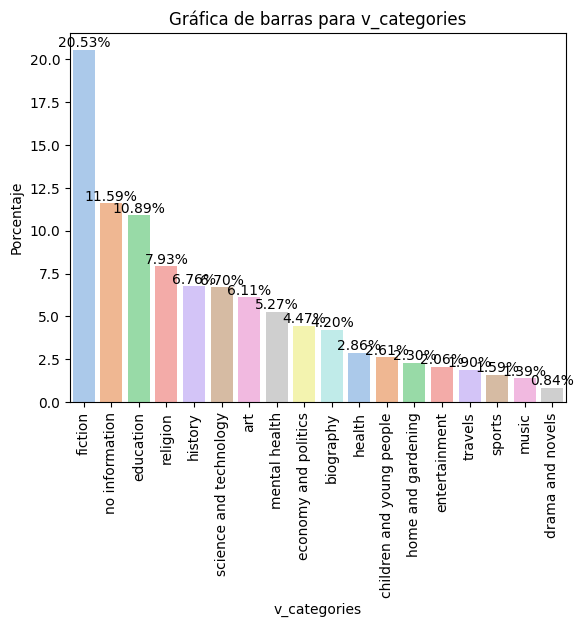

In [ ]:
prop = df4['v_categories'].value_counts(normalize=True) * 100

ax = sns.barplot(x=prop.index, y=prop.values, palette = palette)
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', fontsize=10, color='black', xytext=(0, 5), textcoords='offset points')


plt.xlabel('v_categories')
plt.ylabel('Porcentaje')
plt.title('Gráfica de barras para v_categories')
plt.xticks(rotation=90)
plt.show()

confirmamos que hay una gran cantidad de datos sin infromación, ademas vemos cuales son las categorias que más consumen las personas, revisemos algunas graficas de el top de autores y como se distribuye la categoria dentro de cada autor

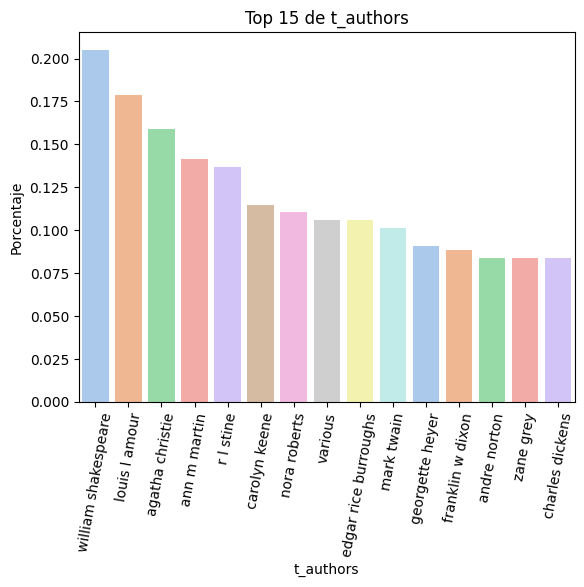

In [ ]:
top_graf_barras(df4,'t_authors')

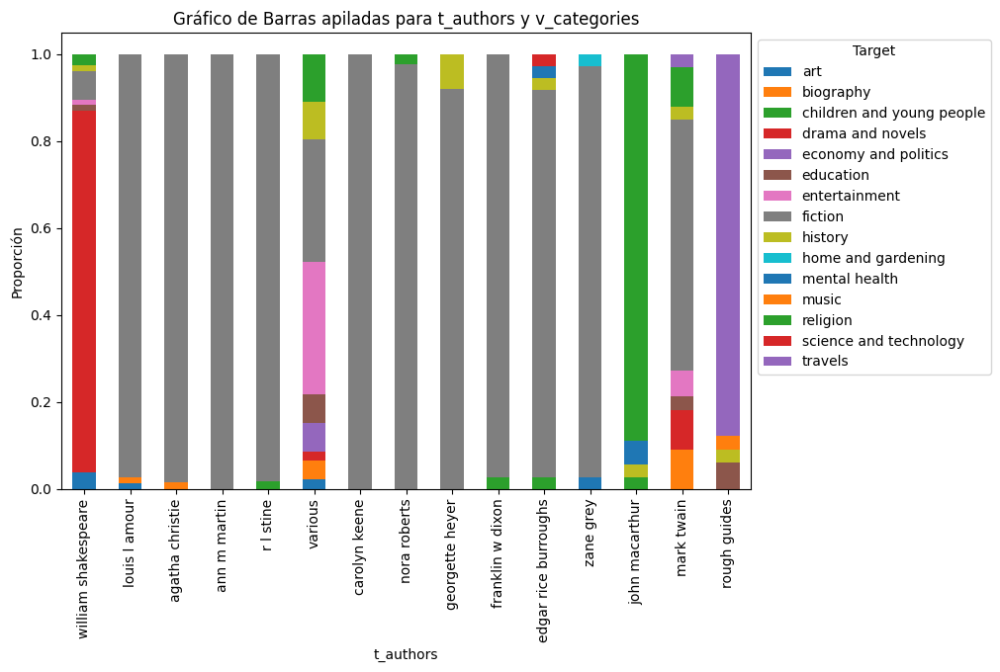

In [ ]:
top_graf_barras_apil(df4,'t_authors', 'v_categories')

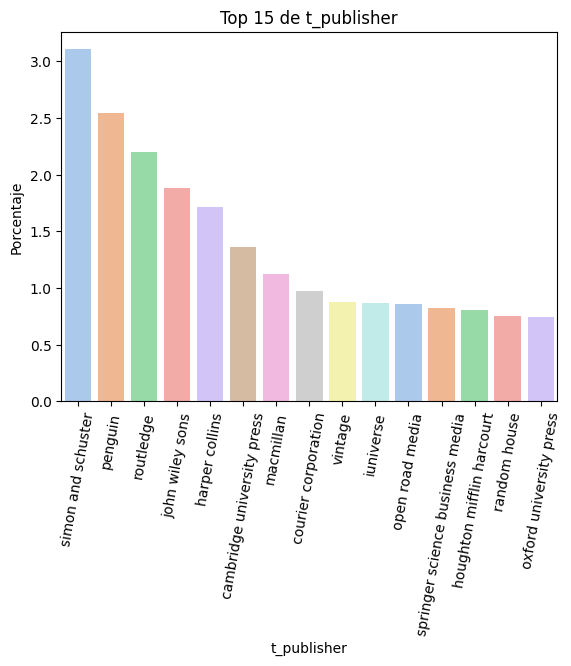

In [ ]:
top_graf_barras(df4,'t_publisher')

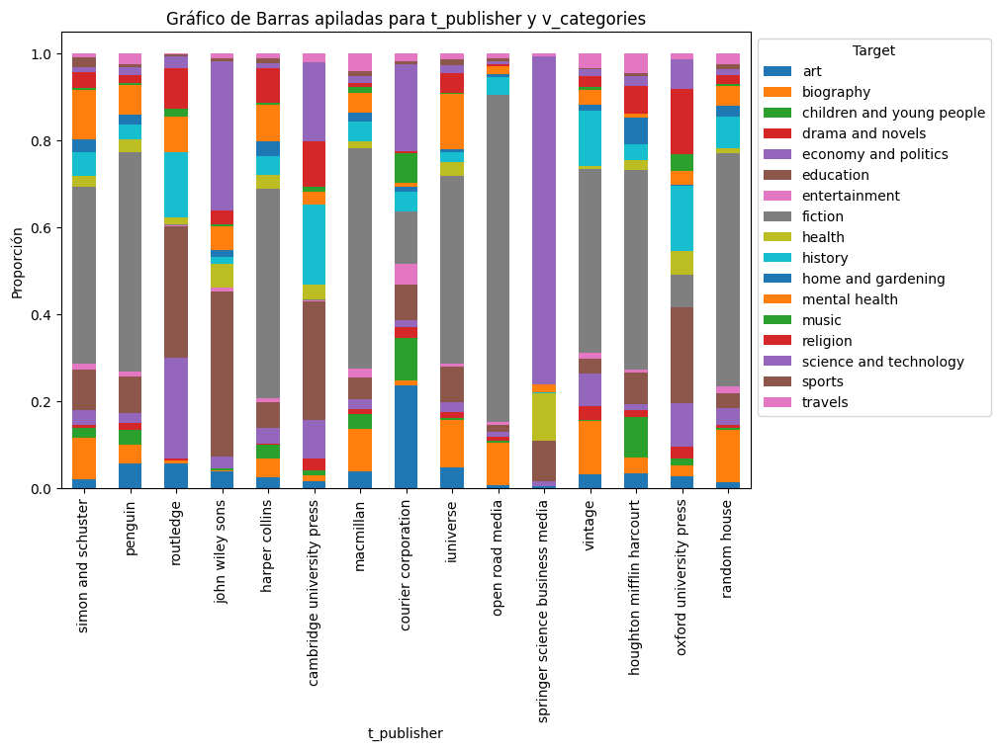

In [ ]:
top_graf_barras_apil(df4,'t_publisher', 'v_categories')

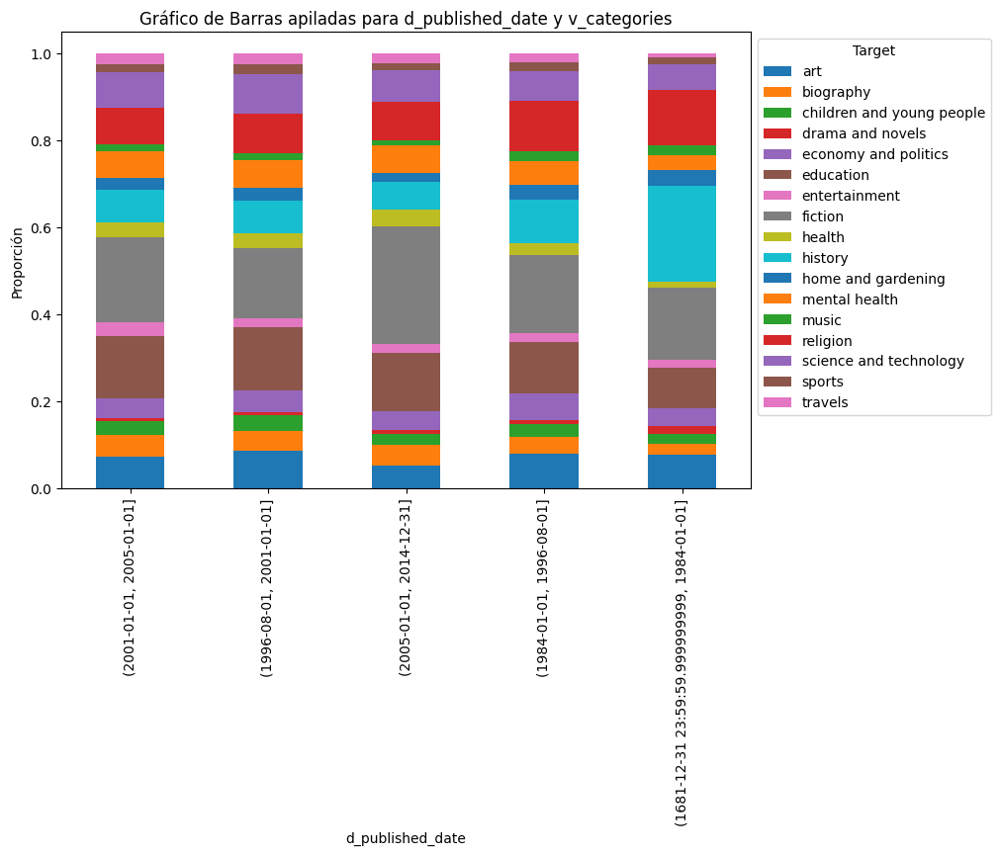

In [ ]:
top_graf_barras_apil(df4,'d_published_date', 'v_categories')

tanto en t_publisher como en t_authors si hay diferencia entre como se distribuyen las diferentes categorias, por lo menos el top 15 de t_athors y t_publisher, tambien la fecha influye un poco, por ejemplo de 1681 a 1984 sobresalen un poco más los libros de historia, de 2005 a 2014 sobresalen los libros de ficcion

veamos la bolsa de valores entre diferentes categorias, por ejemplo entre ficcion, educacion y religion, que son categorias un poco diferentes

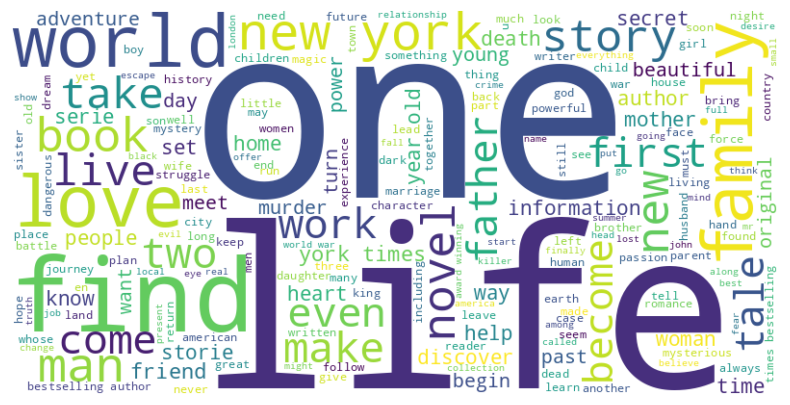

In [ ]:
text = " ".join(mensaje for mensaje in df4.loc[df4['v_categories'] == 'fiction','t_description'])
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

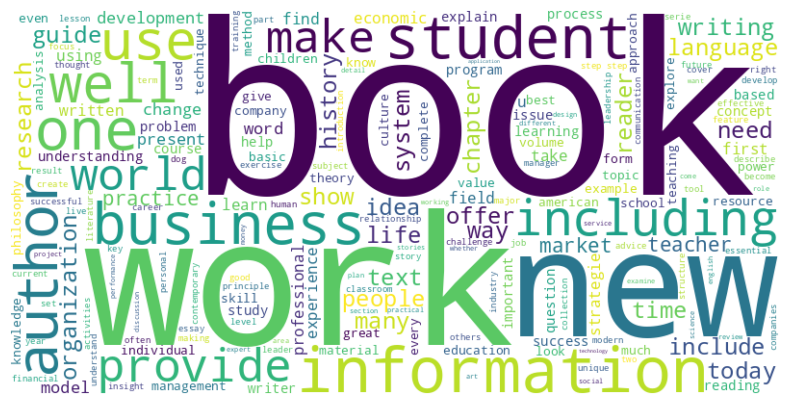

In [ ]:
text = " ".join(mensaje for mensaje in df4.loc[df4['v_categories'] == 'education','t_description'])
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

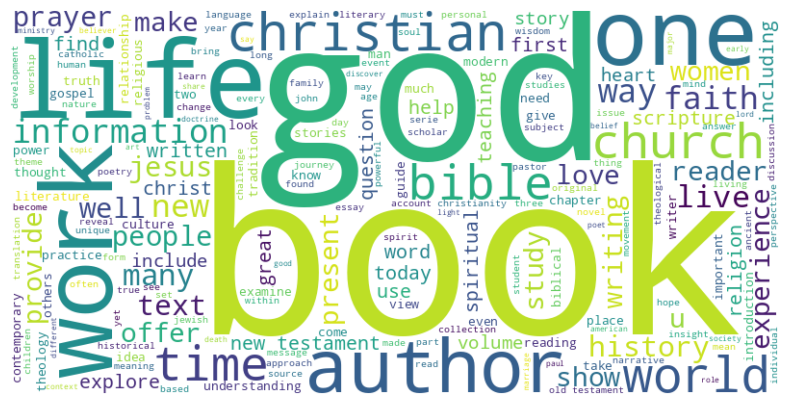

In [ ]:
text = " ".join(mensaje for mensaje in df4.loc[df4['v_categories'] == 'religion','t_description'])
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

en los 3 casos sobresalen palabras diferentes, por ejemplo para los libros de ficcion sobresalen palabras como love, life, family, para libros de educacion sobresalen libros como book, work, student, information, y para lo libros religiosos hay palabras como god, christian, bible etc.

## conjunto de datos

nuestro conjunto de datos serán los datos que tienen información de su categoria, los que no tienen este dato no los tomaremos en cuenta,  tambien coservaremos solo los datos donde venga la descripcion, si no viene los omitimos ya que sera nuestra principal informacion para hacer la prediccion

In [81]:
df = df4.drop('v_old_categories', axis = 1).set_index('t_title')
df = df.loc[(df['t_description'] != 'information') & (df['v_categories'] != 'no information')]


In [11]:
df

,t_description,t_authors,t_publisher,v_categories,t_title_clean,d_published_date
t_title,,,,,,
Dr. Seuss: American Icon,philip nel takes fascinating look key aspects ...,philip nel,a c black,biography,dr seuss american icon,"(2001-01-01, 2005-01-01]"
Wonderful Worship in Smaller Churches,resource includes twelve principles understand...,no information,no information,religion,wonderful worship in smaller churches,"(1996-08-01, 2001-01-01]"
Whispers of the Wicked Saints,julia thomas finds life spinning control death...,no information,iuniverse,fiction,whispers of the wicked saints,"(2005-01-01, 2014-12-31]"
The Church of Christ: A Biblical Ecclesiology for Today,church christ biblical ecclesiology today resp...,no information,wm b eerdmans publishing,religion,the church of christ a biblical ecclesiology f...,"(1984-01-01, 1996-08-01]"
Saint Hyacinth of Poland,story children 10 st hyacinth dominican plante...,mary fabyan windeatt,tan books pub,biography,saint hyacinth of poland,"(2005-01-01, 2014-12-31]"
...,...,...,...,...,...,...
The Magic of the Soul: Applying Spiritual Power to Daily Living,magic soul applying spiritual power daily livi...,no information,no information,mental health,the magic of the soul applying spiritual power...,"(2001-01-01, 2005-01-01]"
Autodesk Inventor 10 Essentials Plus,autodesk inventor 2017 essentials plus provide...,no information,sdc publications,science and technology,autodesk inventor 10 essentials plus,no information
The Orphan Of Ellis Island (Time Travel Adventures),school trip ellis island dominick avaro ten ye...,elvira woodruff,scholastic paperbacks,fiction,the orphan of ellis island time travel adventures,"(1996-08-01, 2001-01-01]"


## Modelo 1

vamos a hacer un primer usando solo naive bayes y usando solo la varuable t_description

In [113]:
X = df['t_description']
y = df['v_categories']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

In [114]:
X_train.shape

(78474,)

In [115]:
cv = TfidfVectorizer(ngram_range=(1, 3),
                     min_df=10,
                     max_features=100)
cv.fit(X_train)

TfidfVectorizer(max_features=100, min_df=10, ngram_range=(1, 3))

In [116]:
X_train = pd.DataFrame(data = cv.transform(X_train).todense(), columns = cv.get_feature_names_out(),index =X_train.index)
X_test = pd.DataFrame(data = cv.transform(X_test).todense(), columns = cv.get_feature_names_out(),index =X_test.index).fillna(0)

In [117]:
space = {
    'model_type': hp.choice('model_type', [
        {
            'type': 'gaussian',
            'var_smoothing': hp.loguniform('gaussian_var_smoothing', -10, -6)
        },
        {
            'type': 'multinomial',
            'alpha': hp.uniform('multinomial_alpha', 0, 2)
        },
        {
            'type': 'bernoulli',
            'alpha': hp.uniform('bernoulli_alpha', 0, 2),
            'binarize': hp.uniform('bernoulli_binarize', 0, 1)  # Uniforme entre 0 y 1
        }
    ])
}

In [ ]:
def objective(params):
    if params['model_type']['type'] == 'gaussian':
        clf = GaussianNB(var_smoothing=params['model_type']['var_smoothing'])

    elif params['model_type']['type'] == 'multinomial':
        clf = MultinomialNB(alpha=params['model_type']['alpha'])
    else:  # bernoulli
        clf = BernoulliNB(alpha=params['model_type']['alpha'], binarize=params['model_type']['binarize'])
    clf.fit(X_train, y_train)
    preds = clf.predict(X_test)
    score = accuracy_score(y_test, preds)
    return {'loss': -score, 'status': STATUS_OK}

trials = Trials()
best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=100, trials=trials)

100%|██████████| 100/100 [00:42<00:00,  2.33trial/s, best loss: -0.3883091011803883]


In [ ]:
print("Mejores parámetros:", best)

Mejores parámetros: {'bernoulli_alpha': 1.0294723681580236, 'bernoulli_binarize': 0.1770397105876216, 'model_type': 2}


In [118]:
clf = BernoulliNB(alpha = 1.0294723681580236, binarize =  0.1770397105876216)
clf.fit(X_train, y_train)
get_cv_scores_report_multiclass(clf,X_train,y_train,5)


,Metric,Mean,Std
0,Accuracy,0.385738,0.002992
1,Precision,0.264530,0.010965
2,Recall,0.211319,0.002482
3,F1-Score,0.214749,0.003079


In [119]:
get_cv_scores_report_multiclass(clf,X_test,y_test,5)

,Metric,Mean,Std
0,Accuracy,0.385360,0.005367
1,Precision,0.270825,0.012171
2,Recall,0.211621,0.003865
3,F1-Score,0.215551,0.004232


tuvimos un accuracy de alrededor de 0.38, vamos a tomar esta medida como base para intentar superarla

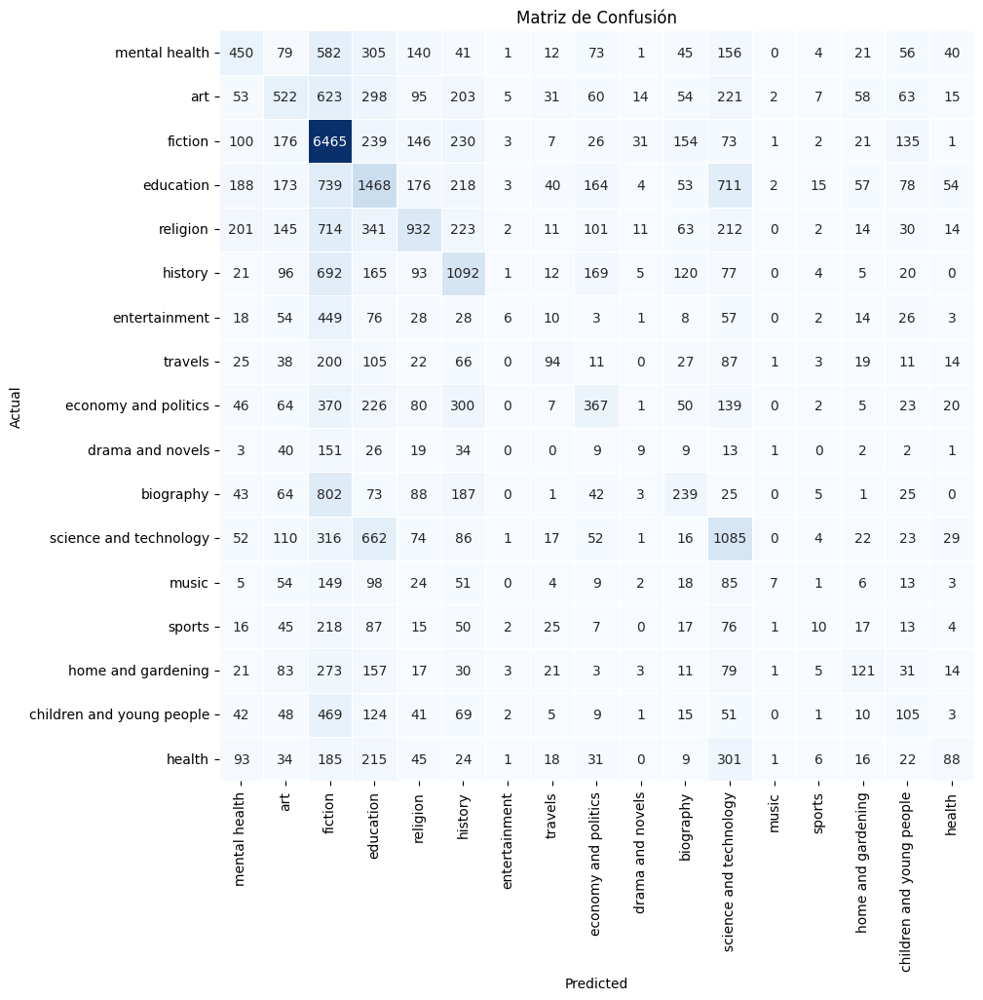

In [ ]:
matriz_confusion(clf,X_test,y_test)

## Modelo 2



vamos a intentar crear un modelo solo con t_publisher	t_authors y d_published_date, para ver si solas logran predcir alg

In [120]:
X = df[['t_publisher','t_authors','d_published_date']]
y = df['v_categories']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

para t_publisher y t_authors vamos a sustituir el autor por la modea de categorias de libros que tienen cada uno

In [121]:
X_train = X_train.merge(y, left_index = True, right_index =  True)
moda_categorias1 = X_train.groupby('t_authors')['v_categories'].apply(lambda x: x.mode().iloc[0]).reset_index()
moda_categorias2 = X_train.groupby('t_publisher')['v_categories'].apply(lambda x: x.mode().iloc[0]).reset_index()
moda_categorias1.rename(columns={'v_categories': 'authors_moda'}, inplace=True)
moda_categorias2.rename(columns={'v_categories': 'publisher_moda'}, inplace=True)
moda_categorias1.loc[moda_categorias1['t_authors'] == 'no information','authors_moda'] = 'no information'
moda_categorias2.loc[moda_categorias2['t_publisher'] == 'no information','publisher_moda'] = 'no information'
X_train = X_train.reset_index()
X_train = X_train.merge(moda_categorias1, on='t_authors', how='left')
X_train = X_train.merge(moda_categorias2, on='t_publisher', how='left')
X_train = X_train.set_index('t_title')
X_train = X_train.drop(['t_publisher','t_authors','v_categories'], axis =1)

X_test = X_test.fillna('no information')
X_test = X_test.reset_index()
X_test = X_test.merge(moda_categorias1, on='t_authors', how='left')
X_test = X_test.merge(moda_categorias2, on='t_publisher', how='left')
X_test = X_test.fillna('no information')
X_test = X_test.set_index('t_title')
X_test = X_test.fillna('no information')
X_test = X_test.drop(['t_publisher','t_authors'], axis = 1)

In [ ]:
X_train

,d_published_date,authors_moda,publisher_moda
t_title,,,
The Wilderness Paddler's Handbook,"(2005-01-01, 2014-12-31]",no information,fiction
Living Dragons Hb,"(2005-01-01, 2014-12-31]",art,fiction
A Guide for Customer Service in the Beauty Industry,"(2005-01-01, 2014-12-31]",no information,education
The Day of the Storm,no information,fiction,fiction
The Long Count,no information,no information,fiction
...,...,...,...
Official Nba Guide 1998-99,"(1996-08-01, 2001-01-01]",no information,no information
"Darklords, 2nd Edition (Advanced Dungeons & Dragons: Ravenloft)","(1984-01-01, 1996-08-01]",fiction,fiction
Snow is falling (Let's-read-and-find-out science book),"(1996-08-01, 2001-01-01]",children and young people,fiction


aplicamos one hot encoding

In [122]:

encoder = OneHotEncoder(sparse=False, drop='first')

X_train = encoder.fit_transform(X_train)

X_test = encoder.transform(X_test)

X_train = pd.DataFrame(X_train, columns=encoder.get_feature_names_out(input_features=['d_published_date','authors_moda','publisher_moda']))
X_test = pd.DataFrame(X_test, columns=encoder.get_feature_names_out(input_features=['d_published_date','authors_moda','publisher_moda']))


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [ ]:
X_train

,"d_published_date_(1984-01-01, 1996-08-01]","d_published_date_(1996-08-01, 2001-01-01]","d_published_date_(2001-01-01, 2005-01-01]","d_published_date_(2005-01-01, 2014-12-31]",d_published_date_no information,authors_moda_biography,authors_moda_children and young people,authors_moda_drama and novels,authors_moda_economy and politics,authors_moda_education,...,publisher_moda_health,publisher_moda_history,publisher_moda_home and gardening,publisher_moda_mental health,publisher_moda_music,publisher_moda_no information,publisher_moda_religion,publisher_moda_science and technology,publisher_moda_sports,publisher_moda_travels
0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78469,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
78470,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
78471,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
78472,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [ ]:
def objective(params):
    if params['model_type']['type'] == 'gaussian':
        clf = GaussianNB(var_smoothing=params['model_type']['var_smoothing'])

    elif params['model_type']['type'] == 'multinomial':
        clf = MultinomialNB(alpha=params['model_type']['alpha'])
    else:  # bernoulli
        clf = BernoulliNB(alpha=params['model_type']['alpha'], binarize=params['model_type']['binarize'])
    clf.fit(X_train, y_train)
    preds = clf.predict(X_test)
    score = accuracy_score(y_test, preds)
    return {'loss': -score, 'status': STATUS_OK}

trials = Trials()
best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=100, trials=trials)

100%|██████████| 100/100 [00:39<00:00,  2.50trial/s, best loss: -0.45045045045045046]


In [ ]:
print("Mejores parámetros:", best)

Mejores parámetros: {'bernoulli_alpha': 1.9886730832942154, 'bernoulli_binarize': 0.11078849865026252, 'model_type': 2}


In [123]:
clf2 = BernoulliNB(alpha = 0.03527638531315791, binarize = 0.04634927790753873)
clf2.fit(X_train, y_train)
get_cv_scores_report_multiclass(clf2,X_train,y_train,5)

,Metric,Mean,Std
0,Accuracy,0.535074,0.002910
1,Precision,0.652156,0.005873
2,Recall,0.439422,0.005980
3,F1-Score,0.501286,0.005876


In [124]:
get_cv_scores_report_multiclass(clf2,X_test,y_test,5)

,Metric,Mean,Std
0,Accuracy,0.442173,0.004950
1,Precision,0.512278,0.009886
2,Recall,0.317319,0.005458
3,F1-Score,0.362730,0.006128


con solo esta variable obtuvimos un Accuracy de 0.44 lo cual mejor nuestro modelo anterior

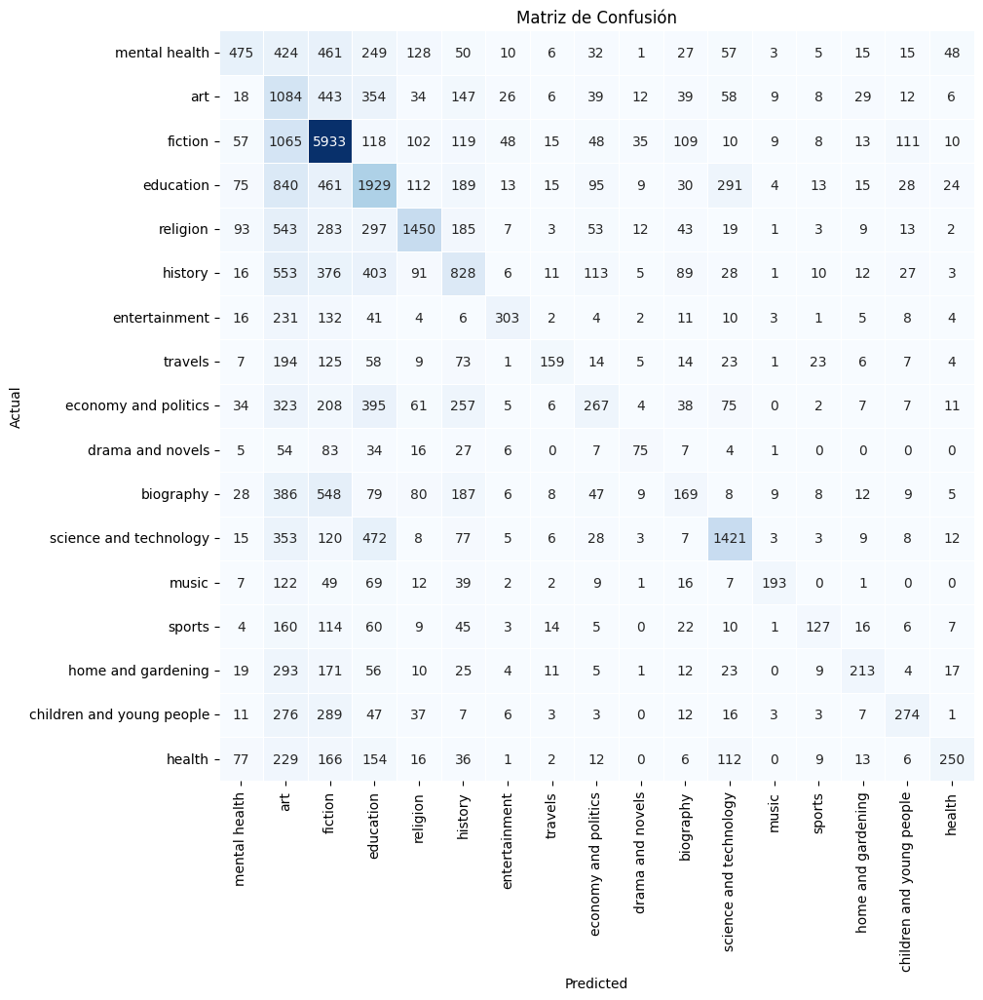

In [ ]:
matriz_confusion(clf2,X_test,y_test)

## Model 3

Veamos si el titulo por si solo nos ayuda a predecir la categoria

In [125]:
X = df['t_title_clean']
y = df['v_categories']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

In [126]:
cv = TfidfVectorizer(ngram_range=(1, 3),
                     min_df=10,
                     max_features=200)
cv.fit(X_train)

TfidfVectorizer(max_features=200, min_df=10, ngram_range=(1, 3))

In [127]:
X_train = pd.DataFrame(data = cv.transform(X_train).todense(), columns = cv.get_feature_names_out(),index =X_train.index)
X_test = pd.DataFrame(data = cv.transform(X_test).todense(), columns = cv.get_feature_names_out(),index =X_test.index).fillna(0)

In [ ]:
def objective(params):
    if params['model_type']['type'] == 'gaussian':
        clf = GaussianNB(var_smoothing=params['model_type']['var_smoothing'])

    elif params['model_type']['type'] == 'multinomial':
        clf = MultinomialNB(alpha=params['model_type']['alpha'])
    else:  # bernoulli
        clf = BernoulliNB(alpha=params['model_type']['alpha'], binarize=params['model_type']['binarize'])
    clf.fit(X_train, y_train)
    preds = clf.predict(X_test)
    score = accuracy_score(y_test, preds)
    return {'loss': -score, 'status': STATUS_OK}

trials = Trials()
best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=100, trials=trials)
print("Mejores parámetros:", best)

100%|██████████| 100/100 [00:52<00:00,  1.90trial/s, best loss: -0.37115333154937113]
Mejores parámetros: {'bernoulli_alpha': 0.7607364110014678, 'bernoulli_binarize': 0.19385043856097783, 'model_type': 2}


In [128]:
clf3 = BernoulliNB(alpha = 0.7607364110014678, binarize =  0.19385043856097783)
clf3.fit(X_train, y_train)
get_cv_scores_report_multiclass(clf3,X_train,y_train,5)

,Metric,Mean,Std
0,Accuracy,0.368384,0.003029
1,Precision,0.334051,0.005322
2,Recall,0.218941,0.003029
3,F1-Score,0.239908,0.003610


In [129]:
get_cv_scores_report_multiclass(clf3,X_test,y_test,5)

,Metric,Mean,Std
0,Accuracy,0.368460,0.005183
1,Precision,0.332047,0.013437
2,Recall,0.216004,0.004986
3,F1-Score,0.235424,0.006414


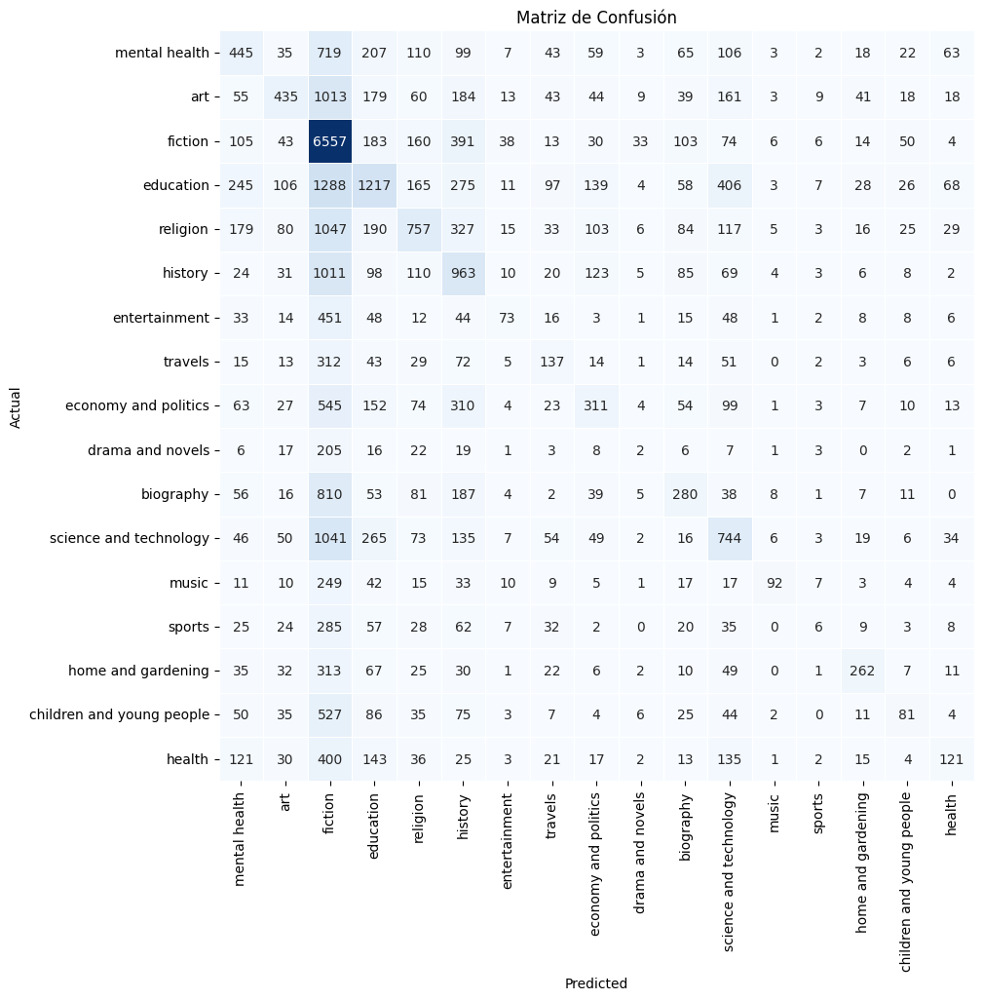

In [ ]:
matriz_confusion(clf3,X_test,y_test)

es un poco peor que los anteriores pero hay que considerar que incluso para un humano es dificil clasificar solo a partir del tituo

## Model 4

ahora vamos a usar todas las variables y usar un random forest

In [130]:
X = df.drop('v_categories', axis = 1)
y = df['v_categories']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [131]:
X_train = X_train.merge(y, left_index = True, right_index =  True)
moda_categorias1 = X_train.groupby('t_authors')['v_categories'].apply(lambda x: x.mode().iloc[0]).reset_index()
moda_categorias2 = X_train.groupby('t_publisher')['v_categories'].apply(lambda x: x.mode().iloc[0]).reset_index()
moda_categorias1.rename(columns={'v_categories': 'authors_moda'}, inplace=True)
moda_categorias2.rename(columns={'v_categories': 'publisher_moda'}, inplace=True)
moda_categorias1.loc[moda_categorias1['t_authors'] == 'no information','authors_moda'] = 'no information'
moda_categorias2.loc[moda_categorias2['t_publisher'] == 'no information','publisher_moda'] = 'no information'
X_train = X_train.reset_index()
X_train = X_train.merge(moda_categorias1, on='t_authors', how='left')
X_train = X_train.merge(moda_categorias2, on='t_publisher', how='left')
X_train = X_train.set_index('t_title')
X_train = X_train.drop(['t_publisher','t_authors','v_categories'], axis =1)

X_test = X_test.fillna('no information')
X_test = X_test.reset_index()
X_test = X_test.merge(moda_categorias1, on='t_authors', how='left')
X_test = X_test.merge(moda_categorias2, on='t_publisher', how='left')
X_test = X_test.fillna('no information')
X_test = X_test.set_index('t_title')
X_test = X_test.fillna('no information')
X_test = X_test.drop(['t_publisher','t_authors'], axis = 1)

In [132]:
cv = TfidfVectorizer(ngram_range=(1, 3),
                     min_df=10,
                     max_features=200)
cv.fit(X_train['t_description'])

TfidfVectorizer(max_features=200, min_df=10, ngram_range=(1, 3))

In [133]:
X_train_tfidf = pd.DataFrame(data = cv.transform(X_train['t_description']).todense(), columns = cv.get_feature_names_out(),index =X_train.index)
X_test_tfidf= pd.DataFrame(data = cv.transform(X_test['t_description']).todense(), columns = cv.get_feature_names_out(),index =X_test.index).fillna(0)

In [134]:
cv2 = TfidfVectorizer(ngram_range=(1, 3),
                     min_df=10,
                     max_features=100)
cv2.fit(X_train['t_title_clean'])
X_train_tfidf2 = pd.DataFrame(data = cv2.transform(X_train['t_title_clean']).todense(), columns = cv2.get_feature_names_out(),index =X_train.index)
X_test_tfidf2= pd.DataFrame(data = cv2.transform(X_test['t_title_clean']).todense(), columns = cv2.get_feature_names_out(),index =X_test.index).fillna(0)

In [135]:

encoder = OneHotEncoder(sparse=False, drop='first')

X_train_oh = encoder.fit_transform(X_train[['d_published_date','authors_moda','publisher_moda']])
X_test_oh = encoder.transform(X_test[['d_published_date','authors_moda','publisher_moda']])

X_train_oh = pd.DataFrame(X_train_oh, columns=encoder.get_feature_names_out(input_features=['d_published_date','authors_moda','publisher_moda']),index =X_train.index)
X_test_oh = pd.DataFrame(X_test_oh, columns=encoder.get_feature_names_out(input_features=['d_published_date','authors_moda','publisher_moda']),index =X_test.index )


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [136]:
X_train  = X_train_oh.merge(X_train_tfidf, right_index = True, left_index =True)
X_test = X_test_oh.merge(X_test_tfidf, right_index = True, left_index =True)
X_train  = X_train.merge(X_train_tfidf2, right_index = True, left_index =True)
X_test = X_test.merge(X_test_tfidf2, right_index = True, left_index =True)

In [ ]:
space = {
    'n_estimators': hp.choice('n_estimators', np.arange(50, 501, 50, dtype=int)),
    'max_depth': hp.choice('max_depth', np.arange(5, 30, 1, dtype=int)),
    'min_samples_split': hp.uniform('min_samples_split', 0.01, 0.5),
    'min_samples_leaf': hp.uniform('min_samples_leaf', 0.01, 0.5),
    'max_features': hp.choice('max_features', ['sqrt', 'log2'])
}

def objective(params):
    model = RandomForestClassifier(**params)
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    score = accuracy_score(y_test, preds )
    return {'loss': -score, 'status': STATUS_OK}

trials = Trials()
best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=100, trials=trials)
best_params = space_eval(space, best)

print("Mejores parámetros:", best_params)

100%|██████████| 100/100 [13:10<00:00,  7.91s/trial, best loss: -0.41474147414741475]
Mejores parámetros: {'max_depth': 26, 'max_features': 'sqrt', 'min_samples_leaf': 0.012199238402872157, 'min_samples_split': 0.04702093862738248, 'n_estimators': 250}


In [137]:
rdf = RandomForestClassifier(max_depth = 26, max_features= 'sqrt', min_samples_leaf =  0.012199238402872157, min_samples_split = 0.04702093862738248, n_estimators = 250)
rdf.fit(X_train, y_train)
get_cv_scores_report_multiclass(rdf,X_train,y_train,5)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning

,Metric,Mean,Std
0,Accuracy,0.425433,0.002093
1,Precision,0.186989,0.005843
2,Recall,0.181174,0.001283
3,F1-Score,0.154154,0.001405


In [138]:
get_cv_scores_report_multiclass(rdf,X_test,y_test,5)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning

,Metric,Mean,Std
0,Accuracy,0.408679,0.005007
1,Precision,0.185402,0.010858
2,Recall,0.171684,0.003087
3,F1-Score,0.147472,0.003047


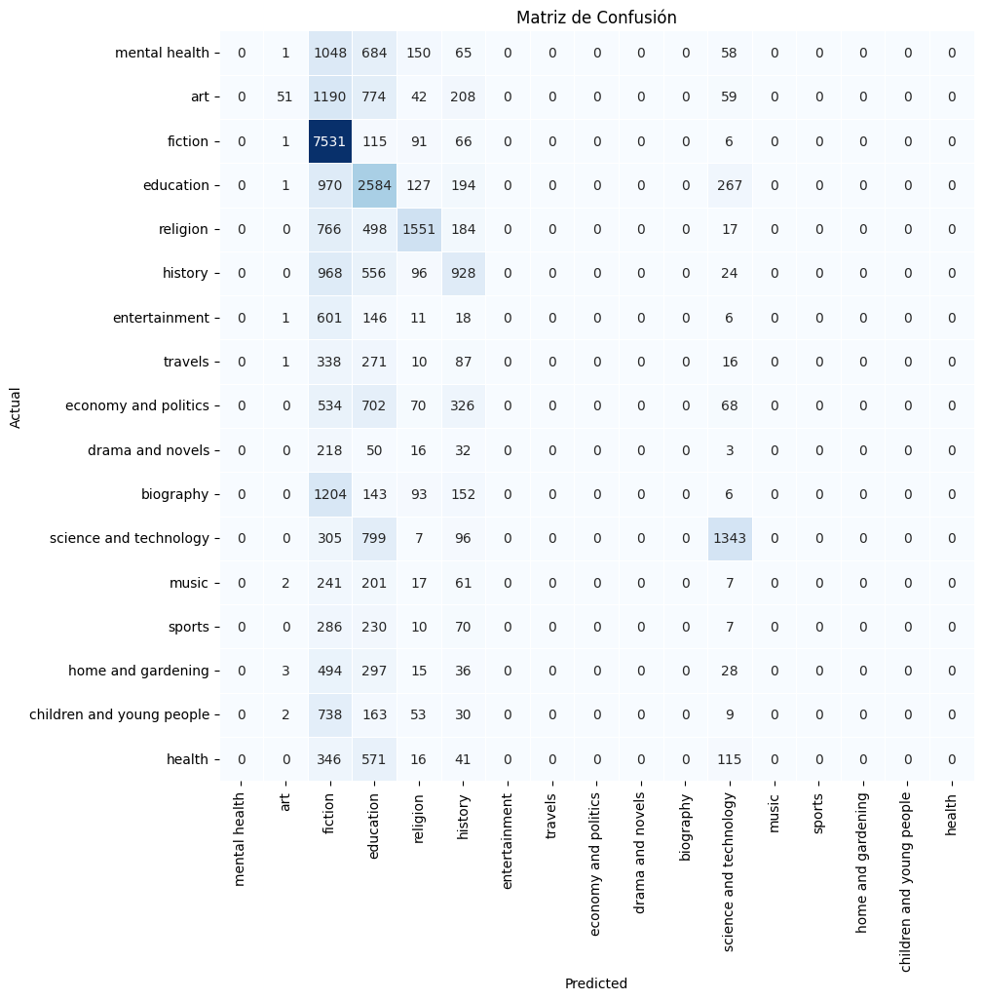

In [ ]:
matriz_confusion(rdf,X_test,y_test)

## Modelo 5

In [ ]:
space = {
    'n_estimators': hp.choice('n_estimators', np.arange(50, 501, 50, dtype=int)),
    'max_depth': hp.choice('max_depth', np.arange(5, 31, 1, dtype=int)),
    'min_samples_split': hp.uniform('min_samples_split', 0.01, 1.0),
    'min_samples_leaf': hp.uniform('min_samples_leaf', 0.01, 0.5),
    'max_features': hp.choice('max_features', ['sqrt', 'log2']),
    'learning_rate': hp.loguniform('learning_rate', np.log(0.01), np.log(0.2))
}

def objective(params):
    model = GradientBoostingClassifier(**params)
    model.fit(X_train, y_train)
    preds = model.predict(X_test)  # Usamos datos de validación en lugar de entrenamiento para la evaluación
    score = accuracy_score(y_test, preds)
    return {'loss': -score, 'status': STATUS_OK}

trials = Trials()
best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=10, trials=trials)
best_params = space_eval(space, best)

print("Mejores parámetros:", best_params)

100%|██████████| 10/10 [20:35<00:00, 123.52s/trial, best loss: -0.3202212113103202]
Mejores parámetros: {'learning_rate': 0.14653120428735267, 'max_depth': 30, 'max_features': 'log2', 'min_samples_leaf': 0.11847509466969032, 'min_samples_split': 0.9212965580827703, 'n_estimators': 150}


In [139]:

gbm = GradientBoostingClassifier(learning_rate = 0.14653120428735267, max_depth = 30, max_features = 'log2',
                                 min_samples_leaf = 0.11847509466969032, min_samples_split =  0.9212965580827703,
                                 n_estimators = 150)
gbm.fit(X_train, y_train)
get_cv_scores_report_multiclass(gbm,X_train,y_train,5)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning

,Metric,Mean,Std
0,Accuracy,0.320212,0.006857
1,Precision,0.101032,0.020614
2,Recall,0.111555,0.005699
3,F1-Score,0.078701,0.007517


In [140]:
get_cv_scores_report_multiclass(gbm,X_test,y_test,5)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning

,Metric,Mean,Std
0,Accuracy,0.313799,0.007468
1,Precision,0.092752,0.017800
2,Recall,0.107987,0.005844
3,F1-Score,0.077507,0.006160


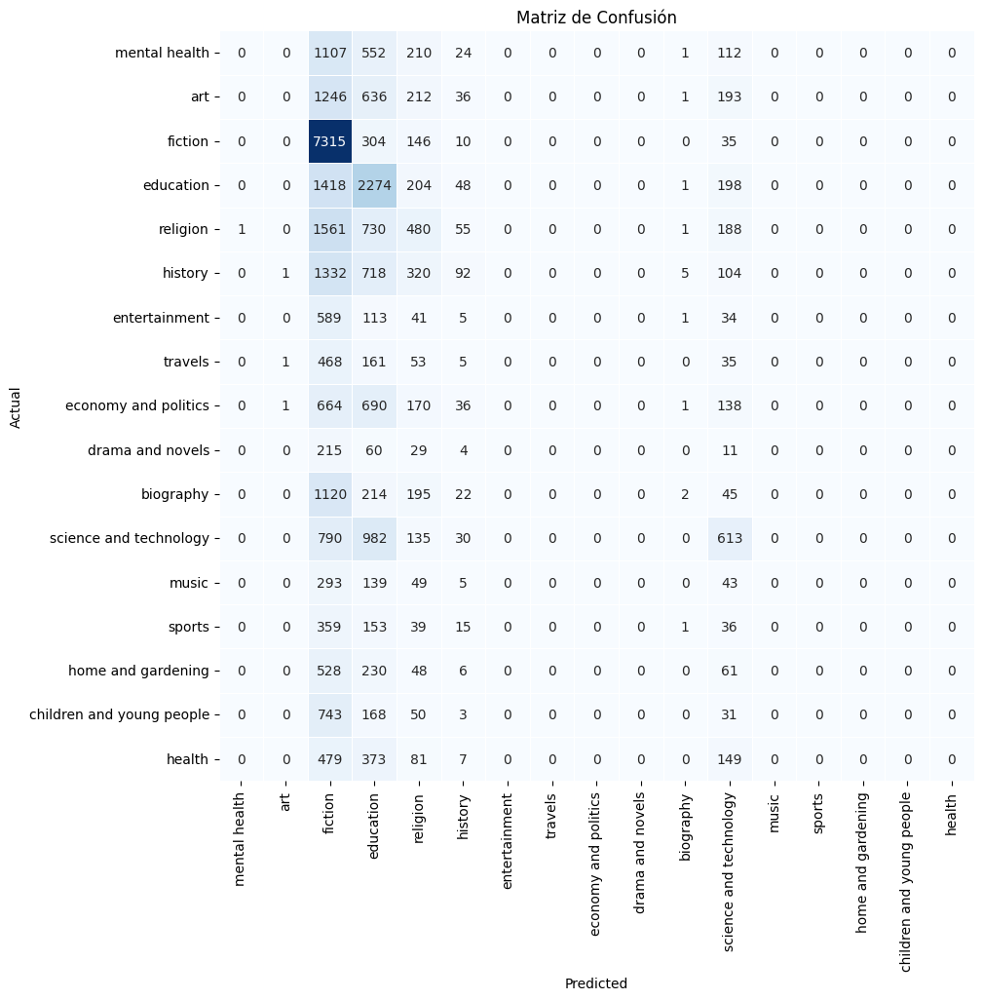

In [ ]:
matriz_confusion(gbm,X_test,y_test)

## Modelo 6

Vamos a calcular la informacion muta y a conservar solo variables (de nuestra codificacion tfidf) que más importancia tengan


In [82]:
X = df.drop('v_categories', axis = 1)
y = df['v_categories']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [83]:
X_train = X_train.merge(y, left_index = True, right_index =  True)
moda_categorias1 = X_train.groupby('t_authors')['v_categories'].apply(lambda x: x.mode().iloc[0]).reset_index()
moda_categorias2 = X_train.groupby('t_publisher')['v_categories'].apply(lambda x: x.mode().iloc[0]).reset_index()
moda_categorias1.rename(columns={'v_categories': 'authors_moda'}, inplace=True)
moda_categorias2.rename(columns={'v_categories': 'publisher_moda'}, inplace=True)
moda_categorias1.loc[moda_categorias1['t_authors'] == 'no information','authors_moda'] = 'no information'
moda_categorias2.loc[moda_categorias2['t_publisher'] == 'no information','publisher_moda'] = 'no information'
X_train = X_train.reset_index()
X_train = X_train.merge(moda_categorias1, on='t_authors', how='left')
X_train = X_train.merge(moda_categorias2, on='t_publisher', how='left')
X_train = X_train.set_index('t_title')
X_train = X_train.drop(['t_publisher','t_authors','v_categories'], axis =1)

X_test = X_test.fillna('no information')
X_test = X_test.reset_index()
X_test = X_test.merge(moda_categorias1, on='t_authors', how='left')
X_test = X_test.merge(moda_categorias2, on='t_publisher', how='left')
X_test = X_test.fillna('no information')
X_test = X_test.set_index('t_title')
X_test = X_test.fillna('no information')
X_test = X_test.drop(['t_publisher','t_authors'], axis = 1)

In [84]:
cv = TfidfVectorizer(ngram_range=(1, 3),
                     min_df=10,
                     max_features=200)
cv.fit(X_train['t_description'])

TfidfVectorizer(max_features=200, min_df=10, ngram_range=(1, 3))

In [85]:
X_train_tfidf = pd.DataFrame(data = cv.transform(X_train['t_description']).todense(), columns = cv.get_feature_names_out(),index =X_train.index)
X_test_tfidf= pd.DataFrame(data = cv.transform(X_test['t_description']).todense(), columns = cv.get_feature_names_out(),index =X_test.index).fillna(0)

In [86]:
cv2 = TfidfVectorizer(ngram_range=(1, 3),
                     min_df=10,
                     max_features=100)
cv2.fit(X_train['t_title_clean'])
X_train_tfidf2 = pd.DataFrame(data = cv2.transform(X_train['t_title_clean']).todense(), columns = cv2.get_feature_names_out(),index =X_train.index)
X_test_tfidf2= pd.DataFrame(data = cv2.transform(X_test['t_title_clean']).todense(), columns = cv2.get_feature_names_out(),index =X_test.index).fillna(0)

In [87]:
mi1 = mutual_info_classif(X_train_tfidf, y_train)

In [88]:
sorted_features1 = [feature for _, feature in sorted(zip(mi1, X_train_tfidf.columns), reverse=True)]
umbral = 0.01
caracteristicas_seleccionadas1= [feature for feature in sorted_features1 if mi1[X_train_tfidf.columns.get_loc(feature)] > umbral]

In [89]:
mi = mutual_info_classif(X_train_tfidf2, y_train)

In [90]:
sorted_features = [feature for _, feature in sorted(zip(mi, X_train_tfidf2.columns), reverse=True)]
umbral = 0.01
caracteristicas_seleccionadas2= [feature for feature in sorted_features if mi[X_train_tfidf2.columns.get_loc(feature)] > umbral]

In [91]:
encoder = OneHotEncoder(sparse=False, drop='first')

X_train_oh = encoder.fit_transform(X_train[['d_published_date','authors_moda','publisher_moda']])
X_test_oh = encoder.transform(X_test[['d_published_date','authors_moda','publisher_moda']])

X_train_oh = pd.DataFrame(X_train_oh, columns=encoder.get_feature_names_out(input_features=['d_published_date','authors_moda','publisher_moda']),index =X_train.index)
X_test_oh = pd.DataFrame(X_test_oh, columns=encoder.get_feature_names_out(input_features=['d_published_date','authors_moda','publisher_moda']),index =X_test.index )


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [92]:
X_train  = X_train_oh.merge(X_train_tfidf[caracteristicas_seleccionadas1].add_prefix('description_'), right_index = True, left_index =True)
X_test = X_test_oh.merge(X_test_tfidf[caracteristicas_seleccionadas1].add_prefix('description_'), right_index = True, left_index =True)
X_train  = X_train.merge(X_train_tfidf2[caracteristicas_seleccionadas2].add_prefix('title_'), right_index = True, left_index =True)
X_test = X_test.merge(X_test_tfidf2[caracteristicas_seleccionadas2].add_prefix('title_'), right_index = True, left_index =True)

In [ ]:
space = {
    'n_estimators': hp.choice('n_estimators', [10,50,100,150,200, 250, 300,350, 400]),
    'learning_rate': hp.uniform('learning_rate', 0.01, 2.0),
    'algorithm': hp.choice('algorithm', ['SAMME', 'SAMME.R'])
}

def objective(params):
    model = AdaBoostClassifier(**params)
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    score = accuracy_score(y_test, preds)
    return {'loss': -score, 'status': STATUS_OK}

trials = Trials()
best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=100, trials=trials)

best_params = space_eval(space, best)
print("Mejores parámetros:", best_params)

100%|██████████| 100/100 [3:50:37<00:00, 138.38s/trial, best loss: -0.5345196681830345]
Mejores parámetros: {'algorithm': 'SAMME.R', 'learning_rate': 0.5238289272560606, 'n_estimators': 350}


In [93]:

adb = AdaBoostClassifier(algorithm = 'SAMME.R',learning_rate =  0.5238289272560606, n_estimators = 350)
adb.fit(X_train, y_train)
get_cv_scores_report_multiclass(adb,X_train,y_train,5)

,Metric,Mean,Std
0,Accuracy,0.590893,0.003636
1,Precision,0.611327,0.006998
2,Recall,0.452497,0.006096
3,F1-Score,0.498641,0.006555


In [94]:
get_cv_scores_report_multiclass(adb,X_test,y_test,5)

,Metric,Mean,Std
0,Accuracy,0.484292,0.007229
1,Precision,0.408673,0.015462
2,Recall,0.317151,0.010292
3,F1-Score,0.338284,0.011521


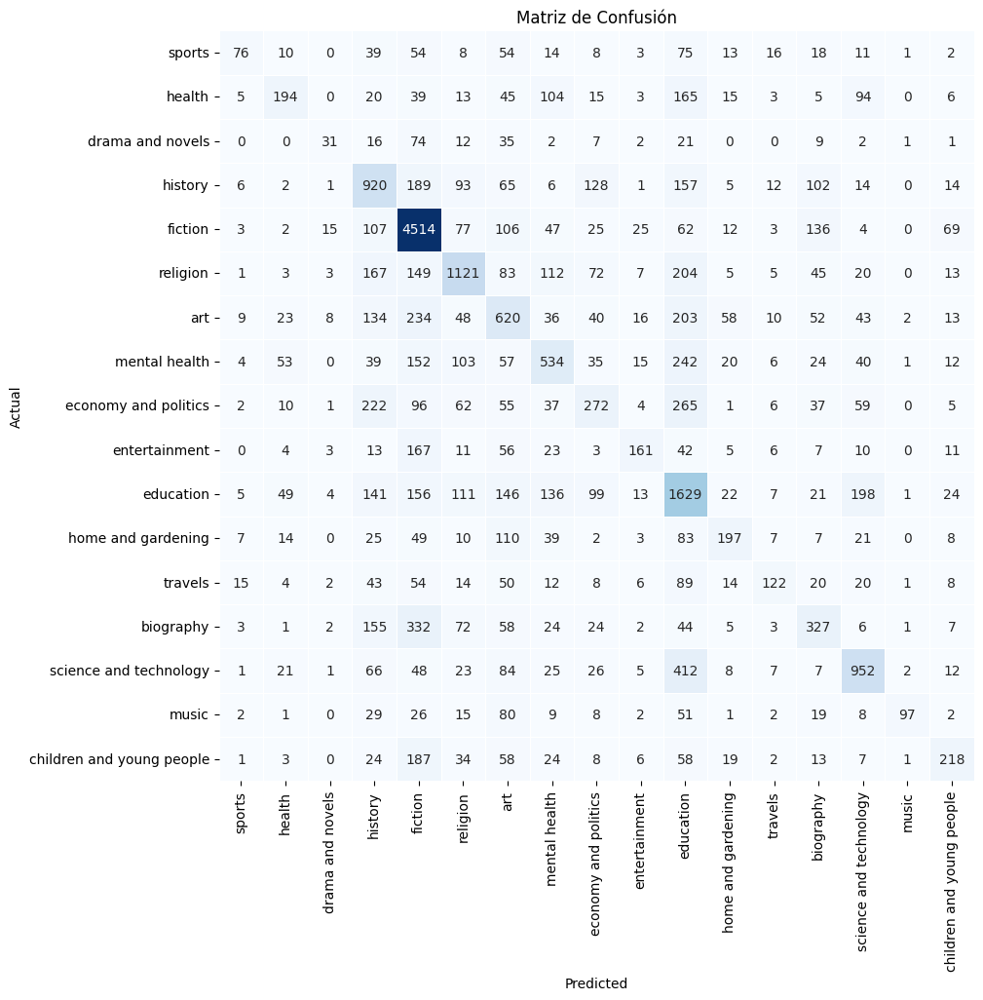

In [ ]:
matriz_confusion(adb,X_test,y_test)

## Modelo 7

Ahora vamos a crear una red neuronal, tendremos 3 tipos de entradas, el titulo del libro, la descripcion del libro y el autor, fecha y editorial del libroscomo nuestra 3 dntrada

In [15]:

X = df.drop('v_categories', axis = 1)
y = df['v_categories']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, stratify=y, random_state=42)

label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit(y_train)
y_train_encoded = label_encoder.transform(y_train)
y_test_encoded = label_encoder.transform(y_test)


X_train = X_train.merge(y, left_index = True, right_index =  True)
moda_categorias1 = X_train.groupby('t_authors')['v_categories'].apply(lambda x: x.mode().iloc[0]).reset_index()
moda_categorias2 = X_train.groupby('t_publisher')['v_categories'].apply(lambda x: x.mode().iloc[0]).reset_index()
moda_categorias1.rename(columns={'v_categories': 'authors_moda'}, inplace=True)
moda_categorias2.rename(columns={'v_categories': 'publisher_moda'}, inplace=True)
moda_categorias1.loc[moda_categorias1['t_authors'] == 'no information','authors_moda'] = 'no information'
moda_categorias2.loc[moda_categorias2['t_publisher'] == 'no information','publisher_moda'] = 'no information'
X_train = X_train.reset_index()
X_train = X_train.merge(moda_categorias1, on='t_authors', how='left')
X_train = X_train.merge(moda_categorias2, on='t_publisher', how='left')
X_train = X_train.set_index('t_title')
X_train = X_train.drop(['t_publisher','t_authors','v_categories'], axis =1)

X_test = X_test.fillna('no information')
X_test = X_test.reset_index()
X_test = X_test.merge(moda_categorias1, on='t_authors', how='left')
X_test = X_test.merge(moda_categorias2, on='t_publisher', how='left')
X_test = X_test.fillna('no information')
X_test = X_test.set_index('t_title')
X_test = X_test.fillna('no information')
X_test = X_test.drop(['t_publisher','t_authors'], axis = 1)


encoder = OneHotEncoder(sparse=False, drop='first')

X_train_oh = encoder.fit_transform(X_train[['d_published_date','authors_moda','publisher_moda']])
X_test_oh = encoder.transform(X_test[['d_published_date','authors_moda','publisher_moda']])
X_train_categorical = pd.DataFrame(X_train_oh, columns=encoder.get_feature_names_out(input_features=['d_published_date','authors_moda','publisher_moda']),index =X_train.index)
X_test_categorical = pd.DataFrame(X_test_oh, columns=encoder.get_feature_names_out(input_features=['d_published_date','authors_moda','publisher_moda']),index =X_test.index )

X_train_description = X_train['t_description']
X_train_title = X_train['t_title_clean']
X_test_description = X_test['t_description']
X_test_title = X_test['t_title_clean']


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [16]:

vocab_size = 50000

embedding_dim = 300
num_classes = 17
max_words = vocab_size


tokenizer1 = Tokenizer(num_words=max_words, oov_token="<OOV>")
tokenizer1.fit_on_texts(X_train_description)
tokenizer2 = Tokenizer(num_words=max_words, oov_token="<OOV>")
tokenizer2.fit_on_texts(X_train_title)


X_train_seq_des = tokenizer1.texts_to_sequences(X_train_description)
X_test_seq_des = tokenizer1.texts_to_sequences(X_test_description)
X_train_seq_tit = tokenizer2.texts_to_sequences(X_train_title)
X_test_seq_tit = tokenizer2.texts_to_sequences(X_test_title)

max_sequence_length1 = 300
X_train_padded_des = pad_sequences(X_train_seq_des, maxlen=max_sequence_length1, padding = 'post', truncating = 'post')
X_test_padded_des = pad_sequences(X_test_seq_des, maxlen=max_sequence_length1, padding = 'post', truncating = 'post')
max_sequence_length2 = 30
X_train_padded_tit = pad_sequences(X_train_seq_tit, maxlen=max_sequence_length2, padding = 'post', truncating = 'post')
X_test_padded_tit = pad_sequences(X_test_seq_tit, maxlen=max_sequence_length2, padding = 'post', truncating = 'post')



input_description = keras.layers.Input(shape=(max_sequence_length1,))
input_title = keras.layers.Input(shape=(max_sequence_length2,))
input_categorical = keras.layers.Input(shape=(X_train_categorical.shape[1],))

embedding_description = keras.layers.Embedding(input_dim=vocab_size, output_dim=embedding_dim)(input_description)
embedding_title = keras.layers.Embedding(input_dim=vocab_size, output_dim=embedding_dim)(input_title)

flatten_description = keras.layers.Flatten()(embedding_description)
flatten_title = keras.layers.Flatten()(embedding_title)

combined = keras.layers.concatenate([flatten_description, flatten_title, input_categorical])

hidden = keras.layers.Dense(64, activation='relu')(combined)
dropout = keras.layers.Dropout(0.5)(hidden)
output = keras.layers.Dense(num_classes, activation='softmax')(dropout)
custom_learning_rate = 0.00003

optimizer = tf.keras.optimizers.Adam(learning_rate=custom_learning_rate)

model = keras.models.Model(inputs=[input_description, input_title, input_categorical], outputs=output)

model.compile(optimizer= optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 300)]                0         []                            
                                                                                                  
 input_2 (InputLayer)        [(None, 30)]                 0         []                            
                                                                                                  
 embedding (Embedding)       (None, 300, 300)             1500000   ['input_1[0][0]']             
                                                          0                                       
                                                                                                  
 embedding_1 (Embedding)     (None, 30, 300)              1500000   ['input_2[0][0]']         

In [ ]:

model.fit(
    [X_train_padded_des, X_train_padded_tit, X_train_categorical],
    y_train_encoded,
    epochs=20,
    batch_size=32,
    validation_data=([X_test_padded_des, X_test_padded_tit, X_test_categorical], y_test_encoded)
)

Epoch 1/20
2978/2978 [==============================] - 115s 38ms/step - loss: 2.4356 - accuracy: 0.2800 - val_loss: 2.1550 - val_accuracy: 0.3665
Epoch 2/20
2978/2978 [==============================] - 45s 15ms/step - loss: 2.0269 - accuracy: 0.4044 - val_loss: 1.8331 - val_accuracy: 0.4700
Epoch 3/20
2978/2978 [==============================] - 39s 13ms/step - loss: 1.6979 - accuracy: 0.5143 - val_loss: 1.5697 - val_accuracy: 0.5549
Epoch 4/20
2978/2978 [==============================] - 38s 13ms/step - loss: 1.4195 - accuracy: 0.6019 - val_loss: 1.3878 - val_accuracy: 0.6108
Epoch 5/20
2978/2978 [==============================] - 37s 12ms/step - loss: 1.2175 - accuracy: 0.6624 - val_loss: 1.2704 - val_accuracy: 0.6411
Epoch 6/20
2978/2978 [==============================] - 38s 13ms/step - loss: 1.0575 - accuracy: 0.7092 - val_loss: 1.1941 - val_accuracy: 0.6576
Epoch 7/20
2978/2978 [==============================] - 37s 12ms/step - loss: 0.9260 - accuracy: 0.7491 - val_loss: 1.1451 

In [ ]:
model.evaluate([X_test_padded_des, X_test_padded_tit, X_test_categorical], y_test_encoded)

526/526 [==============================] - 1s 3ms/step - loss: 1.2654 - accuracy: 0.6995


[1.2654153108596802, 0.6995302438735962]

In [77]:

get_cv_scores_report_multiclass_tf(model,[X_train_padded_des, X_train_padded_tit, X_train_categorical],y_train_encoded)

2978/2978 [==============================] - 29s 10ms/step


,Metric,Value
0,Accuracy,0.993378
1,Precision,0.992705
2,Recall,0.986190
3,F1-Score,0.989378


In [75]:


get_cv_scores_report_multiclass_tf(model,[X_test_padded_des, X_test_padded_tit, X_test_categorical],y_test_encoded)

526/526 [==============================] - 5s 9ms/step


,Metric,Value
0,Accuracy,0.699530
1,Precision,0.676590
2,Recall,0.592201
3,F1-Score,0.620761


In [ ]:
with open(ruta  + 'tokm1t1.pkl', 'wb') as archivo:
    pickle.dump(tokenizer1, archivo)
with open(ruta  + 'tokm1t2.pkl', 'wb') as archivo:
    pickle.dump(tokenizer2, archivo)
with open(ruta  + 'labelm1.pkl', 'wb') as archivo:
    pickle.dump(label_encoder, archivo)

526/526 [==============================] - 4s 9ms/step
[11  8 14 ...  0  8  7]


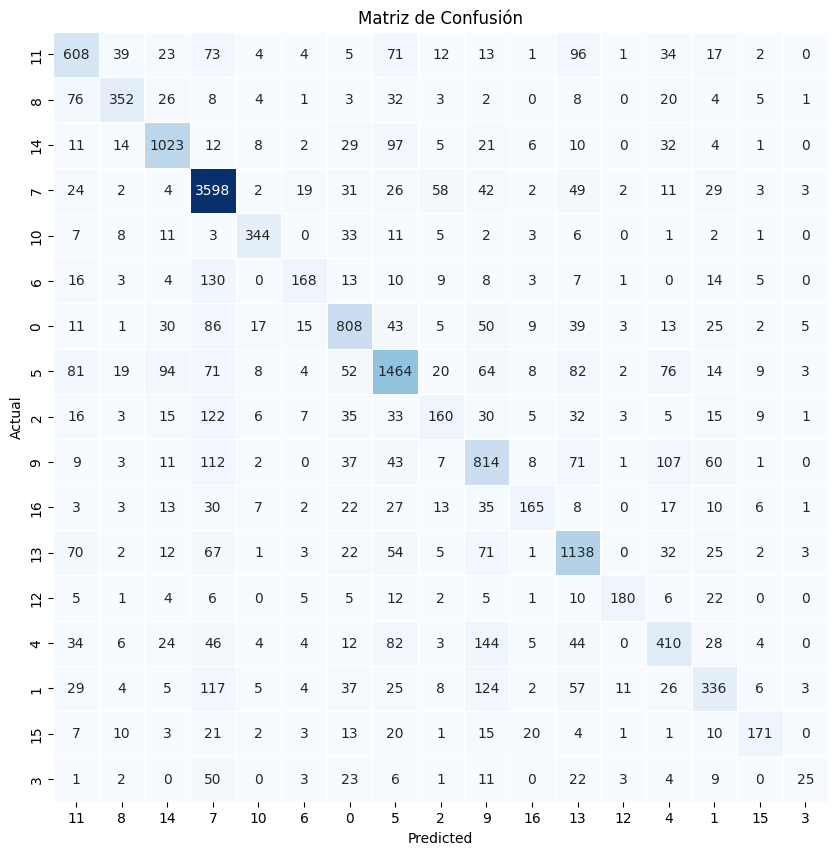

In [76]:
matriz_confusion(model,[X_test_padded_des, X_test_padded_tit, X_test_categorical],pd.DataFrame(y_test_encoded)[0], True)

526/526 [==============================] - 5s 9ms/step


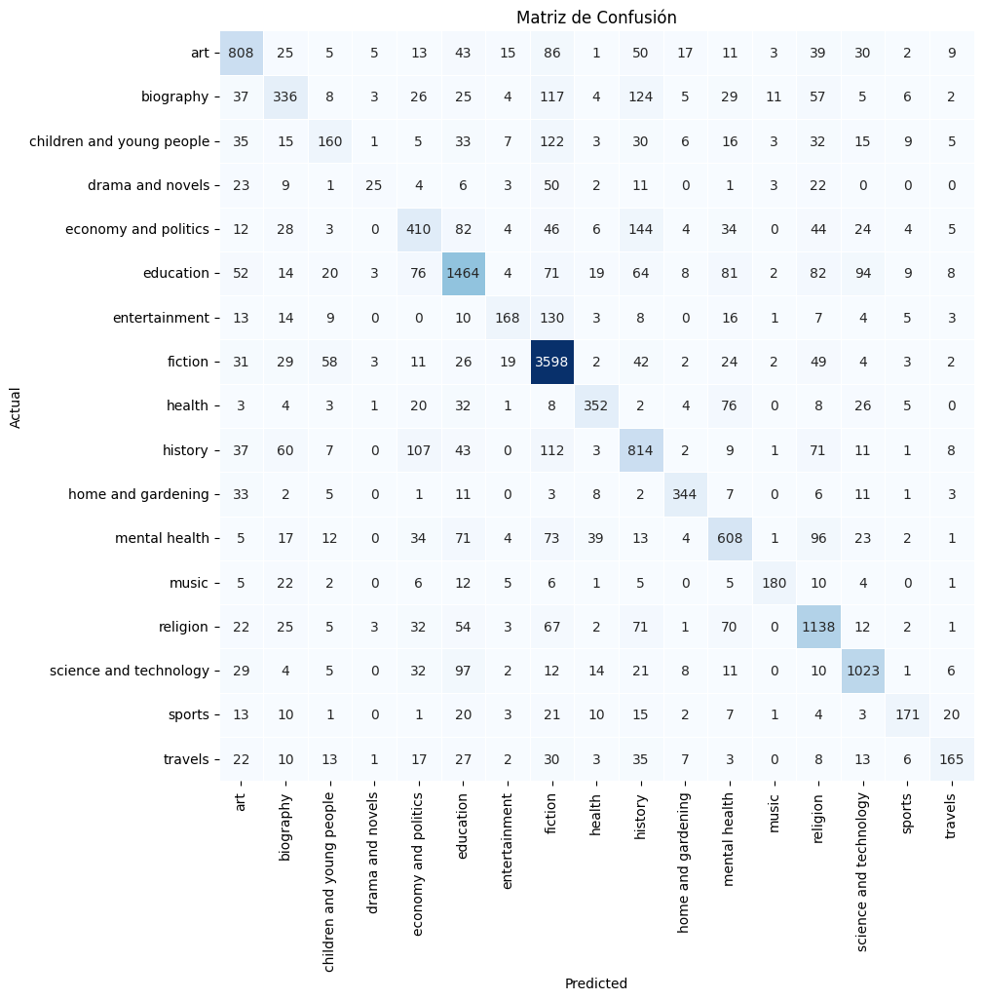

In [79]:
probs = model.predict([X_test_padded_des, X_test_padded_tit, X_test_categorical])
clases_mas_probables = []
for pred in probs:
    clase_mas_probable = np.argmax(pred)
    clases_mas_probables.append(clase_mas_probable)
y_pred = np.array(clases_mas_probables)


class_names =np.unique(label_encoder.inverse_transform(y_test_encoded))
cm = confusion_matrix( label_encoder.inverse_transform(y_test_encoded), label_encoder.inverse_transform(y_pred),labels = class_names)

plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', linewidths=.5, cbar=False, xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Matriz de Confusión')
plt.show()

# Predecir Score

El objetivo en este modelo es predecir el score dado, basado en la reseña que dio el usuario, hay que recordar que nuestro modelo objetivo es un sistema de recomendacion, el objetivo de este modelo es tener una representacion numerica de la reseña que un cliente da a un libro, se tiene el score como representacion numerica pero es muy simple y la reseña escrita puede aportar más información, entonces el objetivo es entrenar una red neuronal que tome como entrada el texto de la reseña y prediga el score que el usuario le dio al libro, despues tomar la salida de ultima capa oculta de la red neuronal como nuestra representación numerico, tambien se le conoce a esto como embbeding, solo tomaremos en cuenta los registros con información de score y review

In [128]:
df = df3.loc[df3['t_review_summary'] != 'no information', ['t_review_text' ,'c_review_score']]
df

,t_review_text,c_review_score
0,101 series every leader needs know attitude dr...,3.0
1,best book show grow wealth read many times boo...,5.0
2,best book show grow wealth read many times boo...,5.0
3,language cursing little difficult wade need fi...,4.0
4,brought back fore persons acquainted books del...,5.0
...,...,...
1054906,one bridge cross must read anyone interested l...,5.0
1054907,phantom soldier natural follow john poole book...,5.0
1054908,john poole best writing yet tiger way best boo...,5.0
1054909,tactics crescent moon survival guide people in...,5.0


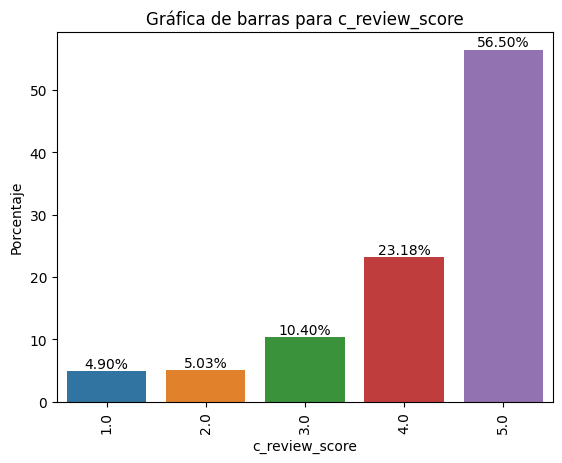

In [ ]:
prop = df['c_review_score'].value_counts(normalize=True) * 100

ax = sns.barplot(x=prop.index, y=prop.values)
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', fontsize=10, color='black', xytext=(0, 5), textcoords='offset points')


plt.xlabel('c_review_score')
plt.ylabel('Porcentaje')
plt.title('Gráfica de barras para c_review_score')
plt.xticks(rotation=90)
plt.show()

vemos que, en general la gente califica bien a los libros, realizemos una grafica de nube de palabras para ver si hay diferencia entre las palabras más mencionadas en cada calificacion de score

In [ ]:
mask = np.array(Image.open(ruta + 'nube.png'))

**Score de 5**

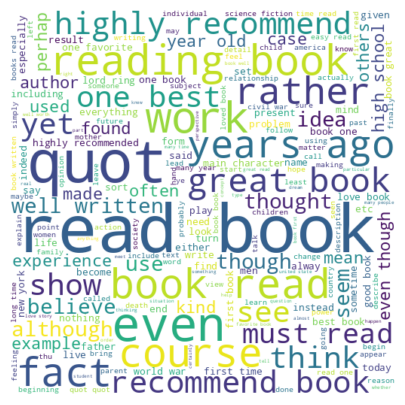

In [ ]:
text = " ".join(mensaje for mensaje in df.loc[df['c_review_score'] == 5, 't_review_text'])

wordcloud = WordCloud(width=800, height=400, background_color='white', mask=mask).generate(text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

**score 4**

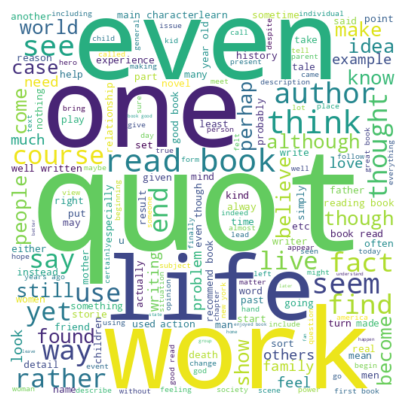

In [ ]:
text = " ".join(mensaje for mensaje in df.loc[df['c_review_score'] == 4, 't_review_text'])

wordcloud = WordCloud(width=800, height=400, background_color='white', mask=mask).generate(text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

**score 3**

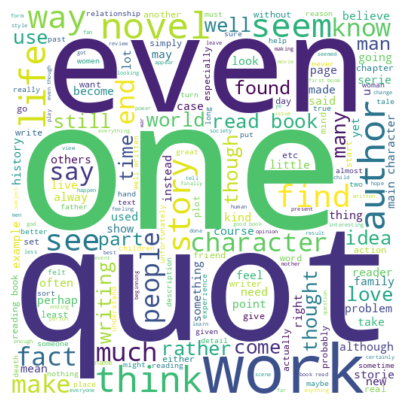

In [ ]:
text = " ".join(mensaje for mensaje in df.loc[df['c_review_score'] == 3, 't_review_text'])

wordcloud = WordCloud(width=800, height=400, background_color='white', mask=mask).generate(text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

**score 2**

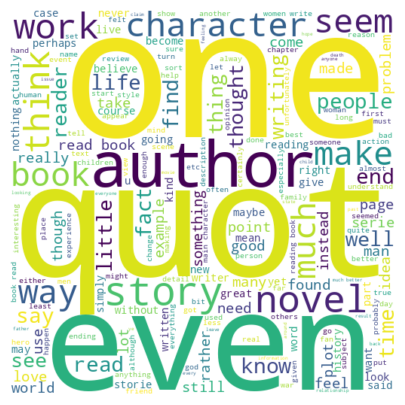

In [ ]:
text = " ".join(mensaje for mensaje in df.loc[df['c_review_score'] == 2, 't_review_text'])

wordcloud = WordCloud(width=800, height=400, background_color='white', mask=mask).generate(text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

**score 1**

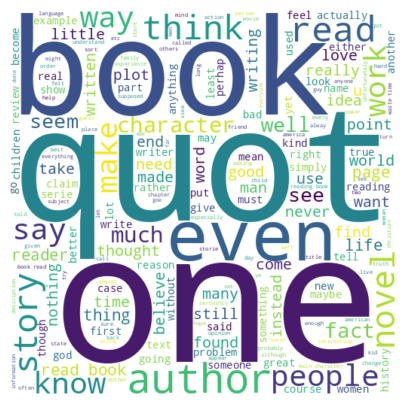

In [ ]:
text = " ".join(mensaje for mensaje in df.loc[df['c_review_score'] == 1, 't_review_text'])

wordcloud = WordCloud(width=800, height=400, background_color='white', mask=mask).generate(text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

para este caso no se ve una diferencia significativa al contemplar solo una palabra

## Modelo 1

In [129]:
X = df['t_review_text']
y = df['c_review_score'] - 1
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, stratify=y, random_state=42)

el -1 se uso para tener valores validos que tensorflow acepte, al ser 5 categorias solo acepta de 0 a 4

In [ ]:
 max(X.apply(lambda x: len(x.split())))

3278

In [ ]:
(X.apply(lambda x: len(x.split()))).describe()

count    1.054894e+06
mean     9.727793e+01
std      1.045852e+02
min      0.000000e+00
25%      3.100000e+01
50%      6.500000e+01
75%      1.270000e+02
max      3.278000e+03
Name: t_review_text, dtype: float64

In [130]:


max_words = 10000
tokenizer = Tokenizer(num_words=max_words, oov_token="<OOV>")
tokenizer.fit_on_texts(X_train)

X_train_seq = tokenizer.texts_to_sequences(X_train)
X_test_seq = tokenizer.texts_to_sequences(X_test)

max_sequence_length = 200
X_train_padded = pad_sequences(X_train_seq, maxlen=max_sequence_length, padding = 'post', truncating = 'post')
X_test_padded = pad_sequences(X_test_seq, maxlen=max_sequence_length, padding = 'post', truncating = 'post')

model = keras.Sequential()
model.add(Embedding(input_dim=max_words, output_dim=128, input_length=max_sequence_length))
model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dense(5, activation='softmax'))

model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])




In [131]:
tensorboard = TensorBoard(log_dir=ruta + '/logs')

In [132]:


history = model.fit(X_train_padded, y_train, validation_data=(X_test_padded, y_test), epochs=5, batch_size=64)


acc = model.evaluate(X_test_padded, y_test)
print("Mean Absolute Error on Test Data:", acc)

Epoch 1/5
14011/14011 [==============================] - 261s 19ms/step - loss: 0.8613 - accuracy: 0.6521 - val_loss: 0.7891 - val_accuracy: 0.6839
Epoch 2/5
14011/14011 [==============================] - 264s 19ms/step - loss: 0.6183 - accuracy: 0.7582 - val_loss: 0.7797 - val_accuracy: 0.7047
Epoch 3/5
14011/14011 [==============================] - 261s 19ms/step - loss: 0.4177 - accuracy: 0.8409 - val_loss: 0.9025 - val_accuracy: 0.7068
Epoch 4/5
14011/14011 [==============================] - 262s 19ms/step - loss: 0.2918 - accuracy: 0.8916 - val_loss: 1.1407 - val_accuracy: 0.7038
Epoch 5/5
4945/4945 [==============================] - 20s 4ms/step - loss: 1.4239 - accuracy: 0.7042
Mean Absolute Error on Test Data: [1.423912763595581, 0.704224705696106]


In [133]:
model.evaluate(X_test_padded, y_test)

4945/4945 [==============================] - 20s 4ms/step - loss: 1.4239 - accuracy: 0.7042


[1.423912763595581, 0.704224705696106]

In [134]:

get_cv_scores_report_multiclass_tf(model,X_train_padded,y_train)

28021/28021 [==============================] - 104s 4ms/step


,Metric,Value
0,Accuracy,0.957845
1,Precision,0.945615
2,Recall,0.941918
3,F1-Score,0.943655


In [135]:

get_cv_scores_report_multiclass_tf(model,X_test_padded,y_test)

4945/4945 [==============================] - 18s 4ms/step


,Metric,Value
0,Accuracy,0.704225
1,Precision,0.606871
2,Recall,0.586768
3,F1-Score,0.595892


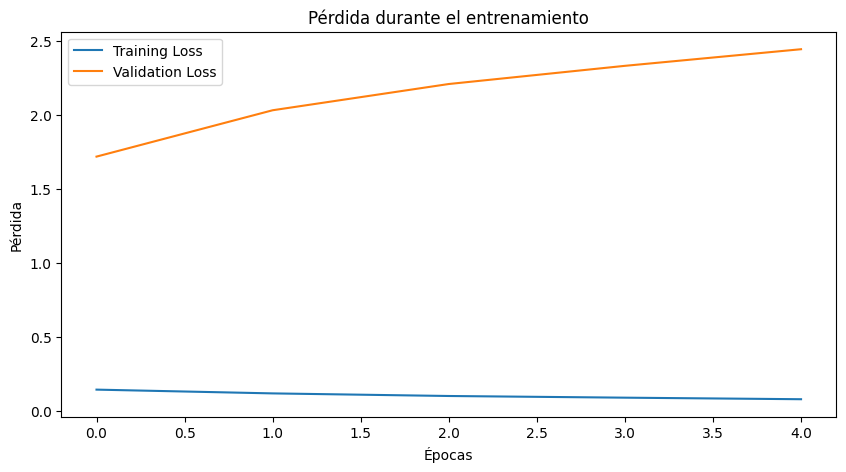

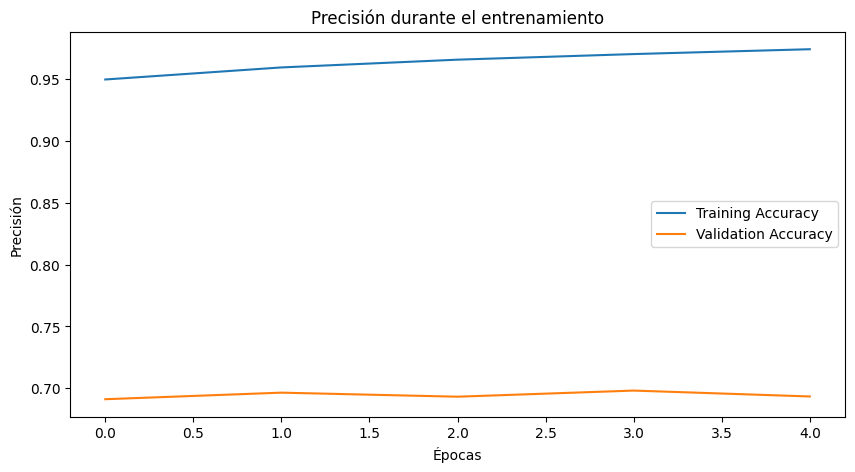

In [ ]:
import matplotlib.pyplot as plt


plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Pérdida durante el entrenamiento')
plt.xlabel('Épocas')
plt.ylabel('Pérdida')
plt.legend()
plt.show()

if 'accuracy' in history.history:
    plt.figure(figsize=(10, 5))
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Precisión durante el entrenamiento')
    plt.xlabel('Épocas')
    plt.ylabel('Precisión')
    plt.legend()
    plt.show()


el modelo claramente esta sobreajustado, agreguemos otra capa y reduzcamo la ultima capa ooculya

## Modelo 2

In [136]:
model2 = keras.Sequential()
model2.add(Embedding(input_dim=max_words, output_dim=128, input_length=max_sequence_length))
model2.add(Flatten())
model2.add(Dense(64, activation='relu'))
model2.add(Dense(16, activation='relu'))
model2.add(Dense(5, activation='softmax'))
model2.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])



In [137]:

history = model2.fit(X_train_padded, y_train, validation_data=(X_test_padded, y_test), epochs=10, batch_size=64, callbacks=[tensorboard])


Epoch 1/10
14011/14011 [==============================] - 273s 19ms/step - loss: 0.8695 - accuracy: 0.6478 - val_loss: 0.8069 - val_accuracy: 0.6773
Epoch 2/10
14011/14011 [==============================] - 273s 19ms/step - loss: 0.6420 - accuracy: 0.7488 - val_loss: 0.7793 - val_accuracy: 0.7032
Epoch 3/10
14011/14011 [==============================] - 271s 19ms/step - loss: 0.4432 - accuracy: 0.8331 - val_loss: 0.8871 - val_accuracy: 0.6991
Epoch 4/10
14011/14011 [==============================] - 270s 19ms/step - loss: 0.3174 - accuracy: 0.8840 - val_loss: 1.0426 - val_accuracy: 0.7007
Epoch 5/10
14011/14011 [==============================] - 270s 19ms/step - loss: 0.2433 - accuracy: 0.9131 - val_loss: 1.1825 - val_accuracy: 0.7087
Epoch 6/10
14011/14011 [==============================] - 272s 19ms/step - loss: 0.1953 - accuracy: 0.9314 - val_loss: 1.3278 - val_accuracy: 0.7050
Epoch 7/10
14011/14011 [==============================] - 283s 20ms/step - loss: 0.1629 - accuracy: 0.9433

In [138]:
model2.evaluate(X_test_padded, y_test)

4945/4945 [==============================] - 20s 4ms/step - loss: 1.4239 - accuracy: 0.7042


[1.423912763595581, 0.704224705696106]

In [139]:

get_cv_scores_report_multiclass_tf(model2,X_train_padded,y_train)

28021/28021 [==============================] - 103s 4ms/step


,Metric,Value
0,Accuracy,0.980261
1,Precision,0.970823
2,Recall,0.970306
3,F1-Score,0.970557


In [141]:

get_cv_scores_report_multiclass_tf(model2,X_test_padded,y_test)

4945/4945 [==============================] - 19s 4ms/step


,Metric,Value
0,Accuracy,0.709299
1,Precision,0.619608
2,Recall,0.595535
3,F1-Score,0.606791


In [ ]:
model2.save(ruta + 'NNA1')

In [ ]:
%tensorboard --logdir=/content/drive/MyDrive/cursos_ciencia_de_Datos/diplomado_ciencia_de_datos/modulo2/proyecto/logs --port=6007


<IPython.core.display.Javascript object>

## Modelo 3

In [110]:
X = df['t_review_text']
y = df['c_review_score'] - 1
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, stratify=y, random_state=42)

In [111]:

max_words = 200000
tokenizer = Tokenizer(num_words=max_words, oov_token="<OOV>")
tokenizer.fit_on_texts(X_train)

X_train_seq = tokenizer.texts_to_sequences(X_train)
X_test_seq = tokenizer.texts_to_sequences(X_test)

max_sequence_length = 300
X_train_padded = pad_sequences(X_train_seq, maxlen=max_sequence_length, padding = 'post', truncating = 'post')
X_test_padded = pad_sequences(X_test_seq, maxlen=max_sequence_length, padding = 'post', truncating = 'post')


In [102]:

model_fasttext = KeyedVectors.load_word2vec_format('/content/drive/MyDrive/cursos_ciencia_de_Datos/diplomado_ciencia_de_datos/modulo1/proyecto final/wiki-news-300d-1M.vec', binary=False)


In [ ]:
 len(tokenizer.word_index)

536685

In [ ]:
vocab_size = 200000
embedding_matrix = np.zeros((vocab_size , 300))
for word, idx in tokenizer.word_index.items():
    if idx < vocab_size:
        if word in model_fasttext:
            embedding_matrix[idx] = model_fasttext[word]
        else:
            # Si la palabra no está en el modelo preentrenado, puedes asignar un vector especial, por ejemplo, ceros.
            # Otra opción es asignar un vector aleatorio o un vector promedio de todas las palabras.
            pass

In [ ]:

model5 = keras.Sequential()
model5.add(Embedding(input_dim=max_words, output_dim=300, input_length=max_sequence_length, weights=[embedding_matrix]))
model5.add(Flatten())
model5.add(Dense(64, activation='relu'))
model5.add(Dropout(0.4))
model5.add(Dense(5, activation='softmax'))
custom_learning_rate = 0.00002

optimizer = tf.keras.optimizers.Adam(learning_rate=custom_learning_rate)

model5.compile(loss='sparse_categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=False
)


history = model5.fit(X_train_padded, y_train, validation_data=(X_test_padded, y_test), epochs=50, batch_size=64, callbacks=[early_stopping]   )

Epoch 1/50
14011/14011 [==============================] - 372s 26ms/step - loss: 1.0283 - accuracy: 0.5922 - val_loss: 0.9080 - val_accuracy: 0.6286
Epoch 2/50
14011/14011 [==============================] - 271s 19ms/step - loss: 0.8677 - accuracy: 0.6496 - val_loss: 0.8473 - val_accuracy: 0.6552
Epoch 3/50
14011/14011 [==============================] - 268s 19ms/step - loss: 0.7859 - accuracy: 0.6865 - val_loss: 0.8142 - val_accuracy: 0.6706
Epoch 4/50
14011/14011 [==============================] - 267s 19ms/step - loss: 0.7178 - accuracy: 0.7193 - val_loss: 0.7939 - val_accuracy: 0.6806
Epoch 5/50
14011/14011 [==============================] - 265s 19ms/step - loss: 0.6523 - accuracy: 0.7498 - val_loss: 0.7877 - val_accuracy: 0.6898
Epoch 6/50
14011/14011 [==============================] - 265s 19ms/step - loss: 0.5891 - accuracy: 0.7787 - val_loss: 0.7855 - val_accuracy: 0.6933
Epoch 7/50
14011/14011 [==============================] - 264s 19ms/step - loss: 0.5284 - accuracy: 0.8061

In [ ]:
model5.save(ruta + 'NNA5')

In [ ]:
model5.evaluate(X_test_padded, y_test)

4945/4945 [==============================] - 11s 2ms/step - loss: 1.2074 - accuracy: 0.7233


[1.207353949546814, 0.7232786417007446]

In [114]:

get_cv_scores_report_multiclass_tf(model5,X_test_padded,y_test)

4945/4945 [==============================] - 37s 8ms/step


,Metric,Value
0,Accuracy,0.723279
1,Precision,0.645136
2,Recall,0.601242
3,F1-Score,0.620523


In [ ]:
with open(ruta  + 'tokm2.pkl', 'wb') as archivo:
    pickle.dump(tokenizer, archivo)

4945/4945 [==============================] - 7s 1ms/step
[4 0 2 ... 3 3 2]


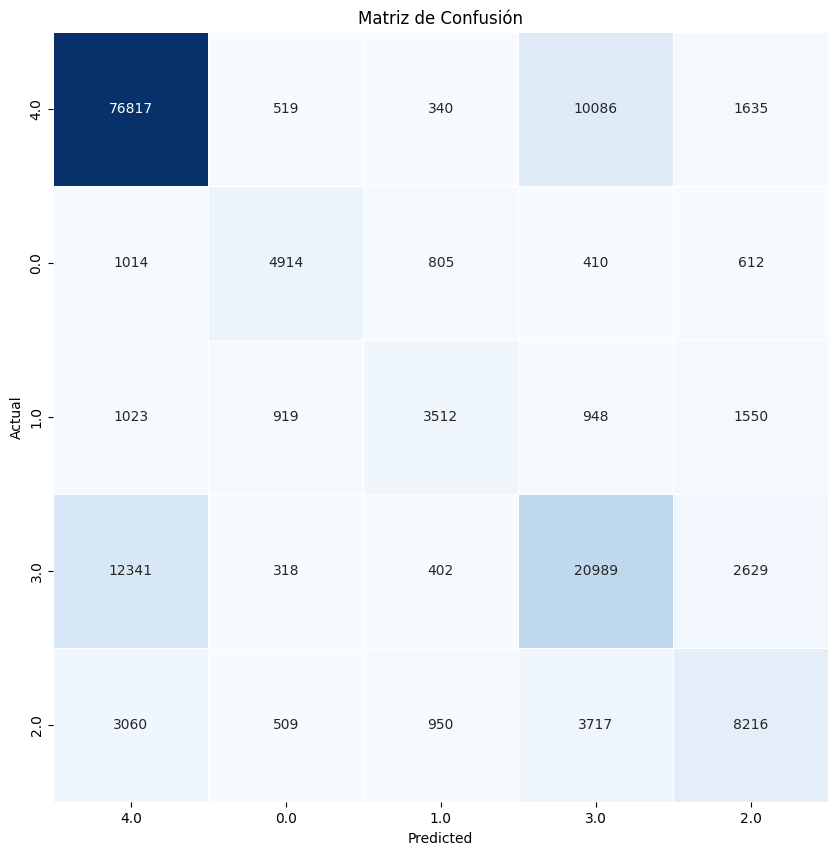

In [ ]:
matriz_confusion(model5,X_test_padded,y_test, True)

4945/4945 [==============================] - 39s 8ms/step
[4 0 2 ... 3 3 2]


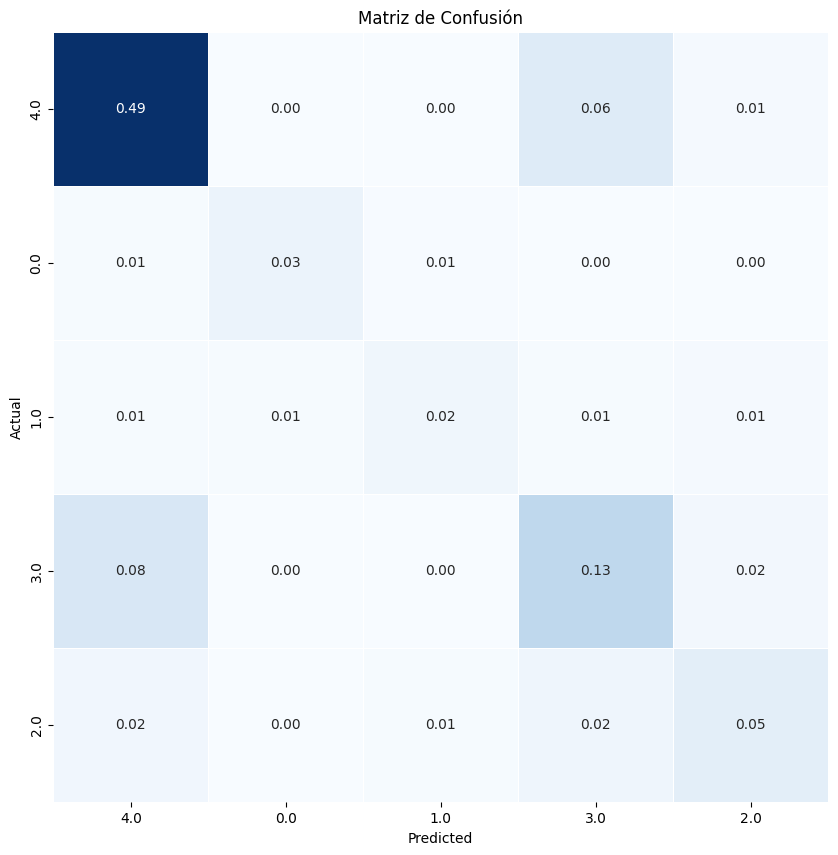

In [ ]:
matriz_confusion(model5,X_test_padded,y_test, True, 'all')

## Modelo 4

In [116]:
df.loc[df['c_review_score'].isin([1,2]), 'c_review_score']  = 0

In [117]:
df.loc[df['c_review_score'] == 3, 'c_review_score']  = 1

In [118]:
df.loc[df['c_review_score'].isin([4,5]), 'c_review_score']  = 2

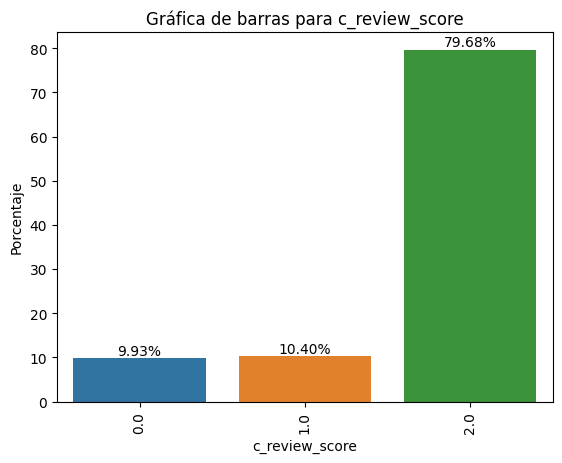

In [119]:
prop = df['c_review_score'].value_counts(normalize=True) * 100

ax = sns.barplot(x=prop.index, y=prop.values)
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', fontsize=10, color='black', xytext=(0, 5), textcoords='offset points')


plt.xlabel('c_review_score')
plt.ylabel('Porcentaje')
plt.title('Gráfica de barras para c_review_score')
plt.xticks(rotation=90)
plt.show()

In [120]:
X = df['t_review_text']
y = df['c_review_score']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, stratify=y, random_state=42)

In [121]:

max_words = 200000
tokenizer = Tokenizer(num_words=max_words, oov_token="<OOV>")
tokenizer.fit_on_texts(X_train)

X_train_seq = tokenizer.texts_to_sequences(X_train)
X_test_seq = tokenizer.texts_to_sequences(X_test)

max_sequence_length = 300
X_train_padded = pad_sequences(X_train_seq, maxlen=max_sequence_length, padding = 'post', truncating = 'post')
X_test_padded = pad_sequences(X_test_seq, maxlen=max_sequence_length, padding = 'post', truncating = 'post')


In [ ]:

model_fasttext = KeyedVectors.load_word2vec_format('/content/drive/MyDrive/cursos_ciencia_de_Datos/diplomado_ciencia_de_datos/modulo1/proyecto final/wiki-news-300d-1M.vec', binary=False)


In [ ]:
 len(tokenizer.word_index)

537172

In [ ]:
vocab_size = 200000
embedding_matrix = np.zeros((vocab_size , 300))
for word, idx in tokenizer.word_index.items():
    if idx < vocab_size:
        if word in model_fasttext:
            embedding_matrix[idx] = model_fasttext[word]
        else:
            # Si la palabra no está en el modelo preentrenado, puedes asignar un vector especial, por ejemplo, ceros.
            # Otra opción es asignar un vector aleatorio o un vector promedio de todas las palabras.
            pass

In [ ]:

model6 = keras.Sequential()
model6.add(Embedding(input_dim=max_words, output_dim=300, input_length=max_sequence_length, weights=[embedding_matrix]))
model6.add(Flatten())
model6.add(Dense(64, activation='relu'))
model6.add(Dropout(0.4))
model6.add(Dense(3, activation='softmax'))
custom_learning_rate = 0.00002

optimizer = tf.keras.optimizers.Adam(learning_rate=custom_learning_rate)

model6.compile(loss='sparse_categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=False
)


history = model6.fit(X_train_padded, y_train, validation_data=(X_test_padded, y_test), epochs=50, batch_size=64, callbacks=[early_stopping]   )

Epoch 1/50
14011/14011 [==============================] - 439s 31ms/step - loss: 0.5082 - accuracy: 0.8183 - val_loss: 0.4270 - val_accuracy: 0.8395
Epoch 2/50
14011/14011 [==============================] - 278s 20ms/step - loss: 0.3939 - accuracy: 0.8528 - val_loss: 0.3912 - val_accuracy: 0.8540
Epoch 3/50
14011/14011 [==============================] - 271s 19ms/step - loss: 0.3416 - accuracy: 0.8724 - val_loss: 0.3777 - val_accuracy: 0.8617
Epoch 4/50
14011/14011 [==============================] - 266s 19ms/step - loss: 0.2979 - accuracy: 0.8903 - val_loss: 0.3730 - val_accuracy: 0.8661
Epoch 5/50
14011/14011 [==============================] - 266s 19ms/step - loss: 0.2575 - accuracy: 0.9068 - val_loss: 0.3734 - val_accuracy: 0.8693
Epoch 6/50
14011/14011 [==============================] - 263s 19ms/step - loss: 0.2198 - accuracy: 0.9221 - val_loss: 0.3846 - val_accuracy: 0.8704
Epoch 7/50
14011/14011 [==============================] - 252s 18ms/step - loss: 0.1853 - accuracy: 0.9363

In [ ]:
model6.save(ruta + 'NNA6')

In [ ]:
model6.evaluate(X_test_padded, y_test)

4945/4945 [==============================] - 11s 2ms/step - loss: 0.6638 - accuracy: 0.8764


[0.6638123989105225, 0.8763611316680908]

In [122]:
model6.evaluate(X_test_padded, y_test)

4945/4945 [==============================] - 45s 9ms/step - loss: 0.6638 - accuracy: 0.8764


[0.6638123989105225, 0.8763611316680908]

In [125]:

get_cv_scores_report_multiclass_tf(model6,X_train_padded,y_train)

28021/28021 [==============================] - 207s 7ms/step


,Metric,Value
0,Accuracy,0.994074
1,Precision,0.991548
2,Recall,0.984016
3,F1-Score,0.987753


In [126]:

get_cv_scores_report_multiclass_tf(model6,X_test_padded,y_test)

4945/4945 [==============================] - 37s 7ms/step


,Metric,Value
0,Accuracy,0.876361
1,Precision,0.746756
2,Recall,0.709525
3,F1-Score,0.726846


In [ ]:
with open(ruta  + 'tokm3.pkl', 'wb') as archivo:
    pickle.dump(tokenizer, archivo)

4945/4945 [==============================] - 38s 8ms/step
[2 1 2 ... 2 2 1]


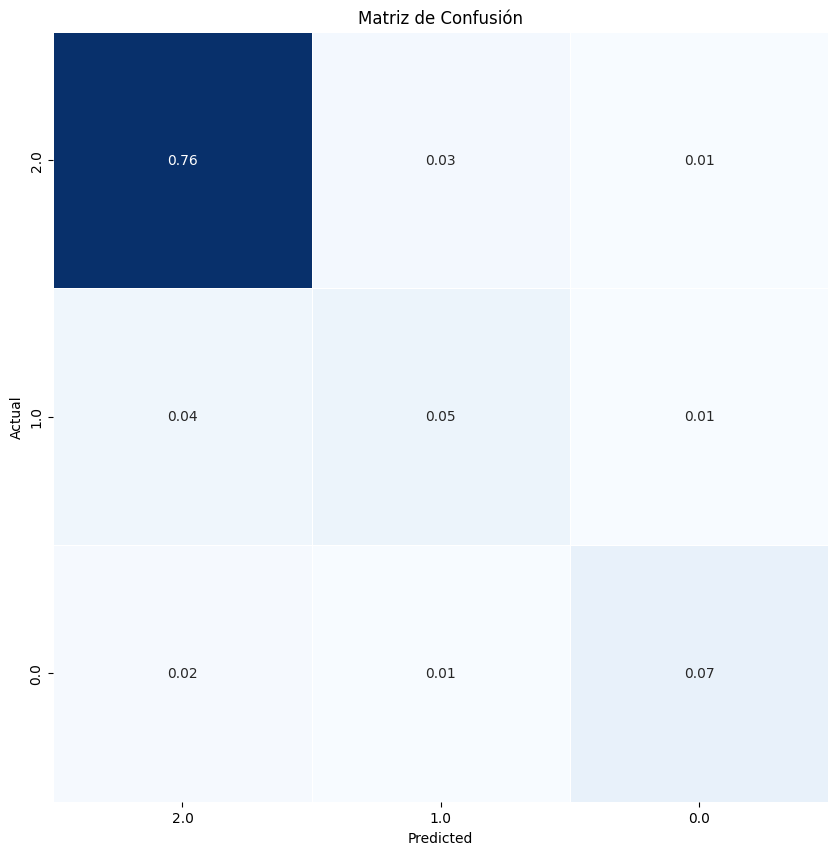

In [ ]:
matriz_confusion(model6,X_test_padded,y_test, True, 'all')

In [107]:
model5 = keras.models.load_model(ruta + 'NNA5')